
* Leer los archivos de incidencia de rayos para Asunción, Central, Ñeembucu y Concepción.
* Leer el archivo de temperatura y humedad interpolado.
* Combinar estos conjuntos de datos en una sola serie temporal, asegurándonos de que estén alineados en el tiempo.
* Explorar y preparar el conjunto de datos para el modelo de predicción.
https://www.lookmovie2.to/shows/play/1692618308-rick-and-morty-2013##S7-E3-246154

# Parte 01

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


* **Serie Temporal 1:** Incidencias de rayos (positivas y negativas) para Asunción y Central en conjunto con los datos de temperatura y humedad.
* **Serie Temporal 2:** Incidencias de rayos (separadas por polaridad) para Asunción y Central, y también para Concepción y Ñeembucu.
* **Serie Temporal 3:** Integración de todos los datos juntos.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import os
import seaborn as sns

In [ ]:


# Rutas de los archivos
ruta_temp_humedad = '/content/drive/MyDrive/earth-analytics/data/DMH_Rayos/procesados/Temp_Asu20092021_interpolado.csv'
rutas_rayos = {
    'Asuncion': '/content/drive/MyDrive/earth-analytics/data/DMH_Rayos/procesados/final_merged_Asuncion.csv',
    'Central': '/content/drive/MyDrive/earth-analytics/data/DMH_Rayos/procesados/final_merged_Central.csv',
    'Ñeembucu': '/content/drive/MyDrive/earth-analytics/data/DMH_Rayos/procesados/final_merged_Neembucu.csv',
    'Concepcion': '/content/drive/MyDrive/earth-analytics/data/DMH_Rayos/procesados/final_merged_Concepcion.csv'
}

# Leer y preparar el archivo de temperatura y humedad
df_temp_humedad = pd.read_csv(ruta_temp_humedad, index_col='Fecha', parse_dates=True)

# Leer y preparar los archivos de incidencia de rayos, sumando las incidencias por periodo
df_rayos = pd.DataFrame(index=df_temp_humedad.index)
for nombre, ruta in rutas_rayos.items():
    df_temp = pd.read_csv(ruta, index_col='timestamp', parse_dates=True)
    # Aquí asumimos que el archivo ya está en la frecuencia deseada, o puedes ajustarlo según sea necesario
    df_temp_resampled = df_temp.resample('30T').size()  # Cambiar '30T' si necesitas otra frecuencia
    df_rayos[nombre] = df_temp_resampled

# Combinar los datos de temperatura, humedad con los datos de incidencia de rayos

df_final = pd.concat([df_temp_humedad, df_rayos], axis=1)

# Ahora df_final contiene tanto los datos de temperatura y humedad como la cantidad de rayos por periodo para cada ubicación


In [ ]:
df_final=df_final.drop(columns=['Unnamed: 0'])
print(df_final)
df_final.describe()

                     Temperatura    Humedad  Asuncion  Central  Ñeembucu  \
Fecha                                                                      
2009-01-01 00:00:00    26.749483  69.609451       NaN      NaN       NaN   
2009-01-01 00:30:00    26.617255  71.045404       NaN      NaN       NaN   
2009-01-01 01:00:00    26.485027  72.481356       NaN      NaN       NaN   
2009-01-01 01:30:00    26.352799  73.917309       NaN      NaN       NaN   
2009-01-01 02:00:00    26.220570  75.353261       NaN      NaN       NaN   
...                          ...        ...       ...      ...       ...   
2021-12-31 19:00:00    40.044972  20.861568       1.0      1.0       1.0   
2021-12-31 19:30:00    39.445101  21.314759       1.0      1.0       1.0   
2021-12-31 20:00:00    38.845231  21.767949       1.0      1.0       1.0   
2021-12-31 20:30:00    38.245361  22.221140       1.0      1.0       1.0   
2021-12-31 21:00:00    37.645491  22.674331       1.0      1.0       1.0   

           

,Temperatura,Humedad,Asuncion,Central,Ñeembucu,Concepcion
count,227899.000000,227899.000000,105210.0,105210.0,105065.0,105209.0
mean,23.331657,69.583280,1.0,1.0,1.0,1.0
std,6.873175,20.724818,0.0,0.0,0.0,0.0
min,0.816554,11.362540,1.0,1.0,1.0,1.0
25%,18.915899,53.700014,1.0,1.0,1.0,1.0
50%,23.506668,71.937126,1.0,1.0,1.0,1.0
75%,27.962949,87.885599,1.0,1.0,1.0,1.0
max,45.408000,113.593546,1.0,1.0,1.0,1.0


# Tratar Valores Atípicos:

* Para temperatura y humedad, reemplazaremos los valores atípicos con la media de la serie.
* Para el conteo de incidencias de rayos, reemplazaremos los valores atípicos altos (definidos como aquellos significativamente más altos que la media) con la media calculada de los valores distintos de cero.
* Generar Series Temporales para el periodo de análisis.

###Tratamiento de Valores Atípicos

In [ ]:

def tratar_valores_atipicos(df, columnas):
  for col in columnas:
    # df=dfa.copy()
    df_filtered = df[df[col] > 0]  # Select non-zero values
    media = df_filtered[col].mean()
    desviacion_std = df[col].std()
    umbral_superior = media + 1 * desviacion_std
    # Para temperatura y humedad, reemplazamos los atípicos con la media
    if col in ['Temperatura', 'Humedad']:
      df[col] = df[col].mask((df[col] > 2.5*umbral_superior) | (df[col] < media - 3 * desviacion_std), media)
    # Para rayos, consideramos solo los valores altos atípicos y distintos de cero
    else:
      # return df
      # media_sin_ceros = df[df[col] > 0][col].mean()
      df[col] = df[col].mask(df[col] > umbral_superior, media)
  return df


# def tratar_valores_atipicos(df, columnas):
#   for col in columnas:
#     df_filtered = df[df[col] > 0]  # Select non-zero values
#     media = df_filtered[col].mean()
#     desviacion_std = df_filtered[col].std()
#     umbral_superior = media + 3 * desviacion_std  # Adjusted calculation for umbral_superior
# # Para temperatura y humedad, reemplazamos los atípicos con la media
#     if col in ['Temperatura', 'Humedad']:
#       df[col] = df[col].mask((df[col] > umbral_superior) | (df[col] < media - 3 * desviacion_std), media)
#             # Para rayos, consideramos solo los valores altos atípicos y distintos de cero
#     else:
#       media_sin_ceros = df[df[col] > 0][col].mean()
#       df[col] = df[col].mask((df[col] > umbral_superior, media_sin_ceros))
#   return df



###Carga y Preparación de Datos

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Rutas de archivos
ruta_base = '/content/drive/MyDrive/earth-analytics/data/DMH_Rayos/procesados/'
archivos_rayos = {
    'Asuncion': 'final_merged_Asuncion.csv',
    'Central': 'final_merged_Central.csv',
    'Ñeembucu': 'final_merged_Neembucu.csv',
    'Concepcion': 'final_merged_Concepcion.csv'
}
ruta_temp_humedad = ruta_base + 'Temp_Asu20092021_interpolado.csv'

# Cargar y preparar los archivos de temperatura y humedad
df_temp_humedad = pd.read_csv(ruta_temp_humedad, index_col='Fecha', parse_dates=True)

# Cargar y preparar los archivos de incidencia de rayos
df_rayos = {}
for lugar, archivo in archivos_rayos.items():
    df_rayos[lugar] = pd.read_csv(ruta_base + archivo, index_col='timestamp', parse_dates=True)
    df_rayos[lugar]= df_rayos[lugar].fillna(0)

In [ ]:
print(df_rayos['Concepcion'][16:100].describe())

         Positivo    Negativo
count   84.000000   84.000000
mean    13.178571   13.642857
std     72.751295   76.388929
min      0.000000    0.000000
25%      0.000000    0.000000
50%      0.000000    0.000000
75%      0.000000    0.000000
max    524.000000  587.000000


# parte 2

In [ ]:
# Cargar los archivos y aplicar el tratamiento de valores atípicos
df_temp_humedad = pd.read_csv(ruta_temp_humedad, index_col='Fecha', parse_dates=True)
df_temp_humedad = df_temp_humedad['2016':'2019']
df_temp_humedad = tratar_valores_atipicos(df_temp_humedad, ['Temperatura', 'Humedad'])
df_aux= df_temp_humedad
df_temp_humedad=pd.DataFrame()
df_temp_humedad['Temperatura']=df_aux['Temperatura']
df_temp_humedad['Humedad']=df_aux['Humedad']
df_rayos = {}
for lugar, archivo in archivos_rayos.items():
    df_temp = pd.read_csv(ruta_base + archivo, index_col='timestamp', parse_dates=True)
    df_temp = df_temp['2016':'2019']
    df_temp = tratar_valores_atipicos(df_temp, ['Positivo', 'Negativo'])
    df_rayos[lugar] = df_temp.fillna(0)

In [ ]:
df_final

,Temperatura,Humedad,Asuncion,Central,Ñeembucu,Concepcion
Fecha,,,,,,
2009-01-01 00:00:00,26.749483,69.609451,NaN,NaN,NaN,NaN
2009-01-01 00:30:00,26.617255,71.045404,NaN,NaN,NaN,NaN
2009-01-01 01:00:00,26.485027,72.481356,NaN,NaN,NaN,NaN
2009-01-01 01:30:00,26.352799,73.917309,NaN,NaN,NaN,NaN
2009-01-01 02:00:00,26.220570,75.353261,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
2021-12-31 19:00:00,40.044972,20.861568,1.0,1.0,1.0,1.0
2021-12-31 19:30:00,39.445101,21.314759,1.0,1.0,1.0,1.0
2021-12-31 20:00:00,38.845231,21.767949,1.0,1.0,1.0,1.0


In [ ]:
# df_rayos['Neembucu']=df_rayos['Ñeembucu']

for lugar, df in df_rayos.items():
    df_rayos[lugar] = df.fillna(0)
    print(df.describe())
    # df_rayos[lugar] =df_rayos[lugar][df_rayos[lugar].index> "2016-01-04 18:00:00"]
    # Crear un nuevo DataFrame con el nombre corregido y asignarlo de vuelta al diccionario df_rayos
df_rayos['Neembucu'] = df_rayos.pop('Ñeembucu')

           Positivo      Negativo
count  70127.000000  70127.000000
mean       0.393632      0.460413
std        3.925384      4.320772
min        0.000000      0.000000
25%        0.000000      0.000000
50%        0.000000      0.000000
75%        0.000000      0.000000
max       82.000000     76.000000
           Positivo      Negativo
count  70127.000000  70127.000000
mean       0.463122      0.509164
std        4.992118      4.865150
min        0.000000      0.000000
25%        0.000000      0.000000
50%        0.000000      0.000000
75%        0.000000      0.000000
max      119.000000     92.000000
           Positivo      Negativo
count  69982.000000  69982.000000
mean       0.473391      0.492643
std        4.430278      4.197744
min        0.000000      0.000000
25%        0.000000      0.000000
50%        0.000000      0.000000
75%        0.000000      0.000000
max       83.000000     68.000000
           Positivo      Negativo
count  70126.000000  70126.000000
mean       0.4

In [ ]:
print(df_rayos)

{'Asuncion':                      Positivo  Negativo
timestamp                              
2016-01-01 00:30:00       2.0       1.0
2016-01-01 01:00:00       2.0       2.0
2016-01-01 01:30:00       0.0       0.0
2016-01-01 02:00:00       0.0       0.0
2016-01-01 02:30:00       0.0       0.0
...                       ...       ...
2019-12-31 21:30:00       0.0       0.0
2019-12-31 22:00:00       0.0       0.0
2019-12-31 22:30:00       0.0       0.0
2019-12-31 23:00:00       0.0       0.0
2019-12-31 23:30:00       0.0       0.0

[70127 rows x 2 columns], 'Central':                      Positivo  Negativo
timestamp                              
2016-01-01 00:30:00       1.0       0.0
2016-01-01 01:00:00       2.0       0.0
2016-01-01 01:30:00       0.0       0.0
2016-01-01 02:00:00       2.0       0.0
2016-01-01 02:30:00       0.0       2.0
...                       ...       ...
2019-12-31 21:30:00       0.0       0.0
2019-12-31 22:00:00       0.0       0.0
2019-12-31 22:30:00       0.0

### Starnet load

 * Identificar la fecha de inicio más tardía entre todos los DataFrames.

* Recortar cada DataFrame para que comiencen desde esa fecha de inicio más tardía.

In [ ]:
data_path = "/content/drive/MyDrive/mmlastias/Startnet/resampled"

ubicaciones = {
    'Asuncion': (-25.301478, -57.536707),
    'Central': (-25.5628115, -57.5079912),
    'Ñeembucu': (-26.648707, -58.107135),
    'Concepcion': (-23.434573, -57.434246)
}

# Extensiones de los archivos
file_extension_1 = "(minus).csv"
file_extension_2 = "(plus).csv"
# Frecuencia de resampleo
resample_freq = "30T"
pol=['Negativo', 'Positivo']
polaridad=['minus', 'plus']
# Nombre de la nueva columna
locality_column = "Localidad"

In [ ]:
starnet_dfs=pd.DataFrame()

for ubicacion in ubicaciones:
  for sign in pol:
    polaridad= 'minus'
    if sign=='Positivo':
      polaridad='plus'
    path_startnet = os.path.join(data_path, f"{ubicacion}_resampl_{sign}.csv")
    df = pd.read_csv(path_startnet, index_col='timestamp', parse_dates=True)
    if ubicacion=='Ñeembucu':
      starnet_dfs[f"Neembucu_{sign}_snet"]=df[f'{ubicacion}_{sign}']
      # *df[f'{ubicacion}_wprom_{polaridad}']
      starnet_dfs[f"Neembucu_{sign}_snet"]=starnet_dfs[f"Neembucu_{sign}_snet"].fillna(0)

    else:
      starnet_dfs[f"{ubicacion}_{sign}_snet"]=df[f'{ubicacion}_{sign}']
      # *abs(df[f'{ubicacion}_wprom_{polaridad}'])

      starnet_dfs[f"{ubicacion}_{sign}_snet"]=starnet_dfs[f"{ubicacion}_{sign}_snet"].fillna(0)


starnet_dfs




,Asuncion_Negativo_snet,Asuncion_Positivo_snet,Central_Negativo_snet,Central_Positivo_snet,Neembucu_Negativo_snet,Neembucu_Positivo_snet,Concepcion_Negativo_snet,Concepcion_Positivo_snet
timestamp,,,,,,,,
2016-01-04 18:00:00,462.4,124.6,64.2,33.7,0.0,0.0,0.0,0.8
2016-01-04 18:30:00,4.8,0.9,6.1,0.6,0.0,0.0,0.7,0.7
2016-01-04 19:30:00,7.4,2.3,0.0,0.0,0.0,0.0,1.5,3.5
2016-01-04 20:00:00,200.2,124.2,1.8,0.8,0.0,0.0,3.3,1.0
2016-01-04 20:30:00,63.0,202.5,8.7,20.8,0.0,0.0,9.0,0.7
...,...,...,...,...,...,...,...,...
2018-12-31 20:30:00,2.5,0.6,0.0,0.0,0.0,0.0,0.0,1.0
2018-12-31 21:00:00,1.2,0.6,0.0,0.0,0.0,0.0,0.0,1.6
2018-12-31 21:30:00,2.7,1.2,1.5,0.7,0.0,0.0,0.6,0.0


In [ ]:
# Identifica la fecha de inicio más tardía entre todos los DataFrames.
fecha_inicio_max = pd.Timestamp.max
for df in df_rayos.values():
    fecha_inicio_actual = df.index.min()
    print(fecha_inicio_actual)
    if fecha_inicio_actual > fecha_inicio_max:
        fecha_inicio_max = fecha_inicio_actual
        print(fecha_inicio_max)


2016-01-01 00:30:00
2016-01-01 00:30:00
2016-01-01 01:00:00
2016-01-04 01:00:00


In [ ]:

# for df in starnet_dfs:
#   # for df in dfs:
#     fecha_inicio_actual = df.index.min()
#     print(fecha_inicio_actual)
#     if fecha_inicio_actual > fecha_inicio_max:
#         fecha_inicio_max = fecha_inicio_actual
#         print(fecha_inicio_max)



In [ ]:
fecha_inicio_max = pd.Timestamp('2016-01-04 18:00:00')

In [ ]:

for lugar in df_rayos:
    # print(l)
    df_rayos[lugar] = df_rayos[lugar][df_rayos[lugar].index >= fecha_inicio_max]
df_temp_humedad=df_temp_humedad[df_temp_humedad.index >= fecha_inicio_max  ]

new_stnet=[]
for starn in starnet_dfs:
  # for lugar in starn:
    # print(starn.index[0])
  aux=starnet_dfs[starn][starnet_dfs[starn].index  >= fecha_inicio_max  ]
  new_stnet.append(aux.dropna())
  # print(starnet_dfs[starn])
print(new_stnet[1].head())

timestamp
2016-01-04 18:00:00    124.6
2016-01-04 18:30:00      0.9
2016-01-04 19:30:00      2.3
2016-01-04 20:00:00    124.2
2016-01-04 20:30:00    202.5
Name: Asuncion_Positivo_snet, dtype: float64


In [ ]:
from numpy import unsignedinteger

In [ ]:
ubicaciones=['Asuncion',
             'Central',
             'Concepcion',
             'Neembucu',
             ]
polaridad=['Negativo','Positivo']

for ubicacion in ubicaciones:
  for sign in polaridad:
    if ubicacion== 'Neembucu':
      df_rayos[ubicacion][f"Snet_{sign}"]=abs(starnet_dfs[f"{ubicacion}_{sign}_snet"])
    else:

      df_rayos[ubicacion][f"Snet_{sign}"]= abs((starnet_dfs[f"{ubicacion}_{sign}_snet"]))
    # df_rayos[ubicacion][f"Snet_{ubicacion}_{sign}"].fillna(0)
    # df_rayos[ubicacion][f"w_{sign}"] =  starnet_dfs[f"{ubicacion}_{sign}_peso"]


<ipython-input-20-e8a05a3b481e>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rayos[ubicacion][f"Snet_{sign}"]=abs(starnet_dfs[f"{ubicacion}_{sign}_snet"])
<ipython-input-20-e8a05a3b481e>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rayos[ubicacion][f"Snet_{sign}"]=abs(starnet_dfs[f"{ubicacion}_{sign}_snet"])


In [ ]:
for ubicacion in ubicaciones:
  for col in df_rayos[ubicacion].columns:
    # Reemplaza los valores NaN por la media de la columna
    df_rayos[ubicacion][col].fillna(0, inplace=True)

<ipython-input-21-849b9d22a0ab>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rayos[ubicacion][col].fillna(0, inplace=True)


In [ ]:
df_rayos['Asuncion'][0:500]
# print(df_temp_humedad)
# print(new_stnet)

,Positivo,Negativo,Snet_Negativo,Snet_Positivo
timestamp,,,,
2016-01-04 18:00:00,25.0,67.000000,462.4,124.6
2016-01-04 18:30:00,0.0,0.000000,4.8,0.9
2016-01-04 19:00:00,0.0,0.000000,0.0,0.0
2016-01-04 19:30:00,1.0,0.000000,7.4,2.3
2016-01-04 20:00:00,48.0,50.001691,200.2,124.2
...,...,...,...,...
2016-01-15 01:30:00,0.0,0.000000,0.0,0.0
2016-01-15 02:00:00,0.0,0.000000,0.0,0.0
2016-01-15 02:30:00,0.0,0.000000,0.0,0.0


##

# Serie Temporal 1
Para Asunción y Central con datos de temperatura y humedad:

###Polaridad Positiva

In [ ]:
# Encuentra la fecha de inicio más tardía usando el índice de cada DataFrame
fecha_inicio_max = max(df.index.min() for df in df_rayos.values())

# Asegúrate de que todos los DataFrames comiencen en la misma fecha
df_rayos_sincronizados = {}
for lugar, df in df_rayos.items():
    df_sincronizado = df[df.index >= fecha_inicio_max]
    df_rayos_sincronizados[lugar] = df_sincronizado

df_rayos=df_rayos_sincronizados
# Remuestreo de los datos
df_temp_humedad_resampled = df_temp_humedad.resample('1D').mean()

df_rayos_resampled = {}
for lugar in ['Asuncion', 'Central',
              'Concepcion',
              'Neembucu',
              ]:
    # Suponiendo que los archivos CSV ya tienen las columnas 'Positivo' y 'Negativo'
    df_rayos_resampled[lugar] = df_rayos[lugar].resample('1D').sum()
    # Renombrar las columnas para incluir el nombre de la ciudad como prefijo
    df_rayos_resampled[lugar] =tratar_valores_atipicos(df_rayos_resampled[lugar], ['Positivo', 'Negativo'])
    df_rayos_resampled[lugar].columns = [f'{lugar}_{col}' for col in df_rayos_resampled[lugar].columns]
# print(df_rayos_resampled)

df_temp_humedad_resampled = tratar_valores_atipicos(df_temp_humedad_resampled, ['Temperatura', 'Humedad'])


# for lugar, archivo in archivos_rayos.items():
#     df_temp = df_rayos_resampled
#     # df_temp = df_temp['2016':'2021']
#     df_temp = tratar_valores_atipicos(df_temp, ['Positivo', 'Negativo'])
#     df_rayos_resampled[lugar] = df_temp
# Combinar los datos de temperatura, humedad con los datos de incidencia de rayos
# df_combinado = pd.concat([df_temp_humedad_resampled, *df_rayos_resampled.values()], axis=1)
df_combinado = pd.concat([df_temp_humedad_resampled, *df_rayos_resampled.values()], axis=1)
df_combinado['Asuncion-Central_Positivo'] = df_combinado['Central_Positivo'] + df_combinado['Asuncion_Positivo']
df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']
print(df_combinado.describe())

       Temperatura      Humedad  Asuncion_Positivo  Asuncion_Negativo  \
count  1458.000000  1458.000000        1458.000000        1458.000000   
mean     24.162972    62.712709          10.440984          12.658765   
std       5.884478    15.378312          29.033772          33.840222   
min       7.614736    23.284545           0.000000           0.000000   
25%      20.340325    51.445180           0.000000           0.000000   
50%      25.083124    62.477627           0.000000           0.000000   
75%      28.700395    73.662443           0.000000           0.000000   
max      35.109736    99.188114         157.531231         178.001691   

       Asuncion_Snet_Negativo  Asuncion_Snet_Positivo  Central_Positivo  \
count             1458.000000             1458.000000       1458.000000   
mean                37.427778               19.311248         11.810525   
std                314.095468              104.710256         33.832051   
min                  0.000000             

#parte 04 ACA ACOTO A LOS AÑOS 2016 A 2018



In [ ]:
# prompt: create new column as the sum of 2 existing columns

df_combinado['Asuncion-Central'] = df_combinado['Asuncion-Central_Negativo'] + df_combinado['Asuncion-Central_Positivo']
# df_combinado

{'Asuncion':             Asuncion_Positivo  Asuncion_Negativo  Asuncion_Snet_Negativo  \
timestamp                                                                  
2016-01-10         206.000000         368.003382                  1452.5   
2016-01-24          13.000000          42.000000                   181.4   
2016-02-07         379.265616         467.005073                  2356.8   
2016-02-21         418.328078         408.008455                  3031.9   
2016-03-06         169.000000         302.001691                   559.8   
...                       ...                ...                     ...   
2019-11-10         312.889361         357.215715                     0.0   
2019-11-24           3.000000          11.000000                     0.0   
2019-12-08         448.593693         405.008455                     0.0   
2019-12-22         599.328078         638.008455                     0.0   
2020-01-05           0.000000           0.000000                     0.0   

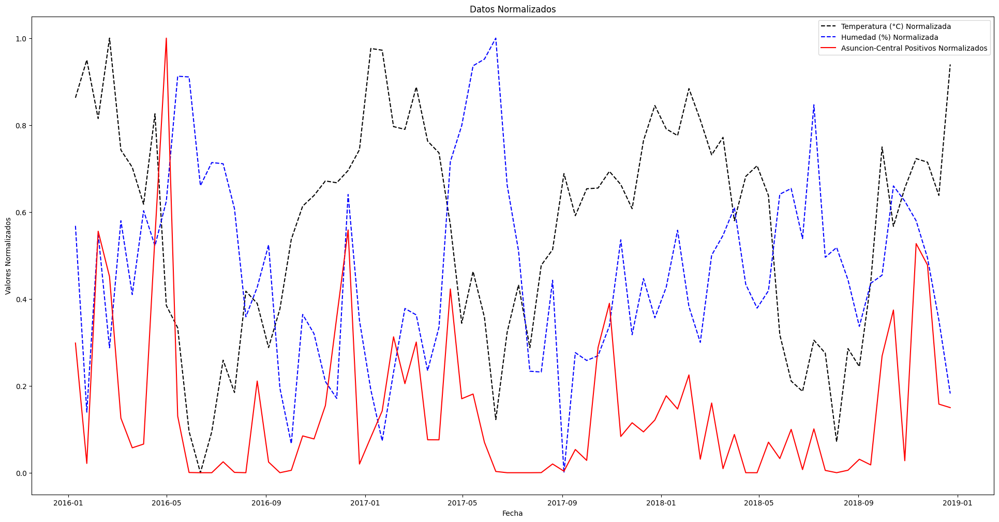

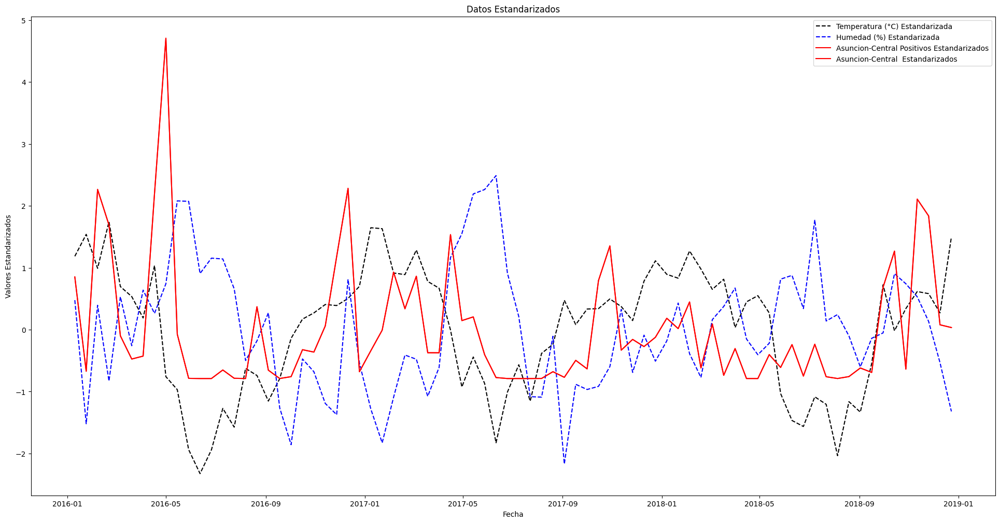

In [ ]:
# Remuestreo de los datos
df_temp_humedad_resampled = df_temp_humedad.resample('2W').mean()

df_rayos_resampled = {}
for lugar in ['Asuncion', 'Central','Concepcion','Neembucu']:
    # Suponiendo que los archivos CSV ya tienen las columnas 'Positivo' y 'Negativo'
    df_rayos_resampled[lugar] = df_rayos[lugar].resample('2W').sum()

    # df_rayos_resampled[f"{lugar}_snet"]=

    # df_rayos_resampled[f"{lugar}_snet_pes"]=
    # Renombrar las columnas para incluir el nombre de la ciudad como prefijo
    df_rayos_resampled[lugar] =tratar_valores_atipicos(df_rayos_resampled[lugar], ['Positivo', 'Negativo'])
    df_rayos_resampled[lugar].columns = [f'{lugar}_{col}' for col in df_rayos_resampled[lugar].columns]
print(df_rayos_resampled)

df_temp_humedad_resampled = tratar_valores_atipicos(df_temp_humedad_resampled, ['Temperatura', 'Humedad'])


# for lugar, archivo in archivos_rayos.items():
#     df_temp = df_rayos_resampled
#     # df_temp = df_temp['2016':'2021']
#     df_temp = tratar_valores_atipicos(df_temp, ['Positivo', 'Negativo'])
#     df_rayos_resampled[lugar] = df_temp
# Combinar los datos de temperatura, humedad con los datos de incidencia de rayos
# df_combinado = pd.concat([df_temp_humedad_resampled, *df_rayos_resampled.values()], axis=1)
df_combinado = pd.concat([df_temp_humedad_resampled, *df_rayos_resampled.values()], axis=1)
# df_combinado['Asuncion-Central_Positivo'] = df_combinado['Central_Positivo'] + df_combinado['Asuncion_Positivo']
# df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']
#  df_combinado['Asuncion-Central'] = 0.5*(df_combinado['Asuncion-Central_Negativo'] + df_combinado['Asuncion-Central_Positivo']) + 0.5*(df_combinado['Asuncion_Snet_Negativo']+df_combinado['Asuncion_Snet_Positivo']+df_combinado['Central_Snet_Negativo']+df_combinado['Central_Snet_Positivo'])
for lugar in ['Asuncion','Central','Neembucu','Concepcion']:
    df_combinado[lugar] = 0.5*(df_combinado[f'{lugar}_Negativo'] + df_combinado[f'{lugar}_Positivo']) + 0.5*(df_combinado[f'{lugar}_Snet_Negativo']+df_combinado[f'{lugar}_Snet_Positivo'])
df_combinado['Asuncion-Central'] = df_combinado['Central'] + df_combinado['Asuncion']
# df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']

# df_combinado['Neembucu'] = df_combinado['Neembucu_Negativo'] + df_combinado['Neembucu_Positivo']

# df_combinado['Concepcion'] = df_combinado['Concepcion_Negativo'] + df_combinado['Concepcion_Positivo']
# df_combinado['Concepcion_Negativo'] = df_rayos_resampled['Concepcion_Negativo']
# df_combinado['Neembucu_Positivo'] = df_rayos_resampled['Neembucu_Positivo']
# df_combinado['Concepcion_Positivo'] = df_rayos_resampled['Concepcion_Positivo']

df_combinado=df_combinado[(df_combinado.index >= '2016') & (df_combinado.index <= '2019')]

# Normalizar los datos
scaler_min_max = MinMaxScaler()
df_normalizado = pd.DataFrame(scaler_min_max.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)

# Estandarizar los datos
scaler_std = StandardScaler()
df_estandarizado = pd.DataFrame(scaler_std.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)

# Graficar los datos normalizados
plt.figure(figsize=(24, 12))
plt.plot(df_normalizado.index, df_normalizado['Temperatura'], label='Temperatura (°C) Normalizada',color='black', linestyle='--')
plt.plot(df_normalizado.index, df_normalizado['Humedad'], label='Humedad (%) Normalizada', color='blue', linestyle='--')
# plt.plot(df_normalizado.index, df_normalizado['Asuncion_Positivo'], label='Asuncion Positivos Normalizados', linestyle='--')
# plt.plot(df_normalizado.index, df_normalizado['Central_Positivo'], label='Central Positivos Normalizados', linestyle='--')


plt.plot(df_normalizado.index, df_normalizado['Asuncion-Central'], label='Asuncion-Central Positivos Normalizados', color='red')

plt.xlabel('Fecha')
plt.ylabel('Valores Normalizados')
plt.title('Datos Normalizados')
plt.legend()
plt.show()

# Graficar los datos estandarizados
plt.figure(figsize=(24, 12))
plt.plot(df_estandarizado.index, df_estandarizado['Temperatura'], label='Temperatura (°C) Estandarizada',color='black', linestyle='--')
plt.plot(df_estandarizado.index, df_estandarizado['Humedad'], label='Humedad (%) Estandarizada', color='blue', linestyle='--')
# plt.plot(df_estandarizado.index, df_estandarizado['Asuncion_Positivo'], label='Asuncion Positivos Estandarizados', linestyle='--')
# plt.plot(df_estandarizado.index, df_estandarizado['Central_Positivo'], label='Central Positivos Estandarizados', linestyle='--')
# Asegúrate de incluir el resto de las líneas para 'Negativo' si es necesario

plt.plot(df_estandarizado.index, df_estandarizado['Asuncion-Central'], label='Asuncion-Central Positivos Estandarizados', color='red')

plt.plot(df_estandarizado.index, df_estandarizado['Asuncion-Central'], label='Asuncion-Central  Estandarizados', color='red')

plt.xlabel('Fecha')
plt.ylabel('Valores Estandarizados')
plt.title('Datos Estandarizados')
plt.legend()
plt.show()


In [ ]:
# prompt: print just 3 specifiqs columns of df_combinado

print(df_combinado[["Temperatura", "Humedad", "Asuncion-Central"]])


            Temperatura    Humedad  Asuncion-Central
2016-01-10    29.710751  67.284908       2946.154056
2016-01-24    31.381045  47.729252        211.250000
2016-02-07    28.793305  66.472699       5486.787709
2016-02-21    32.341942  54.480706       4455.756787
2016-03-06    27.404766  67.820507       1241.050846
...                 ...        ...               ...
2018-10-28    25.725369  69.880652        272.900000
2018-11-11    27.024843  67.816355       5205.820311
2018-11-25    26.864200  63.914008       4718.315989
2018-12-09    25.399671  57.392973       1558.532622
2018-12-23    31.182360  49.679231       1479.246487

[78 rows x 3 columns]


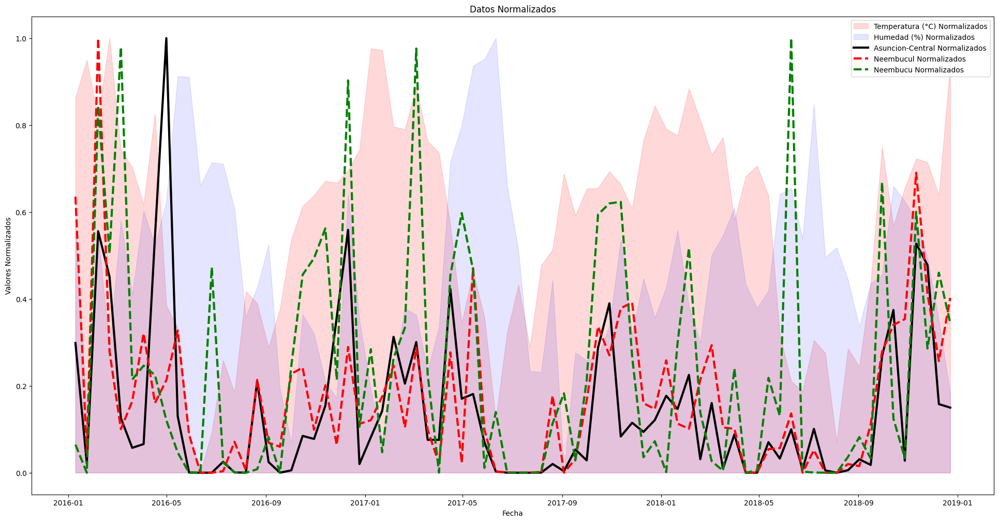

In [ ]:


# Graficar los datos estandarizados
plt.figure(figsize=(24, 12))
# Graficar la temperatura como un gráfico de área
plt.fill_between(df_normalizado.index, df_normalizado['Temperatura'], label='Temperatura (°C) Normalizados', color='red', alpha=0.15)

# Graficar la humedad como un gráfico de área
plt.fill_between(df_normalizado.index, df_normalizado['Humedad'], label='Humedad (%) Normalizados', color='blue', alpha=0.1)
# plt.plot(df_estandarizado.index, df_estandarizado['Asuncion_Positivo'], label='Asuncion Positivos Estandarizados', linestyle='--')
# plt.plot(df_estandarizado.index, df_estandarizado['Central_Positivo'], label='Central Positivos Estandarizados', linestyle='--')
# Asegúrate de incluir el resto de las líneas para 'Negativo' si es necesario

# plt.plot(df_normalizado.index, df_normalizado['Asuncion-Central_Negativo'],
#          label='Asuncion-Central Negativo Normalizados',
#          color='red',
#          linestyle='--',
#          )
# plt.plot(df_normalizado.index, df_normalizado['Asuncion-Central_Positivo'],
#          label='Asuncion-Central Positivos Normalizados',
#          color='blue',linestyle='dotted',
#          )
plt.plot(df_normalizado.index, df_normalizado['Asuncion-Central'],
         label='Asuncion-Central Normalizados',
         color='black',linewidth=3,
         )
plt.plot(df_normalizado.index, df_normalizado['Concepcion'],
         label='Neembucul Normalizados',
         color='red',linestyle='--',linewidth=3,
         )

plt.plot(df_normalizado.index, df_normalizado['Neembucu'],
         label='Neembucu Normalizados',
         color='green',linestyle='--',linewidth=3,
         )
plt.xlabel('Fecha')
plt.ylabel('Valores Normalizados')
plt.title('Datos Normalizados')
plt.legend()
plt.show()
# '-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashed', 'dashdot', 'dotted'



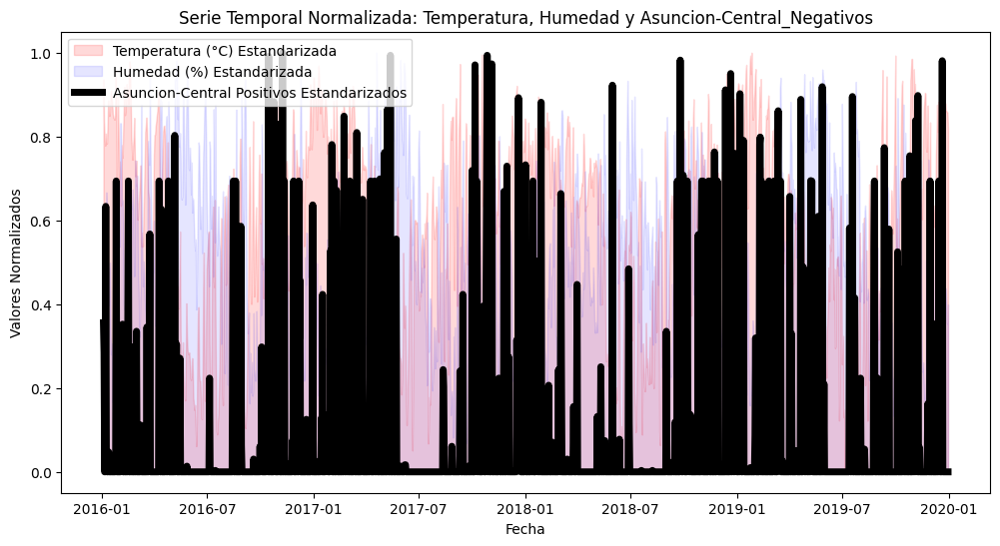

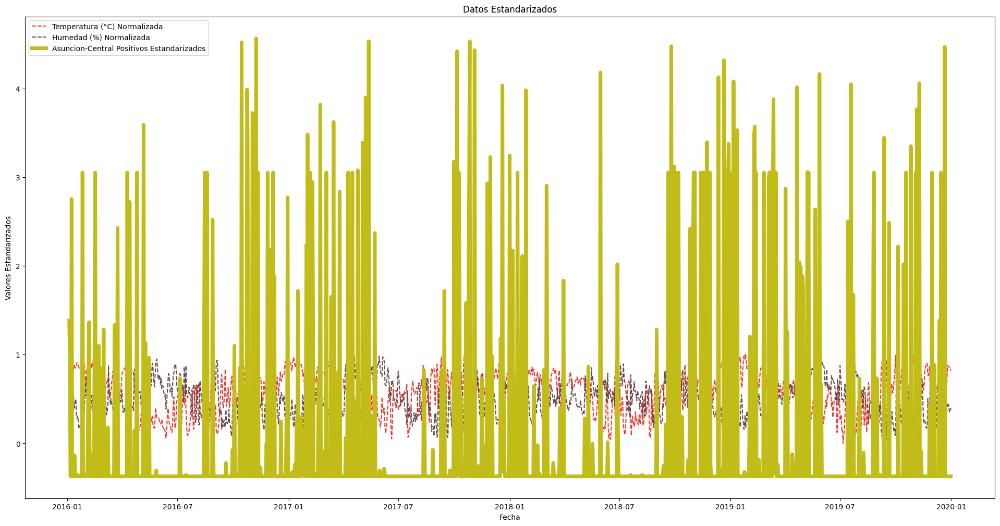

In [ ]:
                                                   # Asumiendo que df_temp_humedad_resampled y df_rayos_resampled ya están definidos y contienen datos remuestreados y tratados para valores atípicos.
# Remuestreo de los datos
df_temp_humedad_resampled = df_temp_humedad.resample('1D').mean()

df_rayos_resampled = {}
for lugar in ['Asuncion', 'Central','Concepcion','Neembucu']:
    # Suponiendo que los archivos CSV ya tienen las columnas 'Positivo' y 'Negativo'

    df_rayos_resampled[lugar] = df_rayos[lugar].resample('1D').sum()    # Renombrar las columnas para incluir el nombre de la ciudad como prefijo
    df_rayos_resampled[lugar] =tratar_valores_atipicos(df_rayos_resampled[lugar], ['Positivo', 'Negativo'])
    df_rayos_resampled[lugar].columns = [f'{lugar}_{col}' for col in df_rayos_resampled[lugar].columns]
df_temp_humedad_resampled = tratar_valores_atipicos(df_temp_humedad_resampled, ['Temperatura', 'Humedad'])
# df_temp_humedad_resampled = df_temp_humedad_resampled

# for lugar, archivo in archivos_rayos.items():
#     df_temp = df_rayos_resampled
#     # df_temp = df_temp['2016':'2021']
#     df_temp = tratar_valores_atipicos(df_temp, ['Positivo', 'Negativo'])
#     df_rayos_resampled[lugar] = df_temp
# Combinar los datos de temperatura, humedad con los datos de incidencia de rayos
df_combinado = pd.concat([df_temp_humedad_resampled, *df_rayos_resampled.values()], axis=1)
df_combinado['Asuncion-Central_Positivo'] = df_combinado['Central_Positivo'] + df_combinado['Asuncion_Positivo']
df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']
# print(df_combinado['Neembucu_Positivo'])
# Normalizar los datos
scaler_min_max = MinMaxScaler()
df_normalizado = pd.DataFrame(scaler_min_max.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)
# Visualización de la serie temporal normalizada: Temperatura, Humedad y Asuncion-Central_Negativos
plt.figure(figsize=(12, 6))

# sns.boxplot(data=df_normalizado[['Temperatura', 'Humedad']])

# Graficar la temperatura como un gráfico de área
plt.fill_between(df_normalizado.index, df_normalizado['Temperatura'], label='Temperatura (°C) Estandarizada', color='red', alpha=0.15)

# Graficar la humedad como un gráfico de área
plt.fill_between(df_normalizado.index, df_normalizado['Humedad'], label='Humedad (%) Estandarizada', color='blue', alpha=0.1)

# plt.scatter(df_normalizado.index, df_normalizado['Temperatura'], color='red')
# plt.scatter(df_normalizado.index, df_normalizado['Humedad'], color='blue')
# # Línea para los rayos
plt.plot(df_normalizado.index, df_normalizado['Asuncion-Central_Positivo'], label='Asuncion-Central Positivos Estandarizados', color='black',alpha=1, linewidth=5)


# plt.plot(df_normalizado.index, df_normalizado['Temperatura'], label='Temperatura (°C) Normalizada', color='#F2372E', linestyle='--')
# plt.plot(df_normalizado.index, df_normalizado['Humedad'], label='Humedad (%) Normalizada', color='#6A4A4B' , linestyle='--')
# plt.plot(df_normalizado.index, df_normalizado['Asuncion-Central_Positivo'], label='Asuncion-Central Negativos Normalizados',  color='#C2BC18',linewidth=5)
plt.xlabel('Fecha')
plt.ylabel('Valores Normalizados')
plt.title('Serie Temporal Normalizada: Temperatura, Humedad y Asuncion-Central_Negativos')
plt.legend()
plt.show()


# Estandarizar los datos
scaler_std = StandardScaler()
df_estandarizado = pd.DataFrame(scaler_std.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)

# Graficar los datos estandarizados
plt.figure(figsize=(24, 12))
plt.plot(df_normalizado.index, df_normalizado['Temperatura'], label='Temperatura (°C) Normalizada', color='#F2372E', linestyle='--')
plt.plot(df_normalizado.index, df_normalizado['Humedad'], label='Humedad (%) Normalizada',
         color='#6A4A4B' , linestyle='--')
plt.plot(df_estandarizado.index, df_estandarizado['Asuncion-Central_Positivo'],
         label='Asuncion-Central Positivos Estandarizados', color='#C2BC18',linewidth=5)
# plt.plot(df_estandarizado.index, df_estandarizado['Concepcion_Positivo'], label='Concepcion Positivos Estandarizados', linestyle='--')


plt.xlabel('Fecha')
plt.ylabel('Valores Estandarizados')
plt.title('Datos Estandarizados')
plt.legend()
plt.show()


In [ ]:
df_combinado

,Temperatura,Humedad,Asuncion_Positivo,Asuncion_Negativo,Asuncion_Snet_Negativo,Asuncion_Snet_Positivo,Central_Positivo,Central_Negativo,Central_Snet_Negativo,Central_Snet_Positivo,Concepcion_Positivo,Concepcion_Negativo,Concepcion_Snet_Negativo,Concepcion_Snet_Positivo,Neembucu_Positivo,Neembucu_Negativo,Neembucu_Snet_Negativo,Neembucu_Snet_Positivo,Asuncion-Central_Positivo,Asuncion-Central_Negativo
2016-01-04,33.347442,53.838963,98.0,173.003382,748.5,463.1,7.0,10.00000,91.9,62.9,94.578146,162.242334,479.2,192.3,0.0,0.0,0.0,0.0,105.0,183.003382
2016-01-05,30.613762,64.865987,68.0,99.000000,432.0,105.8,16.0,45.00000,270.9,63.0,109.000000,158.000000,250.3,112.1,0.0,0.0,0.0,0.0,84.0,144.000000
2016-01-06,29.550631,65.461286,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,3.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2016-01-07,29.018269,63.351674,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2016-01-08,29.799738,67.631599,36.0,91.000000,239.7,167.6,151.0,176.60473,1480.6,712.3,156.023556,107.379903,371.1,90.7,0.0,1.0,4.1,0.0,187.0,267.604730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,31.350951,56.503818,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2019-12-28,31.301829,53.589140,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2019-12-29,31.218181,50.385805,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2019-12-30,31.191410,50.075682,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000


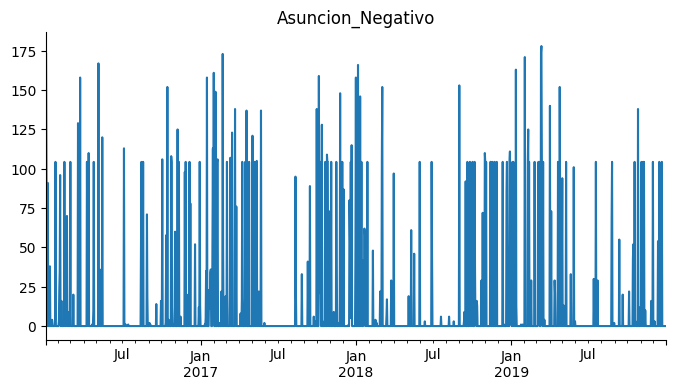

In [ ]:
# @title Asuncion_Negativo

from matplotlib import pyplot as plt
df_combinado['Asuncion_Negativo'].plot(kind='line', figsize=(8, 4), title='Asuncion_Negativo')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
# prompt: Con DataFrame df_combinado: filter for years ['2016':'2018']

df_combinado[(df_combinado.index>= '2016') & (df_combinado.index <= '2018')]


,Temperatura,Humedad,Asuncion_Positivo,Asuncion_Negativo,Asuncion_Snet_Negativo,Asuncion_Snet_Positivo,Central_Positivo,Central_Negativo,Central_Snet_Negativo,Central_Snet_Positivo,Concepcion_Positivo,Concepcion_Negativo,Concepcion_Snet_Negativo,Concepcion_Snet_Positivo,Neembucu_Positivo,Neembucu_Negativo,Neembucu_Snet_Negativo,Neembucu_Snet_Positivo,Asuncion-Central_Positivo,Asuncion-Central_Negativo
2016-01-04,33.347442,53.838963,98.000000,173.003382,748.5,463.1,7.0,10.000000,91.9,62.9,94.578146,162.242334,479.2,192.3,0.0,0.0,0.0,0.0,105.000000,183.003382
2016-01-05,30.613762,64.865987,68.000000,99.000000,432.0,105.8,16.0,45.000000,270.9,63.0,109.000000,158.000000,250.3,112.1,0.0,0.0,0.0,0.0,84.000000,144.000000
2016-01-06,29.550631,65.461286,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,3.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
2016-01-07,29.018269,63.351674,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
2016-01-08,29.799738,67.631599,36.000000,91.000000,239.7,167.6,151.0,176.604730,1480.6,712.3,156.023556,107.379903,371.1,90.7,0.0,1.0,4.1,0.0,187.000000,267.604730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-28,29.325542,71.220610,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,93.000000,179.121167,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
2017-12-29,28.592962,66.956274,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
2017-12-30,29.396800,56.672001,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
2017-12-31,30.788300,52.192831,21.000000,50.000000,15.5,31.1,1.0,2.000000,3.9,18.3,1.000000,4.000000,0.9,0.9,0.0,0.0,0.0,0.0,22.000000,52.000000


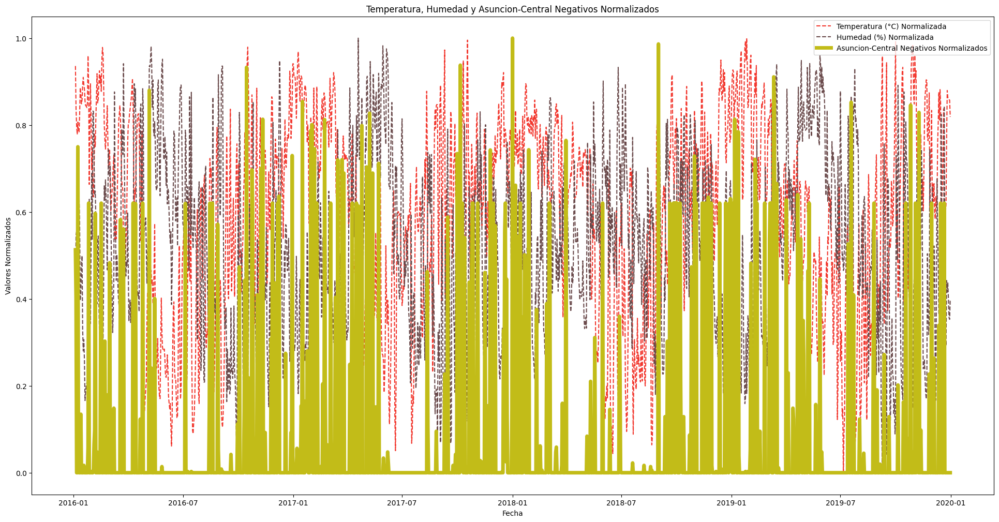

In [ ]:
# Graficar los datos normalizados - Serie Temporal 1
plt.figure(figsize=(24, 12))
plt.plot(df_normalizado.index, df_normalizado['Temperatura'],
         label='Temperatura (°C) Normalizada',
         color='#F2372E',
         linestyle='--',
         )
plt.plot(df_normalizado.index,
         df_normalizado['Humedad'],
         label='Humedad (%) Normalizada',
         color='#6A4A4B',
         linestyle='--',
         )
plt.plot(df_normalizado.index,
         df_normalizado['Asuncion-Central_Negativo'],
         label='Asuncion-Central Negativos Normalizados',
         color='#C2BC18',
         linewidth=5,
         )
plt.xlabel('Fecha')
plt.ylabel('Valores Normalizados')
plt.title('Temperatura, Humedad y Asuncion-Central Negativos Normalizados')
plt.legend()
plt.show()


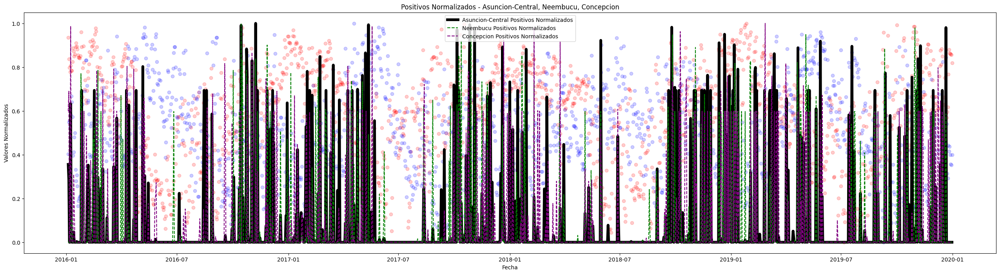

In [ ]:
# Graficar los datos normalizados - Serie Temporal 2
plt.figure(figsize=(32, 8))

plt.scatter(df_normalizado.index, df_normalizado['Temperatura'], color='red',alpha=0.2)
plt.scatter(df_normalizado.index, df_normalizado['Humedad'], color='blue',alpha=0.2)

plt.plot(df_normalizado.index,
         df_normalizado['Asuncion-Central_Positivo'],
         label='Asuncion-Central Positivos Normalizados',
         color='black',
         linewidth=5,
         )

plt.plot(df_normalizado.index,
         df_normalizado['Neembucu_Positivo'],
         label='Neembucu Positivos Normalizados',
         color='green',
         linestyle='--',

         )
plt.plot(df_normalizado.index,
         df_normalizado['Concepcion_Positivo'],
         label='Concepcion Positivos Normalizados',
         color='purple',
         linestyle='--',

         )
plt.xlabel('Fecha')
plt.grid='True'
plt.ylabel('Valores Normalizados')
plt.title('Positivos Normalizados - Asuncion-Central, Neembucu, Concepcion')
plt.legend()
plt.show()

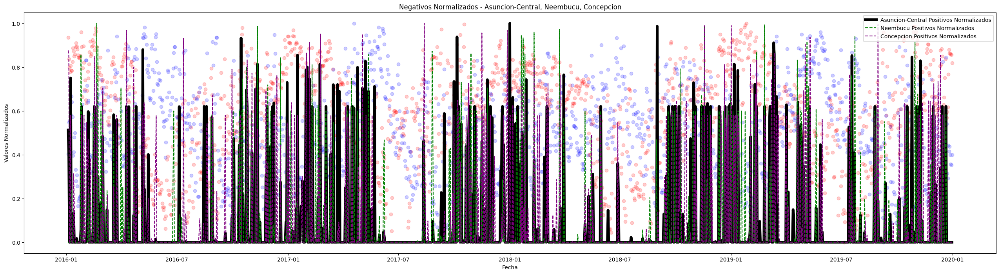

In [ ]:
# Graficar los datos normalizados - Serie Temporal 2
plt.figure(figsize=(32, 8))

plt.scatter(df_normalizado.index, df_normalizado['Temperatura'], color='red',alpha=0.2)
plt.scatter(df_normalizado.index, df_normalizado['Humedad'], color='blue',alpha=0.2)


plt.plot(df_normalizado.index,
         df_normalizado['Asuncion-Central_Negativo'],
         label='Asuncion-Central Positivos Normalizados',
         color='black',
         linewidth=5,
         )

plt.plot(df_normalizado.index,
         df_normalizado['Neembucu_Negativo'],
         label='Neembucu Positivos Normalizados',
         color='green',
         linestyle='--',

         )
plt.plot(df_normalizado.index,
         df_normalizado['Concepcion_Negativo'],
         label='Concepcion Positivos Normalizados',
         color='purple',
         linestyle='--',

         )
plt.xlabel('Fecha')
plt.grid='True'
plt.ylabel('Valores Normalizados')
plt.title('Negativos Normalizados - Asuncion-Central, Neembucu, Concepcion')
plt.legend()
plt.show()

#ignore

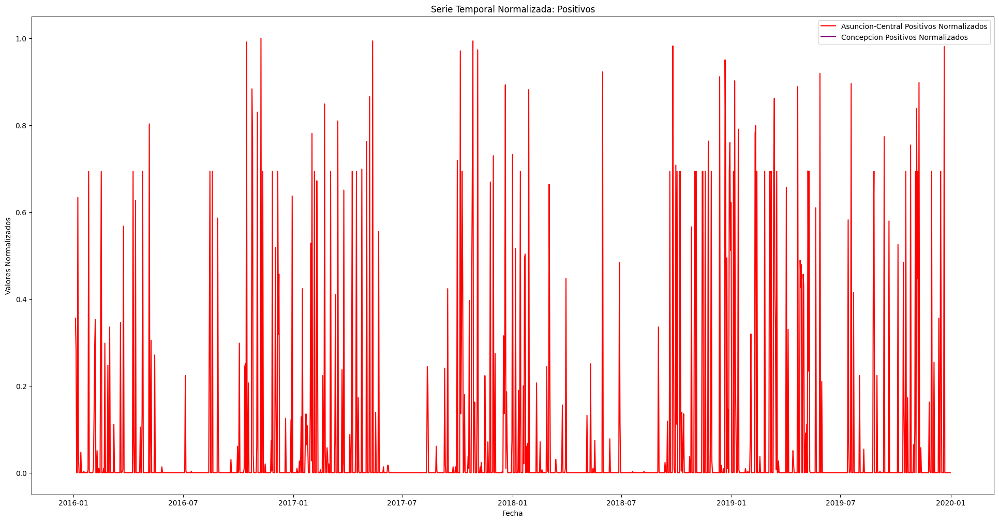

In [ ]:
# Asumiendo que df_temp_humedad_resampled y df_rayos_resampled ya están definidos y contienen datos remuestreados y tratados para valores atípicos.
# Remuestreo de los datos
df_temp_humedad_resampled = df_temp_humedad.resample('30D').mean()


for lugar in ['Neembucu','Concepcion']:
    # Suponiendo que los archivos CSV ya tienen las columnas 'Positivo' y 'Negativo'
    df_rayos_resampled[lugar] = df_rayos[lugar].resample('30D').sum()
    # Renombrar las columnas para incluir el nombre de la ciudad como prefijo
    df_rayos_resampled[lugar] =tratar_valores_atipicos(df_rayos_resampled[lugar], ['Positivo', 'Negativo'])
    df_rayos_resampled[lugar].columns = [f'{lugar}_{col}' for col in df_rayos_resampled[lugar].columns]


df_temp_humedad_resampled = tratar_valores_atipicos(df_temp_humedad_resampled, ['Temperatura', 'Humedad'])


# for lugar, archivo in archivos_rayos.items():
#     df_temp = df_rayos_resampled
#     # df_temp = df_temp['2016':'2021']
#     df_temp = tratar_valores_atipicos(df_temp, ['Positivo', 'Negativo'])
#     df_rayos_resampled[lugar] = df_temp
# Combinar los datos de temperatura, humedad con los datos de incidencia de rayos
df_combinado = pd.concat([df_temp_humedad_resampled, *df_rayos_resampled.values()], axis=1)
df_combinado['Asuncion-Central_Positivo'] = df_combinado['Central_Positivo'] + df_combinado['Asuncion_Positivo']
df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']
df_combinado['Neembucu_Negativo']=df_combinado['Neembucu_Negativo']
df_combinado['Neembucu_Positivo']=df_combinado['Neembucu_Positivo']
df_combinado['Concepcion_Positivo']=df_combinado['Concepcion_Positivo']
df_combinado['Concepcion_Negativo']=df_combinado['Concepcion_Negativo']
scaler_min_max = MinMaxScaler()
df_normalizado = pd.DataFrame(scaler_min_max.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)
# Visualización de la serie temporal normaliza
# Visualización de la serie temporal normalizada: Asuncion-Central_Positivos, Ñeembucu_Positivos, Concepcion_Positivos
plt.figure(figsize=(24, 12))
plt.plot(df_normalizado.index, df_normalizado['Asuncion-Central_Positivo'], label='Asuncion-Central Positivos Normalizados', color='red')
# plt.plot(df_normalizado.index, df_normalizado['Ñeembucu_Positivo'], label='Ñeembucu Positivos Normalizados', color='orange')
plt.plot(df_normalizado.index, df_normalizado['Concepcion_Positivo'], label='Concepcion Positivos Normalizados', color='purple')
plt.xlabel('Fecha')
plt.ylabel('Valores Normalizados')
plt.title('Serie Temporal Normalizada: Positivos')
plt.legend()
plt.show()


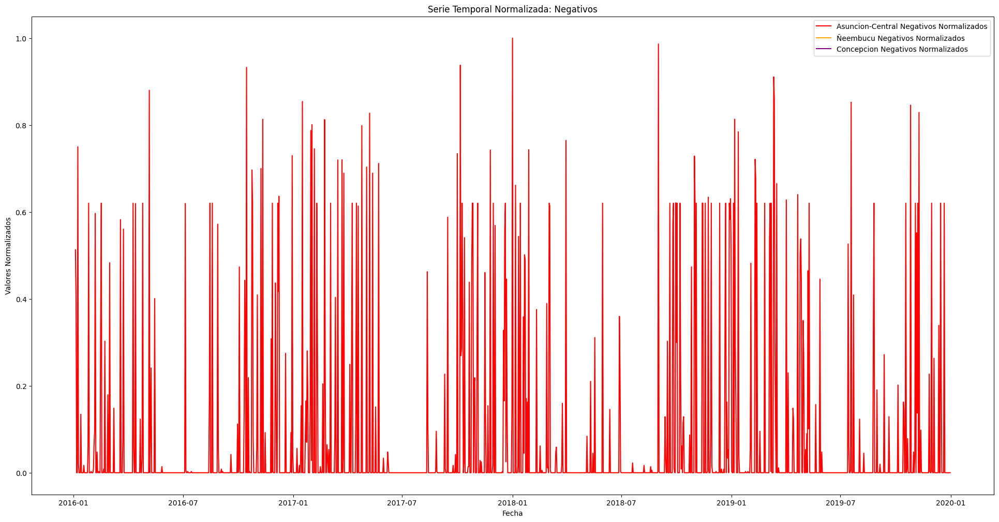

In [ ]:

# Visualización de la serie temporal normalizada: Asuncion-Central_Negativos, Ñeembucu_Negativos, Concepcion_Negativos
plt.figure(figsize=(24, 12))
plt.plot(df_normalizado.index, df_normalizado['Asuncion-Central_Negativo'], label='Asuncion-Central Negativos Normalizados', color='red')
plt.plot(df_normalizado.index, df_normalizado['Neembucu_Negativo'], label='Ñeembucu Negativos Normalizados', color='orange')
plt.plot(df_normalizado.index, df_normalizado['Concepcion_Negativo'], label='Concepcion Negativos Normalizados', color='purple')
plt.xlabel('Fecha')
plt.ylabel('Valores Normalizados')
plt.title('Serie Temporal Normalizada: Negativos')
plt.legend()
plt.show()

            Temperatura    Humedad  Concepcion_Positivo  Concepcion_Negativo  \
2016-01-04    30.398633  56.185578          1143.164891          1088.969337   
2016-02-03    29.963834  64.208687           773.164891          1070.727003   
2016-03-04    25.644658  63.830806           366.070667           314.363501   
2016-04-03    24.696916  66.650894           503.070667           524.363501   
2016-05-03    17.071348  83.490476           661.141335          1065.727003   
2016-06-02    14.450701  73.444788             0.000000             0.000000   
2016-07-02    17.928284  66.902783            61.000000           228.242334   
2016-08-01    21.078667  58.717380           331.023556           391.000000   
2016-08-31    20.573402  51.691798           452.070667           388.121167   
2016-09-30    25.221182  57.378201          1206.235558          1320.575173   
2016-10-30    25.942447  51.143069           446.047112           565.242334   
2016-11-29    27.396032  62.109223      

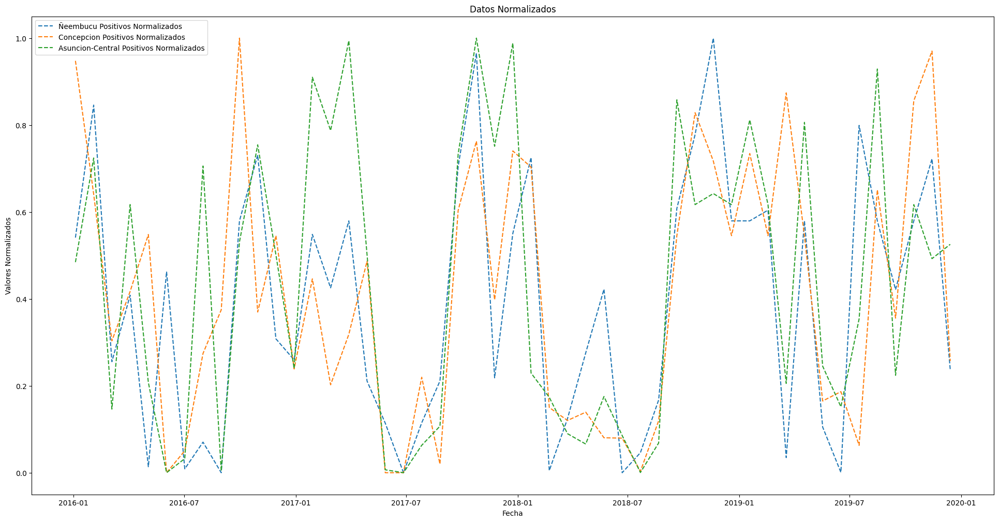

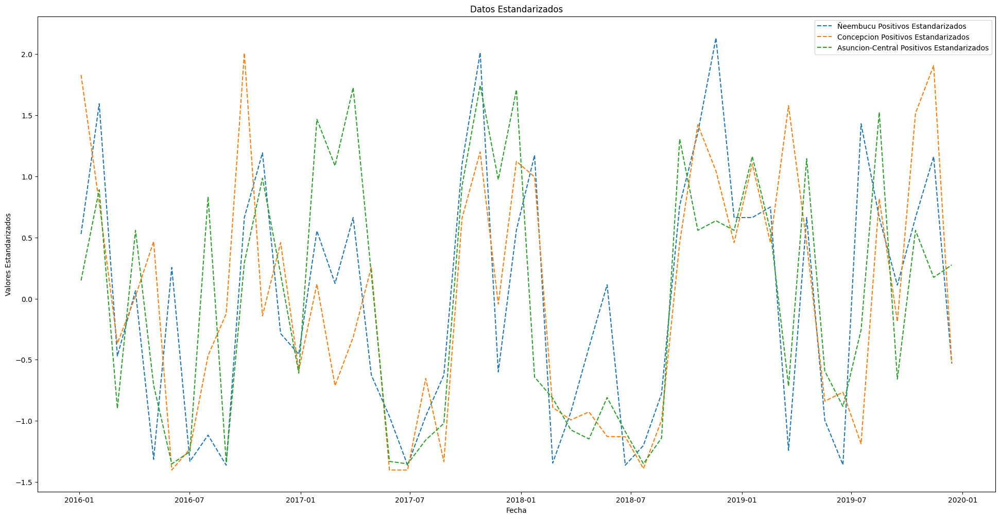

In [ ]:
# Remuestreo de los datos
df_temp_humedad_resampled = df_temp_humedad.resample('30D').mean()

df_rayos_resampled = {}
for lugar in ['Concepcion', 'Neembucu','Asuncion','Central']:
    # Suponiendo que los archivos CSV ya tienen las columnas 'Positivo' y 'Negativo'
    df_rayos_resampled[lugar] = df_rayos[lugar].resample('30D').sum()
    # Renombrar las columnas para incluir el nombre de la ciudad como prefijo
    df_rayos_resampled[lugar] =tratar_valores_atipicos(df_rayos_resampled[lugar], ['Positivo', 'Negativo'])
    df_rayos_resampled[lugar].columns = [f'{lugar}_{col}' for col in df_rayos_resampled[lugar].columns]

# print(df_rayos_resampled)
df_temp_humedad_resampled = tratar_valores_atipicos(df_temp_humedad_resampled, ['Temperatura', 'Humedad'])


# Combinar los datos de temperatura, humedad con los datos de incidencia de rayos
df_combinado = pd.concat([df_temp_humedad_resampled, *df_rayos_resampled.values()], axis=1)
df_combinado['Asuncion-Central_Positivo'] = df_combinado['Central_Positivo'] + df_combinado['Asuncion_Positivo']
df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']
print(df_combinado)
# Normalizar los datos
scaler_min_max = MinMaxScaler()
df_normalizado = pd.DataFrame(scaler_min_max.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)

# Estandarizar los datos
scaler_std = StandardScaler()
df_estandarizado = pd.DataFrame(scaler_std.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)

# Graficar los datos normalizados
plt.figure(figsize=(24, 12))
# plt.plot(df_normalizado.index, df_normalizado['Temperatura'], label='Temperatura (°C) Normalizada', color='red')
# plt.plot(df_normalizado.index, df_normalizado['Humedad'], label='Humedad (%) Normalizada', color='blue')

plt.plot(df_normalizado.index, df_normalizado['Neembucu_Positivo'], label='Ñeembucu Positivos Normalizados', linestyle='--')
plt.plot(df_normalizado.index, df_normalizado['Concepcion_Positivo'], label='Concepcion Positivos Normalizados', linestyle='--')


plt.plot(df_normalizado.index, df_normalizado['Asuncion-Central_Positivo'], label='Asuncion-Central Positivos Normalizados', linestyle='--')

plt.xlabel('Fecha')
plt.ylabel('Valores Normalizados')
plt.title('Datos Normalizados')
plt.legend()
plt.show()

# Graficar los datos estandarizados
plt.figure(figsize=(24, 12))
# plt.plot(df_estandarizado.index, df_estandarizado['Temperatura'], label='Temperatura (°C) Estandarizada', color='red')
# plt.plot(df_estandarizado.index, df_estandarizado['Humedad'], label='Humedad (%) Estandarizada', color='blue')
plt.plot(df_estandarizado.index, df_estandarizado['Neembucu_Positivo'], label='Ñeembucu Positivos Estandarizados', linestyle='--')
plt.plot(df_estandarizado.index, df_estandarizado['Concepcion_Positivo'], label='Concepcion Positivos Estandarizados', linestyle='--')
# Asegúrate de incluir el resto de las líneas para 'Negativo' si es necesario


plt.plot(df_estandarizado.index, df_estandarizado['Asuncion-Central_Positivo'], label='Asuncion-Central Positivos Estandarizados', linestyle='--')

plt.xlabel('Fecha')
plt.ylabel('Valores Estandarizados')
plt.title('Datos Estandarizados')
plt.legend()
plt.show()

In [ ]:
# df_combinado=df_combinado.drop(columns=('index'))
print(df_combinado.columns)

Index(['Temperatura', 'Humedad', 'Concepcion_Positivo', 'Concepcion_Negativo',
       'Concepcion_Snet_Negativo', 'Concepcion_Snet_Positivo',
       'Neembucu_Positivo', 'Neembucu_Negativo', 'Neembucu_Snet_Negativo',
       'Neembucu_Snet_Positivo', 'Asuncion_Positivo', 'Asuncion_Negativo',
       'Asuncion_Snet_Negativo', 'Asuncion_Snet_Positivo', 'Central_Positivo',
       'Central_Negativo', 'Central_Snet_Negativo', 'Central_Snet_Positivo',
       'Asuncion-Central_Positivo', 'Asuncion-Central_Negativo'],
      dtype='object')


            Temperatura    Humedad  Concepcion_Positivo  Concepcion_Negativo  \
2016-01-04    30.398633  56.185578          1143.164891          1088.969337   
2016-02-03    29.963834  64.208687           773.164891          1070.727003   
2016-03-04    25.644658  63.830806           366.070667           314.363501   
2016-04-03    24.696916  66.650894           503.070667           524.363501   
2016-05-03    17.071348  83.490476           661.141335          1065.727003   
2016-06-02    14.450701  73.444788             0.000000             0.000000   
2016-07-02    17.928284  66.902783            61.000000           228.242334   
2016-08-01    21.078667  58.717380           331.023556           391.000000   
2016-08-31    20.573402  51.691798           452.070667           388.121167   
2016-09-30    25.221182  57.378201          1206.235558          1320.575173   
2016-10-30    25.942447  51.143069           446.047112           565.242334   
2016-11-29    27.396032  62.109223      

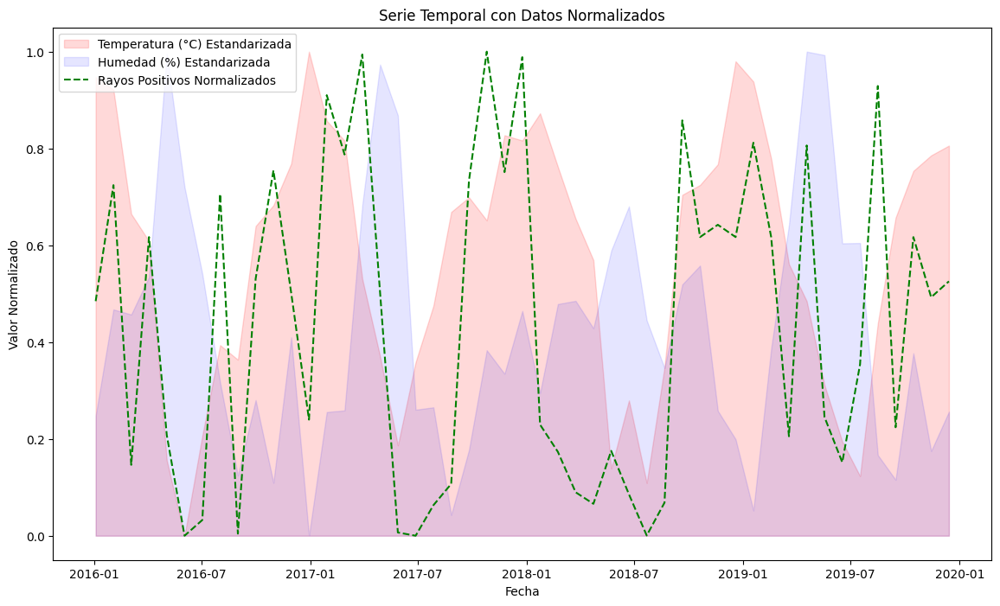

<Figure size 1400x800 with 0 Axes>

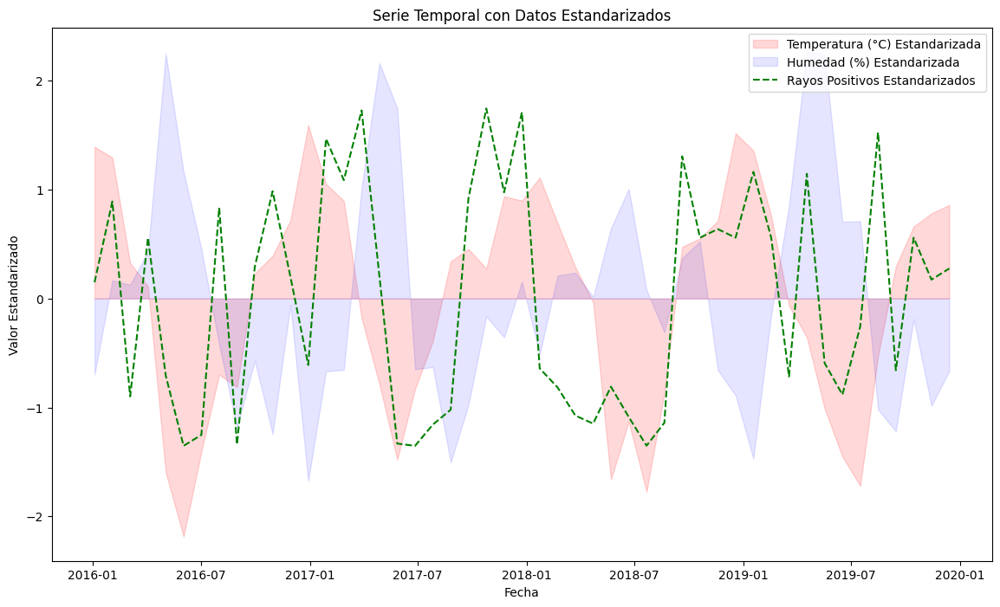

In [ ]:

# # Combinar los DataFrames para la normalización y estandarización
# df_combinado = pd.concat([df_temp_humedad_resampled, df_rayos_resampled['Asuncion']['Positivo'], df_rayos_resampled['Central']['Positivo']], axis=1)

# Normalizar los datos
scaler_min_max = MinMaxScaler()
df_normalizado = pd.DataFrame(scaler_min_max.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)

# Estandarizar los datos
scaler_std = StandardScaler()
df_estandarizado = pd.DataFrame(scaler_std.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)

print(df_combinado)
# Visualización de los datos normalizados
plt.figure(figsize=(14, 8))
plt.fill_between(df_normalizado.index, df_normalizado['Temperatura'], label='Temperatura (°C) Estandarizada', color='red', alpha=0.15)

# Graficar la humedad como un gráfico de área
plt.fill_between(df_normalizado.index, df_normalizado['Humedad'], label='Humedad (%) Estandarizada', color='blue', alpha=0.1)
plt.plot(df_normalizado.index, df_normalizado['Asuncion-Central_Positivo'], label='Rayos Positivos Normalizados', linestyle='--', color='green')
plt.xlabel('Fecha')
plt.ylabel('Valor Normalizado')
plt.title('Serie Temporal con Datos Normalizados')
plt.legend()
plt.show()

# Visualización de los datos estandarizados
plt.figure(figsize=(14, 8))# Graficar la temperatura como un gráfico de área

plt.figure(figsize=(14, 8))# Graficar la temperatura como un gráfico de área
plt.fill_between(df_estandarizado.index, df_estandarizado['Temperatura'], label='Temperatura (°C) Estandarizada', color='red', alpha=0.15)

# Graficar la humedad como un gráfico de área
plt.fill_between(df_estandarizado.index, df_estandarizado['Humedad'], label='Humedad (%) Estandarizada', color='blue', alpha=0.1)

# plt.scatter(df_normalizado.index, df_
plt.plot(df_estandarizado.index, df_estandarizado['Asuncion-Central_Positivo'], label='Rayos Positivos Estandarizados', linestyle='--', color='green')
plt.xlabel('Fecha')
plt.ylabel('Valor Estandarizado')
plt.title('Serie Temporal con Datos Estandarizados')
plt.legend()
plt.show()

### Polaridad negativa

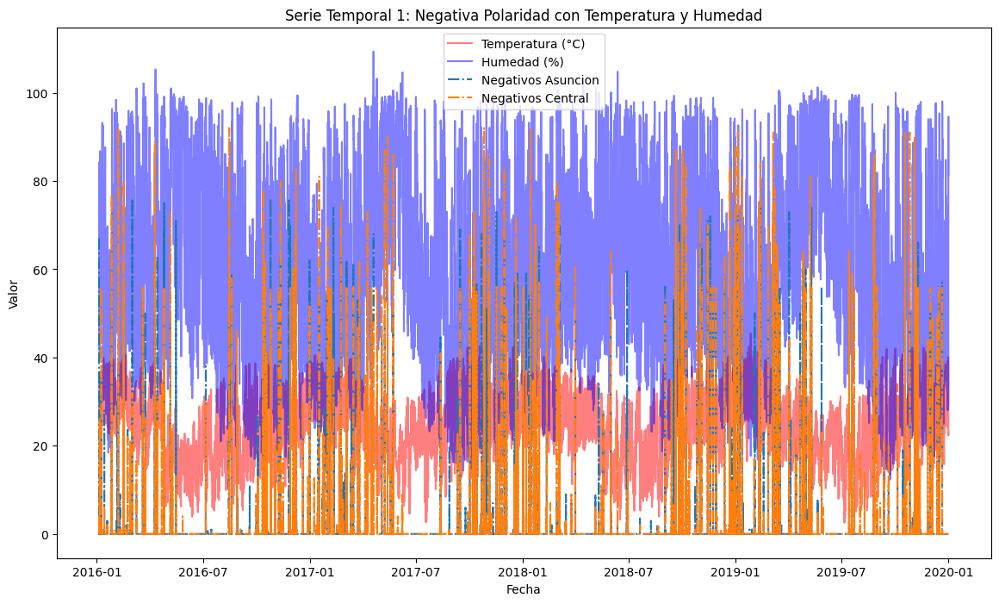

In [ ]:
plt.figure(figsize=(14, 8))
plt.plot(df_temp_humedad.index, df_temp_humedad['Temperatura'], label='Temperatura (°C)', color='red', alpha=0.5)
plt.plot(df_temp_humedad.index, df_temp_humedad['Humedad'], label='Humedad (%)', color='blue', alpha=0.5)
for lugar in ['Asuncion', 'Central']:
    plt.plot(df_rayos[lugar].index, df_rayos[lugar]['Negativo'], label=f'Negativos {lugar}', linestyle='-.')
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.title('Serie Temporal 1: Negativa Polaridad con Temperatura y Humedad')
plt.legend()
plt.show()


In [ ]:
# plt.figure(figsize=(14, 8))
# # Temperatura y Humedad
# plt.plot(df_temp_humedad.index, df_temp_humedad['Temperatura'], label='Temperatura (°C)', color='red')
# plt.plot(df_temp_humedad.index, df_temp_humedad['Humedad'], label='Humedad (%)', color='blue')
# # Incidencias de Rayos para Asunción y Central
# for lugar in ['Asuncion', 'Central']:
#     plt.plot(df_rayos[lugar].index, df_rayos[lugar]['Positivo'], label=f'Rayos Positivos {lugar}', linestyle='--')
#     plt.plot(df_rayos[lugar].index, df_rayos[lugar]['Negativo'], label=f'Rayos Negativos {lugar}', linestyle='-.')
# plt.xlabel('Fecha')
# plt.ylabel('Valor')
# plt.title('Serie Temporal 1: Asunción y Central con Temperatura y Humedad')
# plt.legend()
# plt.show()


##Serie Temporal 2
Para Asunción, Central, Concepción y Ñeembucu, separadas por polaridad:

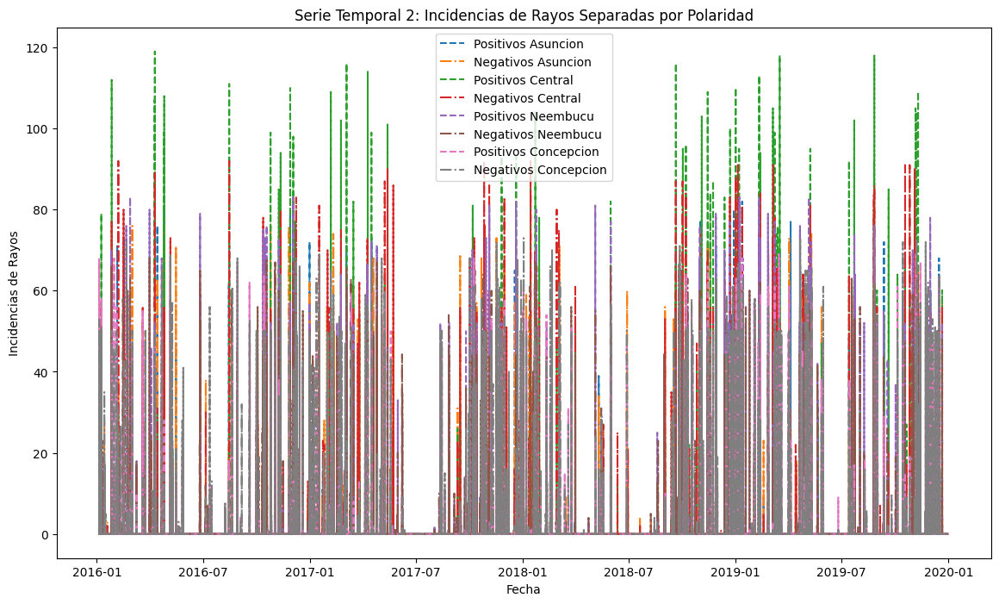

In [ ]:
plt.figure(figsize=(14, 8))
for lugar in ['Asuncion', 'Central', 'Neembucu', 'Concepcion']:
    plt.plot(df_rayos[lugar].index, df_rayos[lugar]['Positivo'], label=f'Positivos {lugar}', linestyle='--')
    plt.plot(df_rayos[lugar].index, df_rayos[lugar]['Negativo'], label=f'Negativos {lugar}', linestyle='-.')
plt.xlabel('Fecha')
plt.ylabel('Incidencias de Rayos')
plt.title('Serie Temporal 2: Incidencias de Rayos Separadas por Polaridad')
plt.legend()
plt.show()

##Serie Temporal 3
Integración de todos los datos juntos:

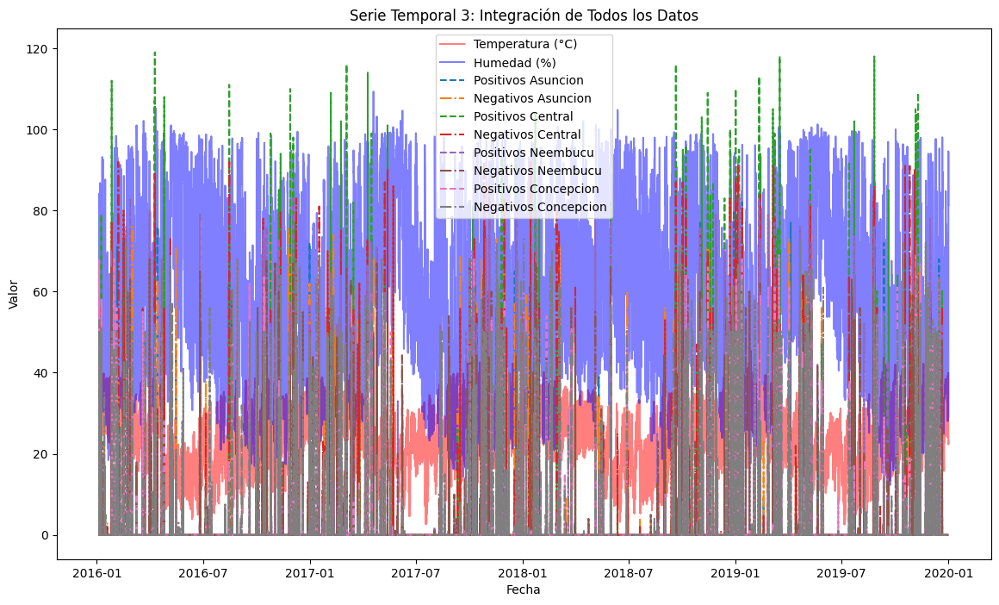

In [ ]:
plt.figure(figsize=(14, 8))
# Temperatura y Humedad
plt.plot(df_temp_humedad.index, df_temp_humedad['Temperatura'], label='Temperatura (°C)', color='red', alpha=0.5)
plt.plot(df_temp_humedad.index, df_temp_humedad['Humedad'], label='Humedad (%)', color='blue', alpha=0.5)

# Incidencias de Rayos para todas las localidades
for lugar in ['Asuncion', 'Central', 'Neembucu', 'Concepcion']:
    plt.plot(df_rayos[lugar].index, df_rayos[lugar]['Positivo'], label=f'Positivos {lugar}', linestyle='--')
    plt.plot(df_rayos[lugar].index, df_rayos[lugar]['Negativo'], label=f'Negativos {lugar}', linestyle='-.')

plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.title('Serie Temporal 3: Integración de Todos los Datos')
plt.legend()
plt.show()

In [ ]:
# # Graficar la temperatura y la humedad
# fig, ax1 = plt.subplots(figsize=(14, 8))

# color = 'tab:red'
# ax1.set_xlabel('Fecha')
# ax1.set_ylabel('Temperatura (°C)', color=color)
# ax1.plot(df_final.index, df_final['Temperatura'], color=color)
# ax1.tick_params(axis='y', labelcolor=color)

# ax2 = ax1.twinx()  # Instancia un segundo eje que comparte el mismo eje x
# color = 'tab:blue'
# ax2.set_ylabel('Humedad (%)', color=color)
# ax2.plot(df_final.index, df_final['Humedad'], color=color)
# ax2.tick_params(axis='y', labelcolor=color)

# plt.title('Temperatura y Humedad en Asunción-Central')
# plt.show()

# # Graficar la incidencia de rayos
# plt.figure(figsize=(14, 8))
# plt.plot(df_final.index, df_final['Asuncion'], label='Asunción')
# plt.plot(df_final.index, df_final['Central'], label='Central')
# plt.plot(df_final.index, df_final['Ñeembucu'], label='Ñeembucu')
# plt.plot(df_final.index, df_final['Concepcion'], label='Concepción')
# plt.xlabel('Fecha')
# plt.ylabel('Incidencia de Rayos')
# plt.title('Incidencia de Rayos por Localidad')
# plt.legend()
# plt.show()

In [ ]:
print(df_estandarizado.columns)

Index(['Temperatura', 'Humedad', 'Concepcion_Positivo', 'Concepcion_Negativo',
       'Concepcion_Snet_Negativo', 'Concepcion_Snet_Positivo',
       'Neembucu_Positivo', 'Neembucu_Negativo', 'Neembucu_Snet_Negativo',
       'Neembucu_Snet_Positivo', 'Asuncion_Positivo', 'Asuncion_Negativo',
       'Asuncion_Snet_Negativo', 'Asuncion_Snet_Positivo', 'Central_Positivo',
       'Central_Negativo', 'Central_Snet_Negativo', 'Central_Snet_Positivo',
       'Asuncion-Central_Positivo', 'Asuncion-Central_Negativo'],
      dtype='object')


#Training set

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# from keras.models import Sequential
# from keras.layers import LSTM, Dense, Dropout
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense

print(tf.__version__)
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.model_selection import train_test_split

from tensorflow.keras.regularizers import l1_l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler



# Calcular métricas de rendimiento, como RMSE
from sklearn.metrics import mean_squared_error
from math import sqrt
# rmse = sqrt(mean_squared_error(y_test_inv, pred_inv))
# print('RMSE:', rmse)

2.15.0


In [ ]:
                                                   # Asumiendo que df_temp_humedad_resampled y df_rayos_resampled ya están definidos y contienen datos remuestreados y tratados para valores atípicos.
# Remuestreo de los datos
df_temp_humedad_resampled = df_temp_humedad.resample('1D').mean()

df_rayos_resampled = {}

for lugar in ['Asuncion', 'Central','Concepcion','Neembucu']:
    # Suponiendo que los archivos CSV ya tienen las columnas 'Positivo' y 'Negativo'
    df_rayos_resampled[lugar] = round(df_rayos[lugar].resample('1D').sum()).round()    # Renombrar las columnas para incluir el nombre de la ciudad como prefijo
    df_rayos_resampled[lugar] =round(tratar_valores_atipicos(df_rayos_resampled[lugar], ['Positivo', 'Negativo']))
    df_rayos_resampled[lugar].columns = [f'{lugar}_{col}' for col in df_rayos_resampled[lugar].columns]
df_temp_humedad_resampled = tratar_valores_atipicos(df_temp_humedad_resampled, ['Temperatura', 'Humedad'])
# df_temp_humedad_resampled = df_temp_humedad_resampled
# df_rayos_resampled  = df_rayos_resampled['2016':'2018']

# for lugar, archivo in archivos_rayos.items():
#     df_temp = df_rayos_resampled
#     # df_temp = df_temp['2016':'2021']
#     df_temp = tratar_valores_atipicos(df_temp, ['Positivo', 'Negativo'])
#     df_rayos_resampled[lugar] = df_temp
# Combinar los datos de temperatura, humedad con los datos de incidencia de rayos
df_combinado = pd.concat([df_temp_humedad_resampled, *df_rayos_resampled.values()], axis=1)
df_combinado= round(df_combinado)
df_combinado['Asuncion-Central_Positivo'] = df_combinado['Central_Positivo'] + df_combinado['Asuncion_Positivo']
df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']
# print(df_combinado['Neembucu_Positivo'])

# Estandarizar los datos
scaler_std = StandardScaler()
df_estandarizado = pd.DataFrame(scaler_std.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)


In [ ]:
print(df_combinado.describe())

       Temperatura      Humedad  Asuncion_Positivo  Asuncion_Negativo  \
count  1458.000000  1458.000000        1458.000000        1458.000000   
mean     24.163923    62.713992          10.427984          12.641975   
std       5.906491    15.382422          28.999526          33.794680   
min       8.000000    23.000000           0.000000           0.000000   
25%      20.000000    51.000000           0.000000           0.000000   
50%      25.000000    62.000000           0.000000           0.000000   
75%      29.000000    74.000000           0.000000           0.000000   
max      35.000000    99.000000         158.000000         178.000000   

       Asuncion_Snet_Negativo  Asuncion_Snet_Positivo  Central_Positivo  \
count             1458.000000             1458.000000       1458.000000   
mean                37.436214               19.317558         11.790123   
std                314.078350              104.718926         33.770734   
min                  0.000000             

In [ ]:
df_combinado_19_20 = df_combinado[df_combinado.index.year.isin([2018])]
df_combinado_19_20.to_csv('/content/drive/MyDrive/mmlastias/df_combinado.csv', index=False)

In [ ]:
print(df_combinado_19_20.dtypes)

Temperatura                  float64
Humedad                      float64
Asuncion_Positivo            float64
Asuncion_Negativo            float64
Asuncion_Snet_Negativo       float64
Asuncion_Snet_Positivo       float64
Central_Positivo             float64
Central_Negativo             float64
Central_Snet_Negativo        float64
Central_Snet_Positivo        float64
Concepcion_Positivo          float64
Concepcion_Negativo          float64
Concepcion_Snet_Negativo     float64
Concepcion_Snet_Positivo     float64
Neembucu_Positivo            float64
Neembucu_Negativo            float64
Neembucu_Snet_Negativo       float64
Neembucu_Snet_Positivo       float64
Asuncion-Central_Positivo    float64
Asuncion-Central_Negativo    float64
dtype: object


#1.  LSTM Architecture Exploration:

##preparing data

In [ ]:
# Remuestreo de los datos
df_temp_humedad_resampled = df_temp_humedad.resample('1D').mean()
df_temp_humedad_resampled = df_temp_humedad_resampled['2016':'2019']
df_rayos_resampled = {}
for lugar in ['Asuncion', 'Central','Concepcion','Neembucu']:
    # Suponiendo que los archivos CSV ya tienen las columnas 'Positivo' y 'Negativo'
    df_rayos_resampled[lugar] = df_rayos[lugar].resample('1D').sum()

    # df_rayos_resampled[f"{lugar}_snet"]=

    # df_rayos_resampled[f"{lugar}_snet_pes"]=
    # Renombrar las columnas para incluir el nombre de la ciudad como prefijo
    # for col in (df_rayos_resampled[lugar]):
    #   print(col,'\n\n\n\n')
    df_rayos_resampled[lugar] =tratar_valores_atipicos(df_rayos_resampled[lugar], ['Positivo', 'Negativo','Snet_Positivo', 'Snet_Negativo'])

    df_rayos_resampled[lugar].columns = [f'{lugar}_{col}' for col in df_rayos_resampled[lugar].columns]
print(df_rayos_resampled)
# df_rayos_resampled = df_rayos_resampled['2016':'2019']
df_combinado = pd.DataFrame()

df_temp_humedad_resampled = tratar_valores_atipicos(df_temp_humedad_resampled, ['Temperatura', 'Humedad'])


# for lugar, archivo in archivos_rayos.items():
#     df_temp = df_rayos_resampled
#
#     df_temp = tratar_valores_atipicos(df_temp, ['Positivo', 'Negativo'])
#     df_rayos_resampled[lugar] = df_temp
# Combinar los datos de temperatura, humedad con los datos de incidencia de rayos
# df_combinado = pd.concat([df_temp_humedad_resampled, *df_rayos_resampled.values()], axis=1)


# df_combinado['Asuncion-Central_Positivo'] = df_combinado['Central_Positivo'] + df_combinado['Asuncion_Positivo']
# df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']
#  df_combinado['Asuncion-Central'] = 0.8*(df_combinado['Asuncion-Central_Negativo'] + df_combinado['Asuncion-Central_Positivo']) + 0.5*(df_combinado['Asuncion_Snet_Negativo']+df_combinado['Asuncion_Snet_Positivo']+df_combinado['Central_Snet_Negativo']+df_combinado['Central_Snet_Positivo'])
for lugar in ['Concepcion','Asuncion','Central','Neembucu']:
  df_combinado[lugar] = df_rayos_resampled[lugar][[ f'{lugar}_Positivo', f'{lugar}_Negativo', f'{lugar}_Snet_Positivo', f'{lugar}_Snet_Negativo']].sum(axis=1).fillna(0)
    # df_combinado[lugar] = 0.3*(df_rayos_resampled[lugar][f'{lugar}_Negativo'] + df_rayos_resampled[lugar][f'{lugar}_Positivo']) + 0.7*(df_rayos_resampled[lugar][f'{lugar}_Snet_Negativo']+df_rayos_resampled[lugar][f'{lugar}_Snet_Positivo'])
# df_combinado['Asuncion_Central'] = (df_combinado['Central']*0.7 + df_combinado['Asuncion']*0.3
df_combinado["Asuncion_Central"] = df_combinado[["Asuncion", "Central"]].max(axis=1)
# df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']
# df_combinado['Asuncion_Central'] = df_combinado['Asuncion-Central']
df_combinado['Temperatura']=df_temp_humedad_resampled['Temperatura']
df_combinado['Humedad'] = df_temp_humedad_resampled['Humedad']
# df_combinado['Neembucu'] = df_combinado['Neembucu_Negativo'] + df_combinado['Neembucu_Positivo']

# df_combinado['Concepcion'] = df_combinado['Concepcion_Negativo'] + df_combinado['Concepcion_Positivo']
# df_combinado['Concepcion_Negativo'] = df_rayos_resampled['Concepcion_Negativo']
# df_combinado['Neembucu_Positivo'] = df_rayos_resampled['Neembucu_Positivo']
# df_combinado['Concepcion_Positivo'] = df_rayos_resampled['Concepcion_Positivo']

df_combinado=df_combinado[df_combinado.index <= '2019']

# Normalizar los datos
scaler_min_max = MinMaxScaler()
df_normalizado = pd.DataFrame(scaler_min_max.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)

# Estandarizar los datos
scaler_std = StandardScaler()
df_estandarizado = pd.DataFrame(scaler_std.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)


{'Asuncion':             Asuncion_Positivo  Asuncion_Negativo  Asuncion_Snet_Negativo  \
timestamp                                                                  
2016-01-04               98.0         173.003382              175.465273   
2016-01-05               68.0          99.000000              432.000000   
2016-01-06                0.0           0.000000                0.000000   
2016-01-07                0.0           0.000000                0.000000   
2016-01-08               36.0          91.000000              239.700000   
...                       ...                ...                     ...   
2019-12-27                0.0           0.000000                0.000000   
2019-12-28                0.0           0.000000                0.000000   
2019-12-29                0.0           0.000000                0.000000   
2019-12-30                0.0           0.000000                0.000000   
2019-12-31                0.0           0.000000                0.000000   

##importar lib + crear features and target variables

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

In [ ]:
# Feature selection and target variable definition
features = df_combinado.drop(columns=['Asuncion_Central'],axis=1)
target = df_combinado['Asuncion_Central']

# Data scaling
scaler_features = MinMaxScaler()
scaler_target = MinMaxScaler()
features_scaled = scaler_features.fit_transform(features)
target_scaled = scaler_target.fit_transform(target.values.reshape(-1, 1))

# Create time series sequences (adjust n_steps as needed)
def create_sequences(data, n_steps):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:(i + n_steps), :])
        y.append(data[i + n_steps, -1])
    return np.array(X), np.array(y)

n_steps = 3
X, y = create_sequences(features_scaled, n_steps)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

##modelo 1

In [ ]:
# Define and build LSTM model
model = Sequential()
model.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(n_steps, features_scaled.shape[1])))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Make predictions and inverse transform
y_pred = model.predict(X_test)
y_pred_inv = scaler_target.inverse_transform(y_pred)
y_test_inv = scaler_target.inverse_transform(y_test.reshape(-1, 1))


Epoch 1/100
28/28 [==============================] - 9s 72ms/step - loss: 0.1525 - val_loss: 0.0420
Epoch 2/100
28/28 [==============================] - 0s 13ms/step - loss: 0.0411 - val_loss: 0.0315
Epoch 3/100
28/28 [==============================] - 0s 12ms/step - loss: 0.0330 - val_loss: 0.0275
Epoch 4/100
28/28 [==============================] - 0s 12ms/step - loss: 0.0301 - val_loss: 0.0259
Epoch 5/100
28/28 [==============================] - 0s 11ms/step - loss: 0.0288 - val_loss: 0.0252
Epoch 6/100
28/28 [==============================] - 0s 11ms/step - loss: 0.0285 - val_loss: 0.0254
Epoch 7/100
28/28 [==============================] - 0s 11ms/step - loss: 0.0278 - val_loss: 0.0243
Epoch 8/100
28/28 [==============================] - 0s 10ms/step - loss: 0.0268 - val_loss: 0.0237
Epoch 9/100
28/28 [==============================] - 0s 12ms/step - loss: 0.0259 - val_loss: 0.0233
Epoch 10/100
28/28 [==============================] - 1s 19ms/step - loss: 0.0251 - val_loss: 0.0228

RMSE: 123.28
MAE: 97.24


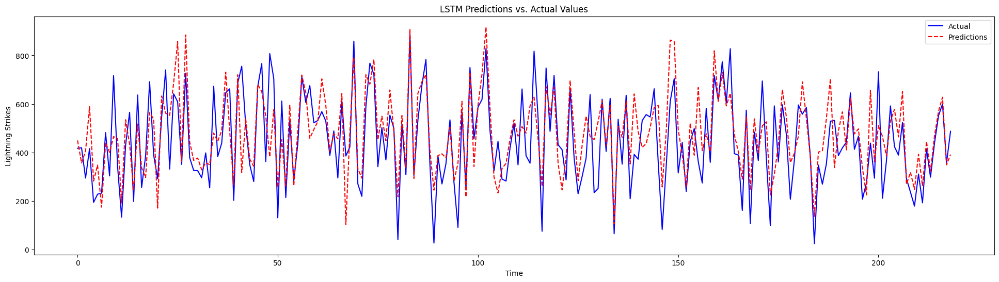

In [ ]:


# 1. Evaluate model performance
rmse = mean_squared_error(y_test_inv, y_pred_inv, squared=False)  # RMSE
mae = mean_absolute_error(y_test_inv, y_pred_inv)  # MAE
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")

# 2. Visualize predictions vs actual values
plt.figure(figsize=(24, 6))
plt.plot(y_test_inv[:400], label='Actual', color='blue')
plt.plot(y_pred_inv[:300], label='Predictions', color='red', linestyle='--')
plt.title("LSTM Predictions vs. Actual Values")
plt.xlabel('Time')
plt.ylabel('Lightning Strikes')
plt.legend()
plt.show()

## modelo 2

In [ ]:

#Adding more LSTM layers with different units
model = Sequential()
model.add(LSTM(128, activation='relu', return_sequences=True, input_shape=(n_steps, features_scaled.shape[1])))
model.add(LSTM(64, activation='relu', return_sequences=True))  # Additional LSTM layer
model.add(LSTM(32))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mse')



In [ ]:

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Make predictions and inverse transform
y_pred = model.predict(X_test)
y_pred_inv = scaler_target.inverse_transform(y_pred)
y_test_inv = scaler_target.inverse_transform(y_test.reshape(-1, 1))


Epoch 1/100
28/28 [==============================] - 6s 41ms/step - loss: 0.1600 - val_loss: 0.0528
Epoch 2/100
28/28 [==============================] - 0s 13ms/step - loss: 0.0392 - val_loss: 0.0330
Epoch 3/100
28/28 [==============================] - 0s 13ms/step - loss: 0.0331 - val_loss: 0.0282
Epoch 4/100
28/28 [==============================] - 0s 13ms/step - loss: 0.0314 - val_loss: 0.0273
Epoch 5/100
28/28 [==============================] - 0s 12ms/step - loss: 0.0310 - val_loss: 0.0267
Epoch 6/100
28/28 [==============================] - 0s 12ms/step - loss: 0.0299 - val_loss: 0.0263
Epoch 7/100
28/28 [==============================] - 0s 11ms/step - loss: 0.0290 - val_loss: 0.0277
Epoch 8/100
28/28 [==============================] - 0s 11ms/step - loss: 0.0289 - val_loss: 0.0253
Epoch 9/100
28/28 [==============================] - 0s 12ms/step - loss: 0.0281 - val_loss: 0.0266
Epoch 10/100
28/28 [==============================] - 0s 12ms/step - loss: 0.0265 - val_loss: 0.0244

## Modelo 3

In [ ]:
# Creating lagged features for temperature and humidity
df_combinado['temp_lag1'] = df_combinado['Temperatura'].shift(1)
df_combinado['humidity_lag1'] = df_combinado['Humedad'].shift(1)

# Adding more lags (adjust the number of lags and features as needed)
n_lags = 5  # Example: Create lags up to 5 time steps
for i in range(2, n_lags + 1):
    df_combinado[f'temp_lag{i}'] = df_combinado['Temperatura'].shift(i)
    df_combinado[f'humidity_lag{i}'] = df_combinado['Humedad'].shift(i)




# ... (rest of your code)

In [ ]:
# Define and build LSTM model
model = Sequential()
model.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(n_steps, features_scaled.shape[1])))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Make predictions and inverse transform
y_pred = model.predict(X_test)
y_pred_inv = scaler_target.inverse_transform(y_pred)
y_test_inv = scaler_target.inverse_transform(y_test.reshape(-1, 1))


Epoch 1/100
28/28 [==============================] - 4s 28ms/step - loss: 0.1352 - val_loss: 0.0490
Epoch 2/100
28/28 [==============================] - 0s 7ms/step - loss: 0.0416 - val_loss: 0.0322
Epoch 3/100
28/28 [==============================] - 0s 6ms/step - loss: 0.0329 - val_loss: 0.0273
Epoch 4/100
28/28 [==============================] - 0s 7ms/step - loss: 0.0295 - val_loss: 0.0255
Epoch 5/100
28/28 [==============================] - 0s 6ms/step - loss: 0.0285 - val_loss: 0.0246
Epoch 6/100
28/28 [==============================] - 0s 7ms/step - loss: 0.0280 - val_loss: 0.0244
Epoch 7/100
28/28 [==============================] - 0s 6ms/step - loss: 0.0269 - val_loss: 0.0238
Epoch 8/100
28/28 [==============================] - 0s 6ms/step - loss: 0.0257 - val_loss: 0.0235
Epoch 9/100
28/28 [==============================] - 0s 6ms/step - loss: 0.0246 - val_loss: 0.0259
Epoch 10/100
28/28 [==============================] - 0s 7ms/step - loss: 0.0246 - val_loss: 0.0237
Epoch 11

## modelo 4:  Incorporating Exogenous Variables

In [ ]:
print (df_combinado)

            Concepcion    Asuncion     Central    Neembucu  Asuncion_Central  \
timestamp                                                                      
2016-01-04  389.888568  556.452249  171.800000    0.000000        556.452249   
2016-01-05  400.068088  704.800000  394.900000    0.000000        704.800000   
2016-01-06    3.000000    0.000000    0.000000    0.000000          0.000000   
2016-01-07    0.000000    0.000000    0.000000    0.000000          0.000000   
2016-01-08  396.471546  534.300000  643.377592    5.100000        643.377592   
...                ...         ...         ...         ...               ...   
2018-12-28  224.258049  668.201297  544.251210  332.094596        668.201297   
2018-12-29    0.000000  274.567307  208.500000    0.000000        274.567307   
2018-12-30    3.000000  128.100000  345.500000   20.000000        345.500000   
2018-12-31   80.900000  119.800000  296.329483  254.375799        296.329483   
2019-01-01  277.820480    1.000000    0.

In [ ]:
exogenous_features = df_combinado[['Temperatura', 'Humedad']]
exogenous_features_scaled = scaler_features.fit_transform(exogenous_features)

# Modify create_sequences function to include exogenous data
def create_sequences(data, exogenous_data, n_steps):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(np.concatenate((data[i:(i + n_steps), :], exogenous_data[i:(i + n_steps), :]), axis=1))
        y.append(data[i + n_steps, -1])
    return np.array(X), np.array(y)

# ... (update rest of the code to use the modified function and exogenous features)


#p03

In [ ]:
# Remuestreo de los datos
df_temp_humedad_resampled = df_temp_humedad.resample('1D').mean()
df_temp_humedad_resampled = df_temp_humedad_resampled['2016':'2019']
df_rayos_resampled = {}
for lugar in ['Asuncion', 'Central','Concepcion','Neembucu']:
    # Suponiendo que los archivos CSV ya tienen las columnas 'Positivo' y 'Negativo'
    df_rayos_resampled[lugar] = df_rayos[lugar].resample('1D').sum()

    # df_rayos_resampled[f"{lugar}_snet"]=

    # df_rayos_resampled[f"{lugar}_snet_pes"]=
    # Renombrar las columnas para incluir el nombre de la ciudad como prefijo
    # for col in (df_rayos_resampled[lugar]):
    #   print(col,'\n\n\n\n')
    df_rayos_resampled[lugar] =tratar_valores_atipicos(df_rayos_resampled[lugar], ['Positivo', 'Negativo','Snet_Positivo', 'Snet_Negativo'])

    df_rayos_resampled[lugar].columns = [f'{lugar}_{col}' for col in df_rayos_resampled[lugar].columns]
print(df_rayos_resampled)
# df_rayos_resampled = df_rayos_resampled['2016':'2019']
df_combinado = pd.DataFrame()

df_temp_humedad_resampled = tratar_valores_atipicos(df_temp_humedad_resampled, ['Temperatura', 'Humedad'])


# for lugar, archivo in archivos_rayos.items():
#     df_temp = df_rayos_resampled
#
#     df_temp = tratar_valores_atipicos(df_temp, ['Positivo', 'Negativo'])
#     df_rayos_resampled[lugar] = df_temp
# Combinar los datos de temperatura, humedad con los datos de incidencia de rayos
# df_combinado = pd.concat([df_temp_humedad_resampled, *df_rayos_resampled.values()], axis=1)


# df_combinado['Asuncion-Central_Positivo'] = df_combinado['Central_Positivo'] + df_combinado['Asuncion_Positivo']
# df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']
#  df_combinado['Asuncion-Central'] = 0.8*(df_combinado['Asuncion-Central_Negativo'] + df_combinado['Asuncion-Central_Positivo']) + 0.5*(df_combinado['Asuncion_Snet_Negativo']+df_combinado['Asuncion_Snet_Positivo']+df_combinado['Central_Snet_Negativo']+df_combinado['Central_Snet_Positivo'])
for lugar in ['Concepcion','Asuncion','Central','Neembucu']:
  df_combinado[lugar] = df_rayos_resampled[lugar][[ f'{lugar}_Positivo', f'{lugar}_Negativo', f'{lugar}_Snet_Positivo', f'{lugar}_Snet_Negativo']].sum(axis=1).fillna(0)
    # df_combinado[lugar] = 0.3*(df_rayos_resampled[lugar][f'{lugar}_Negativo'] + df_rayos_resampled[lugar][f'{lugar}_Positivo']) + 0.7*(df_rayos_resampled[lugar][f'{lugar}_Snet_Negativo']+df_rayos_resampled[lugar][f'{lugar}_Snet_Positivo'])
# df_combinado['Asuncion_Central'] = (df_combinado['Central']*0.7 + df_combinado['Asuncion']*0.3
df_combinado["Asuncion_Central"] = df_combinado[["Asuncion", "Central"]].max(axis=1)
# df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']
# df_combinado['Asuncion_Central'] = df_combinado['Asuncion-Central']
df_combinado['Temperatura']=df_temp_humedad_resampled['Temperatura']
df_combinado['Humedad'] = df_temp_humedad_resampled['Humedad']
# df_combinado['Neembucu'] = df_combinado['Neembucu_Negativo'] + df_combinado['Neembucu_Positivo']

# df_combinado['Concepcion'] = df_combinado['Concepcion_Negativo'] + df_combinado['Concepcion_Positivo']
# df_combinado['Concepcion_Negativo'] = df_rayos_resampled['Concepcion_Negativo']
# df_combinado['Neembucu_Positivo'] = df_rayos_resampled['Neembucu_Positivo']
# df_combinado['Concepcion_Positivo'] = df_rayos_resampled['Concepcion_Positivo']

df_combinado=df_combinado[df_combinado.index <= '2019']

# Normalizar los datos
scaler_min_max = MinMaxScaler()
df_normalizado = pd.DataFrame(scaler_min_max.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)

# Estandarizar los datos
scaler_std = StandardScaler()
df_estandarizado = pd.DataFrame(scaler_std.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)


{'Asuncion':             Asuncion_Positivo  Asuncion_Negativo  Asuncion_Snet_Negativo  \
timestamp                                                                  
2016-01-04               98.0         173.003382              175.465273   
2016-01-05               68.0          99.000000              432.000000   
2016-01-06                0.0           0.000000                0.000000   
2016-01-07                0.0           0.000000                0.000000   
2016-01-08               36.0          91.000000              239.700000   
...                       ...                ...                     ...   
2019-12-27                0.0           0.000000                0.000000   
2019-12-28                0.0           0.000000                0.000000   
2019-12-29                0.0           0.000000                0.000000   
2019-12-30                0.0           0.000000                0.000000   
2019-12-31                0.0           0.000000                0.000000   

In [ ]:
df_combinado['Neembucu'].describe

<bound method NDFrame.describe of timestamp
2016-01-04      0.000000
2016-01-05      0.000000
2016-01-06      0.000000
2016-01-07      0.000000
2016-01-08      5.100000
                 ...    
2018-12-28    332.094596
2018-12-29      0.000000
2018-12-30     20.000000
2018-12-31    254.375799
2019-01-01      2.000000
Freq: D, Name: Neembucu, Length: 1094, dtype: float64>

In [ ]:
# print(df_combinado.columns)df_normalizado
df_normalizado=df_normalizado[['Temperatura', 'Humedad','Asuncion_Central','Neembucu','Concepcion']]

df_estandarizado=df_estandarizado[['Temperatura', 'Humedad','Asuncion_Central','Neembucu','Concepcion']]
    # 'Asuncion_Positivo', 'Asuncion_Negativo',
    # 'Central_Positivo','Central_Negativo',
    # 'Asuncion_Snet_Negativo', 'Asuncion_Snet_Positivo',
    # 'Central_Snet_Negativo', 'Central_Snet_Positivo',
    # ])
# df_combinado.describe()
df_combinado=df_combinado[['Temperatura', 'Humedad','Asuncion_Central','Neembucu','Concepcion']]
    # 'Asuncion_Positivo', 'Asuncion_Negativo',
    # 'Central_Positivo','Central_Negativo',
    # 'Asuncion_Snet_Negativo', 'Asuncion_Snet_Positivo',
    # 'Central_Snet_Negativo', 'Central_Snet_Positivo',
    # ])
df_combinado.describe()
# Preparación d.///e los Datos: Crear retardos temporales para las columnas objetivo
num_lags =48  #
for col in ['Asuncion_Central']:
    for i in range(1, num_lags + 1):
        df_combinado[f'{col}_lag{i}'] = df_combinado[col].shift(-i)
        df_normalizado[f'{col}_lag{i}'] = df_normalizado[col].shift(-i)

# print(df_combinado)
# Eliminar las filas con valores NaN que se crean por el uso de shift


for col in df_combinado.columns:
    df_combinado[col] = round(df_combinado[col].fillna(0))

    df_normalizado[col] = round(df_normalizado[col].fillna(0))

<ipython-input-64-f40056f6f722>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_combinado[f'{col}_lag{i}'] = df_combinado[col].shift(-i)


In [ ]:
df_combinado

,Temperatura,Humedad,Asuncion_Central,Neembucu,Concepcion,Asuncion_Central_lag1,Asuncion_Central_lag2,Asuncion_Central_lag3,Asuncion_Central_lag4,Asuncion_Central_lag5,...,Asuncion_Central_lag39,Asuncion_Central_lag40,Asuncion_Central_lag41,Asuncion_Central_lag42,Asuncion_Central_lag43,Asuncion_Central_lag44,Asuncion_Central_lag45,Asuncion_Central_lag46,Asuncion_Central_lag47,Asuncion_Central_lag48
timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-04,33.0,54.0,556.0,0.0,390.0,705.0,0.0,0.0,643.0,55.0,...,4.0,0.0,0.0,494.0,544.0,1.0,0.0,2.0,6.0,0.0
2016-01-05,31.0,65.0,705.0,0.0,400.0,0.0,0.0,643.0,55.0,0.0,...,0.0,0.0,494.0,544.0,1.0,0.0,2.0,6.0,0.0,357.0
2016-01-06,30.0,65.0,0.0,0.0,3.0,0.0,643.0,55.0,0.0,0.0,...,0.0,494.0,544.0,1.0,0.0,2.0,6.0,0.0,357.0,2.0
2016-01-07,29.0,63.0,0.0,0.0,0.0,643.0,55.0,0.0,0.0,0.0,...,494.0,544.0,1.0,0.0,2.0,6.0,0.0,357.0,2.0,2.0
2016-01-08,30.0,68.0,643.0,5.0,396.0,55.0,0.0,0.0,0.0,307.0,...,544.0,1.0,0.0,2.0,6.0,0.0,357.0,2.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-28,32.0,49.0,668.0,332.0,224.0,275.0,346.0,296.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-12-29,29.0,73.0,275.0,0.0,0.0,346.0,296.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-12-30,29.0,74.0,346.0,20.0,3.0,296.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


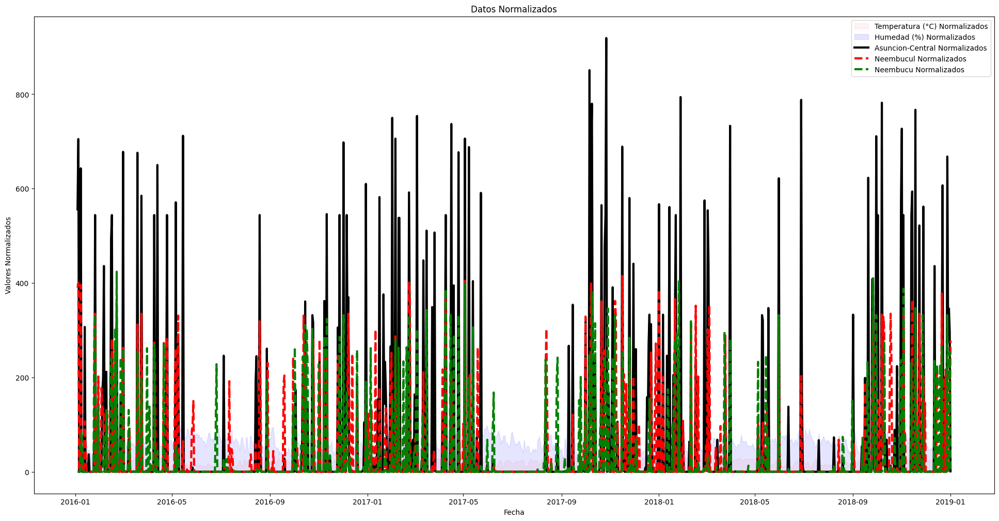

In [ ]:
n=25000
# Graficar los datos estandarizados
plt.figure(figsize=(24, 12))
# Graficar la temperatura como un gráfico de área
plt.fill_between(df_combinado.index[:n], df_combinado['Temperatura'][:n], label='Temperatura (°C) Normalizados', color='red', alpha=0.05)

# Graficar la humedad como un gráfico de área
plt.fill_between(df_combinado.index[:n], df_combinado['Humedad'][:n], label='Humedad (%) Normalizados', color='blue', alpha=0.1)
# plt.plot(df_estandarizado.index, df_estandarizado['Asuncion_Positivo'], label='Asuncion Positivos Estandarizados', linestyle='--')
# plt.plot(df_estandarizado.index, df_estandarizado['Central_Positivo'], label='Central Positivos Estandarizados', linestyle='--')
# Asegúrate de incluir el resto de las líneas para 'Negativo' si es necesario

# plt.plot(df_normalizado.index, df_normalizado['Asuncion-Central_Negativo'],
#          label='Asuncion-Central Negativo Normalizados',
#          color='red',
#          linestyle='--',
#          )
# plt.plot(df_normalizado.index, df_normalizado['Asuncion-Central_Positivo'],
#          label='Asuncion-Central Positivos Normalizados',
#          color='blue',linestyle='dotted',
#          )
plt.plot(df_combinado.index[:n], df_combinado['Asuncion_Central'][:n],
         label='Asuncion-Central Normalizados',
         color='black',linewidth=3,
         )
plt.plot(df_combinado.index[:n], df_combinado['Concepcion'][:n],
         label='Neembucul Normalizados',
         color='red',linestyle='--',linewidth=3,
         )

plt.plot(df_combinado.index[:n], df_combinado['Neembucu'][:n],
         label='Neembucu Normalizados',
         color='green',linestyle='--',linewidth=3,
         )
plt.xlabel('Fecha')
plt.ylabel('Valores Normalizados')
plt.title('Datos Normalizados')
plt.legend()
plt.show()
# '-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashed', 'dashdot', 'dotted'



In [ ]:
# print(df_combinado.columns)df_normalizado
df_normalizado=df_normalizado[['Temperatura', 'Humedad','Asuncion_Central','Neembucu','Concepcion']]

df_estandarizado=df_estandarizado[['Temperatura', 'Humedad','Asuncion_Central','Neembucu','Concepcion']]
    # 'Asuncion_Positivo', 'Asuncion_Negativo',
    # 'Central_Positivo','Central_Negativo',
    # 'Asuncion_Snet_Negativo', 'Asuncion_Snet_Positivo',
    # 'Central_Snet_Negativo', 'Central_Snet_Positivo',
    # ])
# df_combinado.describe()
df_combinado=df_combinado[['Temperatura', 'Humedad','Asuncion_Central','Neembucu','Concepcion']]
    # 'Asuncion_Positivo', 'Asuncion_Negativo',
    # 'Central_Positivo','Central_Negativo',
    # 'Asuncion_Snet_Negativo', 'Asuncion_Snet_Positivo',
    # 'Central_Snet_Negativo', 'Central_Snet_Positivo',
    # ])
df_combinado.describe()

,Temperatura,Humedad,Asuncion_Central,Neembucu,Concepcion
count,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000
mean,24.127971,62.562157,62.878428,28.819927,33.198355
std,5.918328,14.806507,164.153825,79.643473,84.316595
min,9.000000,26.000000,0.000000,0.000000,0.000000
25%,20.000000,52.000000,0.000000,0.000000,0.000000
50%,25.000000,62.000000,0.000000,0.000000,0.000000
75%,29.000000,73.000000,2.000000,0.000000,1.000000
max,35.000000,99.000000,919.000000,424.000000,415.000000


In [ ]:

# Assuming you have your dataset df_combinado
# Extract the relevant columns
df_time_series = df_normalizado

# Split the data into train and test sets
train_size = int(len(df_time_series) * 0.8)
train, test = df_time_series[:train_size], df_time_series[train_size:]
print(train_size)

875


In [ ]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 10.5 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


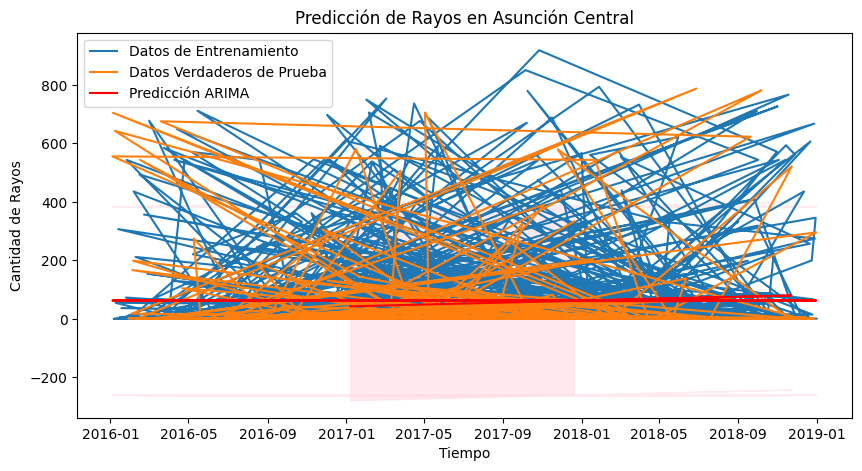

In [ ]:
import pmdarima as pm
# Load your dataframe
# df_combinado = pd.read_csv('your_data.csv')  # Uncomment and set your data source

# Assuming df_combinado is already loaded with the correct columns
# Split the data into train and test sets
train, test = train_test_split(df_combinado, test_size=0.2)
# Ajustar un modelo ARIMA
# La función auto_arima intentará encontrar el mejor orden (p, d, q)
model = pm.auto_arima(train['Asuncion_Central'], seasonal=False, m=1, suppress_warnings=True,
                      error_action='ignore', stepwise=True)

# Predecir los siguientes pasos
forecast, conf_int = model.predict(n_periods=len(test), return_conf_int=True)

# Comparar la predicción con los datos de prueba
plt.figure(figsize=(10, 5))
plt.plot(train.index, train['Asuncion_Central'], label='Datos de Entrenamiento')
plt.plot(test.index, test['Asuncion_Central'], label='Datos Verdaderos de Prueba')
plt.plot(test.index, forecast.values, label='Predicción ARIMA', color='red')
plt.fill_between(test.index, conf_int[:, 0], conf_int[:, 1], color='pink', alpha=0.3)
plt.title('Predicción de Rayos en Asunción Central')
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de Rayos')
plt.legend()
plt.show()

In [ ]:

import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from pmdarima import auto_arima

# Assuming your data is uploaded to Colab and accessible as 'df_combinado'

# Separate features and target
features = df_combinado.drop(columns=['Asuncion_Central'], axis=1)
target = df_combinado[['Asuncion_Central']]

train_features, test_features = train_test_split(features, test_size=0.2)
train_target, test_target = train_test_split(target, test_size=0.2)
# Check for stationarity of the target series
def is_stationary(data):
  adf_test = adfuller(data)
  p_value = adfuller(data)[1]
  significance_level = 0.05

  print(f"ADF Statistic: {adf_test[0]:.4f}")
  print(f"p-Value: {p_value:.4f}")

  if p_value < significance_level:
    print("The data is stationary.")
    return True
  else:
    print("The data is not stationary.")
    return False

if not is_stationary(target):
  # If not stationary, consider differencing or alternative methods
  print("Stationarity could not be achieved. Consider differencing or other methods.")
else:
  # Split data into training and testing sets

  train, test = train_test_split(df_combinado, test_size=0.2)

  # Use auto_arima for automatic ARIMA order selection
  stepwise_model = auto_arima(train_target, exogenous=train_features.values, trace=True, error_action='ignore', suppress_warnings=True)
  print(stepwise_model.summary())  # Print auto_arima summary

  # Fit the ARIMAX model
  model = ARIMA(train_target, order=stepwise_model.order, exog=train_features.values)
  model_fit = model.fit()

  # Scale data for training and inverse transform for predictions
  scaler_features = MinMaxScaler(feature_range=(0, 1))
  scaler_target = MinMaxScaler(feature_range=(0, 1))

  train_features=scaler_features.fit_transform(train_features)
  train_target=scaler_target.fit_transform(train_target)

  inverted_train_features = scaler_features.inverse_transform(train_features)
  inverted_test_features = scaler_features.inverse_transform(test_features)
# Make predictions on test data
  predictions = model_fit.forecast(steps=len(test_target), exog=inverted_test_features)


  inverted_predictions = scaler_target.inverse_transform(predictions.values.reshape(-1, 1))

# Evaluate the model (RMSE, MAE)
  rmse = mean_squared_error(test_target, inverted_predictions)
  mae = mean_absolute_error(test_target, inverted_predictions)

ADF Statistic: -12.4997
p-Value: 0.0000
The data is stationary.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=3.38 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=11465.877, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=11465.414, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=11465.546, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11585.835, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=11467.239, Time=0.31 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=11467.370, Time=0.66 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=11469.270, Time=0.84 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=11560.215, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 5.911 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  875
Model:               SARIMAX(1, 0, 0)   Log Likelihood       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsm

In [ ]:
target

,Asuncion_Central
timestamp,
2016-01-04,556.0
2016-01-05,705.0
2016-01-06,0.0
2016-01-07,0.0
2016-01-08,643.0
...,...
2018-12-28,668.0
2018-12-29,275.0
2018-12-30,346.0


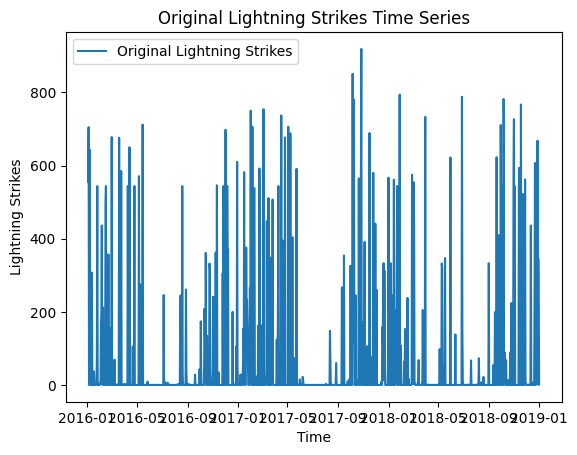

ADF Statistic: -12.4997
p-Value: 0.0000
The data is stationary.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=11369.729, Time=4.10 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=11375.075, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=11369.638, Time=0.38 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=11369.467, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11492.449, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=11371.645, Time=1.60 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=11371.397, Time=1.47 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=11373.466, Time=1.24 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=11461.511, Time=0.26 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 10.131 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  875
Model:               SARIMAX(0, 0, 1)   Log Likelihood

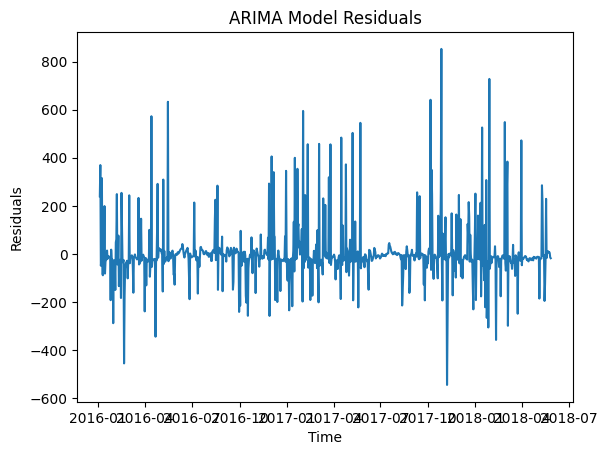

In [ ]:

# Separate features and target
features = df_combinado.drop(columns=['Asuncion_Central'], axis=1)
target = df_combinado[['Asuncion_Central']]

train_features, test_features = train_test_split(features, test_size=0.2)
train_target, test_target = train_test_split(target, test_size=0.2)
# Plot the original target series (lightning strikes)
plt.plot(target.index, target.values, label='Original Lightning Strikes')
plt.title('Original Lightning Strikes Time Series')
plt.xlabel('Time')
plt.ylabel('Lightning Strikes')
plt.legend()
plt.show()

# ... your existing code for stationarity check and model fitting ...

# Check for stationarity of the target series
def is_stationary(data):
  adf_test = adfuller(data)
  p_value = adfuller(data)[1]
  significance_level = 0.05

  print(f"ADF Statistic: {adf_test[0]:.4f}")
  print(f"p-Value: {p_value:.4f}")

  if p_value < significance_level:
    print("The data is stationary.")
    return True
  else:
    print("The data is not stationary.")
    return False

if not is_stationary(target):
  # If not stationary, consider differencing or alternative methods
  print("Stationarity could not be achieved. Consider differencing or other methods.")
else:
  # Split data into training and testing sets
  train_size = int(len(target) * 0.8)
  train_features, train_target = features.iloc[:train_size], target.iloc[:train_size]
  test_features, test_target = features.iloc[train_size:], target.iloc[train_size:]

  # Use auto_arima for automatic ARIMA order selection
  stepwise_model = auto_arima(train_target, exogenous=train_features.values, trace=True, error_action='ignore', suppress_warnings=True)
  print(stepwise_model.summary())  # Print auto_arima summary

  # Fit the ARIMAX model
  model = ARIMA(train_target, order=stepwise_model.order, exog=train_features.values)
  model_fit = model.fit()

  # Scale data for training and inverse transform for predictions
  scaler_features = MinMaxScaler(feature_range=(0, 1))
  scaler_target = MinMaxScaler(feature_range=(0, 1))

  train_features=scaler_features.fit_transform(train_features)
  train_target=scaler_target.fit_transform(train_target)

  inverted_train_features = scaler_features.inverse_transform(train_features)
  inverted_test_features = scaler_features.inverse_transform(test_features)
# Make predictions on test data
  predictions = model_fit.forecast(steps=len(test_target), exog=inverted_test_features)


  inverted_predictions = scaler_target.inverse_transform(predictions.values.reshape(-1, 1))

# Plot the ACF (Autocorrelation Function) and PACF (Partial Autocorrelation Function) of the differenced target series (if differencing was applied)
from statsmodels.tsa.stattools import acf, pacf

if not is_stationary(target):
    # ... differencing code (if applicable) ...
    differenced_target = target.diff().dropna()  # Apply differencing and remove NaN values
    lags = range(20)  # Adjust the number of lags as needed

    plt.figure(figsize=(12, 6))

    # Plot ACF
    plt.subplot(211)
    acf_values = acf(differenced_target, nlags=lags)
    plt.plot(lags, acf_values, label='ACF')
    plt.axhline(y=1.96/np.sqrt(len(differenced_target)), color='red', linestyle='--', label='Confidence Interval')
    plt.axhline(y=-1.96/np.sqrt(len(differenced_target)), color='red', linestyle='--')
    plt.xlabel('Lags')
    plt.ylabel('Autocorrelation')
    plt.title('ACF of Differenced Target Series')
    plt.legend()

    # Plot PACF
    plt.subplot(212)
    pacf_values = pacf(differenced_target, nlags=lags)
    plt.plot(lags, pacf_values, label='PACF')
    plt.axhline(y=1.96/np.sqrt(len(differenced_target)), color='red', linestyle='--', label='Confidence Interval')
    plt.axhline(y=-1.96/np.sqrt(len(differenced_target)), color='red', linestyle='--')
    plt.xlabel('Lags')
    plt.ylabel('Partial Autocorrelation')
    plt.title('PACF of Differenced Target Series')
    plt.legend()

    plt.tight_layout()
    plt.show()


# Plot the residuals of the fitted ARIMA model
plt.plot(model_fit.resid)
plt.title('ARIMA Model Residuals')
plt.xlabel('Time')
plt.ylabel('Residuals')
plt.show()
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


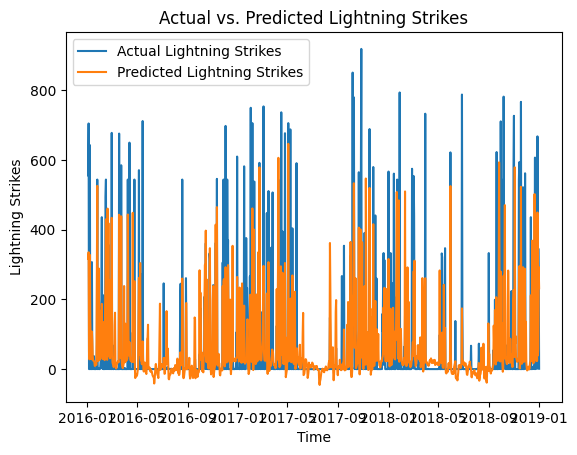

In [ ]:
prediccion = model_fit.predict(start=target.index.min(),
                                end=target.index.max(), typ='levels',exog=test_features)

# Plot the actual vs. predicted lightning strikes
plt.plot(target.index, target.values, label='Actual Lightning Strikes')
plt.plot(prediccion.index, prediccion.values, label='Predicted Lightning Strikes')
plt.title('Actual vs. Predicted Lightning Strikes')
plt.xlabel('Time')
plt.ylabel('Lightning Strikes')
plt.legend()
plt.show()


In [ ]:
prediccion = modelo_arima_entrenado.predict(start=df_combinado['Asuncion_Central'].index.min(),
                                end=df_combinado['Asuncion_Central'].index.max(), typ='levels')
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Plot the actual vs. predicted lightning strikes
plt.plot(target.index, target.values, label='Actual Lightning Strikes')
plt.plot(prediccion.index, prediccion.values, label='Predicted Lightning Strikes')
plt.title('Actual vs. Predicted Lightning Strikes')
plt.xlabel('Time')
plt.ylabel('Lightning Strikes')
plt.legend()
plt.show()

# Plot the decomposition components of the target series (optional)
decomposition = seasonal_decompose(target, model='additive')  # Adjust model for multiplicative if needed

plt.figure(figsize=(12, 6))

plt.subplot(411)
plt.plot(decomposition.observed, label='Observed')
plt.title('Observed')
plt.legend()

plt.subplot(412)
plt.plot(decomposition.trend, label='Trend')
plt.title('Trend')
plt.legend()

plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal')
plt.title('Seasonal')
plt.legend()

plt.subplot(414)
plt.plot(decomposition.resid, label='Residuals')
plt.title('Residuals')
plt.legend()

plt.tight_layout()
plt.show()

# Plot the forecast vs actual (optional)
# ... existing code for plotting forecast vs actual ...

# plt.show()  # Show the final plot (forecast vs actual)

NameError: name 'modelo_arima_entrenado' is not defined

In [ ]:
# Ajustar el modelo ARIMA
modelo_arima = ARIMA(df_combinado['Asuncion_Central'], order=(1,2,1))
# p: orden del componente autorregresivo (AR).
# d: orden de diferenciación, que indica cuántas veces se diferencia la serie temporal para hacerla estacionaria.
# q: orden del componente de media móvil (MA).

modelo_arima_entrenado = modelo_arima.fit()

# Generar una predicción
prediccion = modelo_arima_entrenado.predict(start=df_combinado['Asuncion_Central'].index.min(),
                                end=df_combinado['Asuncion_Central'].index.max(), typ='levels')
plt.figure(figsize=(12, 6))
plt.plot(df_combinado['Asuncion_Central'], label='Datos reales')
plt.plot(prediccion.index, prediccion.values, label='Predicción')
plt.title('Predicción con ARIMA')
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.legend()
plt.show()

In [ ]:
try:
  # Assuming future_target_actual.index starts after test_target_actual.index

  # Separate actual values for test set and future periods (modify based on your data structure)
  future_start_index = '2018'  # Assuming 'Asuncion_Central' has date/time as index
  test__actual = df_combinado['Asuncion_Central'] # Use .loc for selecting by label
  test_target_actual = test_target_actual['2016':'2018']
  future_target_actual = df_combinado['Asuncion_Central']  # Use .loc for selecting by label
  future_target_actual = future_target_actual['2018':]

  test_feature_actual = df_combinado.drop(columns=['Asuncion_Central'],axis=1)
  test_feature_actual = test_feature_actual['2016':'2018']
  future_feature_actual = df_combinado.drop(columns=['Asuncion_Central'], axis=1 ) # Use .loc for selecting by label
  future_feature_actual = future_feature_actual['2018':]
  # Check if data is available for future periods
  if len(future_target_actual) == 0:
    print("Error: No data available for future periods. Skipping forecast plot.")
    raise IndexError  # Raise an exception to exit the try block

  # Get the last index of future_target_actual (assuming it's a datetime index)
  end = future_target_actual.index[-1]
  print(end)

  # Handle exogenous variables (if applicable)
  exogenous_variables = test_feature_actual  # Assuming no exogenous variables by default


  # Plot using actual values for future periods
  plt.plot(test_target_actual.index, test_target_actual.values, label='Actual Lightning Strikes (Test)')
  plt.plot(future_target_actual.index, future_target_actual.values, label='Actual Lightning Strikes (Future)')

  # Use exog argument if you have future exogenous values

  predictions = model_fit.predict(steps=len(test_target_actual.values), end=end, exog=exogenous_variables)

  plt.plot(future_target_actual.index, predictions, label='Predicted Lightning Strikes (Future)')
  plt.title('Forecast vs. Actual Lightning Strikes')
  plt.xlabel('Time')
  plt.ylabel('Lightning Strikes')
  plt.legend()
  plt.show()
except IndexError:
  print("Error: No data available for plotting forecast vs actual. Skipping plot.")


In [ ]:
try:
  # Assuming future_target_actual.index starts after test_target_actual.index
    # Get the last index of future_target_actual

  # Separate actual values for test set and future periods (modify based on your data structure)
  future_start_index = '2018'


  end = future_target_actual.index[-1]
  print(end)
  # Plot using actual values for future periods
  plt.plot(test_target_actual.index, test_target_actual.values, label='Actual Lightning Strikes (Test)')
  plt.plot(future_target_actual.index, future_target_actual.values, label='Actual Lightning Strikes (Future)')
  plt.plot(future_target_actual.index, model_fit.forecast(steps=len(future_target_actual.values)), label='Predicted Lightning Strikes (Future)')
  plt.title('Forecast vs. Actual Lightning Strikes')
  plt.xlabel('Time')
  plt.ylabel('Lightning Strikes')
  plt.legend()
  plt.show()
except IndexError:
  print("Error: No data available for plotting forecast vs actual. Skipping plot.")


In [ ]:
# Assuming future_target_actual.index starts after test_target_actual.index
# end = future_target_actual.index[-1]  # Get the last index of future_target_actual

# Separate actual values for test set and future periods (modify based on your data structure)
future_start_index = '2018'

print(test_target_actual)

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima

# Assuming you have your dataset df_combinado
# Extract the relevant columns
df_time_series = df_normalizado['Asuncion_Central']
# Split the data into train and test sets
# train_size = int(len(df_time_series) * 0.8)

train, test = train_test_split(df_time_series, test_size=0.2)
# train, test = df_time_series[:train_size], df_time_series[train_size:]

# Fit a seasonal ARIMA model using auto_arima to determine optimal parameters
model_sarima = auto_arima(train, seasonal=True, suppress_warnings=True, stepwise=True, error_action="ignore")

# Forecast using SARIMA
forecast, conf_int = model_sarima.predict(n_periods=len(test), return_conf_int=True)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(df_time_series.index, df_time_series, label='Actual')
plt.plot(test.index, forecast, label='SARIMA Forecast', color='red')
plt.fill_between(test.index, conf_int[:, 0], conf_int[:, 1], color='gray', alpha=0.2)
plt.xlabel('Date')
plt.ylabel('Asuncion_Central')
plt.title('SARIMA Forecast')
plt.legend()
plt.show()

In [ ]:



# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima_model import ARIMA
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error



prediction_len = 10
# Preparación d.///e los Datos: Crear retardos temporales para las columnas objetivo
num_lags =15  #
for col in ['Asuncion_Central']:
    for i in range(1, num_lags + 1):
        df_combinado[f'{col}_lag{i}'] = df_combinado[col].shift(i)
# print(df_combinado)
# Eliminar las filas con valores NaN que se crean por el uso de shift


for col in df_combinado.columns:
    df_combinado[col] = round(df_combinado[col].fillna(0))
# Creación de Features y Target
features = df_combinado.drop(['Asuncion_Central'], axis=1)
target = df_combinado[['Asuncion_Central']]
# shift_range = range(1, prediction_len + 1)
# targets = df_combinado[['Asuncion_Central']].shift(-shift_range)
# target = np.concatenate(targets, axis=1)
# Apply RobustScaler

scaler_features = MinMaxScaler(feature_range=(0, 1))
scaler_target = MinMaxScaler(feature_range=(0, 1))
features_scaled = scaler_features.fit_transform(features.values)
target_scaled = scaler_target.fit_transform(target.values)
# Define the learning rate schedule


# Convert target_scaled back to original scale
target_original = target.dropna()

# Create a time series dataframe
df_time_series = pd.DataFrame(df_combinado, columns=['Asuncion_Central']).dropna()

# Split the data into train and test sets
train_size = int(len(df_time_series) * 0.8)
train, test = df_time_series[:train_size], df_time_series[train_size:]

# Fit an ARIMA model using auto_arima to determine optimal parameters
model_arima = auto_arima(train.values, seasonal=False, suppress_warnings=True, stepwise=True, error_action="ignore")

# Forecast using ARIMA
forecast, conf_int = model_arima.predict(n_periods=len(test), return_conf_int=True)

# Calculate Mean Absolute Error (MAE)
mae_arima = mean_absolute_error(test, forecast)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(df_time_series.index, df_time_series['Asuncion_Central'], label='Actual')
plt.plot(test.index, forecast, label='ARIMA Forecast', color='red')
plt.fill_between(test.index, conf_int[:, 0], conf_int[:, 1], color='gray', alpha=0.2)
plt.xlabel('Date')
plt.ylabel('Asuncion_Central')
plt.title(f'ARIMA Forecast (MAE: {mae_arima:.2f})')
plt.legend()
plt.show()

In [ ]:
df_combinado.columns

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from pmdarima import auto_arima

num_lags =15  #
for col in ['Asuncion_Central']:
    for i in range(1, num_lags + 1):
        df_combinado[f'{col}_lag{i}'] = df_combinado[col].shift(i)
# print(df_combinado)
# Eliminar las filas con valores NaN que se crean por el uso de shift


for col in df_combinado.columns:
    df_combinado[col] = round(df_combinado[col].fillna(0))
# Creación de Features y Target
# Assuming you've already preprocessed your data (features, target)

# Separate features and target from the DataFrame
features = df_combinado.drop(columns=['Asuncion_Central'], axis=1)
target = df_combinado[['Asuncion_Central']]

# Create MinMaxScaler objects (one for features, one for target)
scaler_features = MinMaxScaler(feature_range=(0, 1))
scaler_target = MinMaxScaler(feature_range=(0, 1))

# Fit the scalers to the training data (features and target separately)
scaler_features.fit(features)
scaler_target.fit(target)

# Reshape features (assuming features are already scaled)
features_scaled = features.values.reshape(-1, features.shape[1])

# ... rest of your code using features_scaled, target, scaler_features, scaler_target

# Invert scaling after model fitting and prediction (example)
# Perform Augmented Dickey-Fuller Test (ADF) to check for stationarity
def is_stationary(data):
  # Perform the ADF test
  adf_test = adfuller(data)
  p_value = adfuller(data)[1]
  # Significance level for the test
  significance_level = 0.05

  # Print the test results
  print(f"ADF Statistic: {adf_test[0]:.4f}")
  print(f"p-Value: {p_value:.4f}")

  # Interpret the results
  if p_value < significance_level:
    print("The data is stationary.")
    return True
  else:
    print("The data is not stationary.")
    return False

# Check stationarity of the original data
if not is_stationary(target):
  # If not stationary, apply differencing until stationarity is achieved
  differenced_data = target.diff().dropna()
  # Check stationarity again after differencing
  if is_stationary(differenced_data):
    # Use the differenced data for ARIMA modeling
    target = differenced_data
  else:
    print("Stationarity could not be achieved after differencing.")
    # Handle non-stationary data (consider alternative methods)

# Split data into training and testing sets
train_size = int(len(target) * 0.8)
train_features, train_target = features_scaled[:train_size], target[:train_size]
test_features, test_target = features_scaled[train_size:], target[train_size:]

# Use auto_arima to identify ARIMA order
stepwise_model = auto_arima(train_target, exogenous=train_features, trace=True, error_action='ignore', suppress_warnings=True)
print(stepwise_model.summary())  # Print auto_arima summary

# Fit the ARIMAX model
model = ARIMA(train_target, order=stepwise_model.order, exog=train_features)
model_fit = model.fit()

# Invert scaling for predictions on test data
scaler_features = MinMaxScaler(feature_range=(0, 1))
scaler_target = MinMaxScaler(feature_range=(0, 1))

inverted_train_target = scaler_target.inverse_transform(train_target.reshape(-1, 1))[:, 0]

inverted_train_features = features.inverse_transform(train_features)
inverted_test_features = features.inverse_transform(test_features)
# inverted_train_target = scaler_target.inverse_transform(train_target.reshape(-1, 1))[:, 0]

# Make predictions on test data using features
predictions = model_fit.forecast(steps=len(test_target), exog=inverted_test_features)
inverted_predictions = scaler_target.inverse_transform(predictions.reshape(-1, 1))[:, 0]

# Evaluate the model (RMSE, MAE)
rmse = mean_squared_error(inverted_test_target, inverted_predictions)
mae = mean_absolute_error(inverted_test_target, inverted_predictions)

print("Inverted Train Target:", inverted_train_target)
print("Inverted Train Features:", inverted_train_features)
print("Inverted Predictions:", inverted_predictions)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)


In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from pmdarima import auto_arima

# Assuming you've already preprocessed your data (features_scaled, target_scaled)
# Select target data for ARIMA modeling
target = df_combinado

# Perform Augmented Dickey-Fuller Test (ADF) to check for stationarity
def is_stationary(data):
  # Perform the ADF test
  adf_test = adfuller(data)
  p_value = adfuller(data)[1]
  # Significance level for the test
  significance_level = 0.05

  # Print the test results
  print(f"ADF Statistic: {adf_test[0]:.4f}")
  print(f"p-Value: {p_value:.4f}")

  # Interpret the results
  if p_value < significance_level:
    print("The data is stationary.")
    return True
  else:
    print("The data is not stationary.")
    return False

# Check stationarity of the original data
if not is_stationary(target):
  # If not stationary, apply differencing until stationarity is achieved
  differenced_data = target.diff().dropna()
  # Check stationarity again after differencing
  if is_stationary(differenced_data):
    # Use the differenced data for ARIMA modeling
    target = differenced_data
  else:
    print("Stationarity could not be achieved after differencing.")
    # Handle non-stationary data (consider alternative methods)

# Split data into training and testing sets
train_size = int(len(target) * 0.8)
train, test = target[:train_size], target[train_size:]

# Use auto_arima to automatically identify ARIMA order
stepwise_model = auto_arima(train['Asuncion_Central'], trace=True, error_action='ignore', suppress_warnings=True)
print(stepwise_model.summary())  # Print auto_arima summary

# Fit the ARIMA model
model = ARIMA(train['Asuncion_Central'], order=stepwise_model.order)
model_fit = model.fit()

# Invert scaling for predictions on test data
scaler = MinMaxScaler(feature_range=(0, 1))
inverted_train = scaler.inverse_transform(train.reshape(-1, 1))[:, 0]

# Make predictions on test data
start_index = len(train)
predictions = model_fit.forecast(steps=len(test))
inverted_predictions = scaler.inverse_transform(predictions.reshape(-1, 1))[:, 0]

# Evaluate the model (RMSE, MAE)
rmse = mean_squared_error(inverted_test, inverted_predictions)
mae = mean_absolute_error(inverted_test, inverted_predictions)

print("Inverted Train:", inverted_train)
print("Inverted Predictions:", inverted_predictions)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)


In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Assuming you've already preprocessed your data (features_scaled, target_scaled)
# Select target data for ARIMA modeling
target = target_scaled.reshape(-1)

# Perform Augmented Dickey-Fuller Test (ADF) to check for stationarity
def is_stationary(data):
  # Perform the ADF test
  adf_test = adfuller(data)
  p_value = adfuller(data)[1]
  # Significance level for the test
  significance_level = 0.05

  # Print the test results
  print(f"ADF Statistic: {adf_test[0]:.4f}")
  print(f"p-Value: {p_value:.4f}")

  # Interpret the results
  if p_value < significance_level:
    print("The data is stationary.")
    return True
  else:
    print("The data is not stationary.")
    return False

# Check stationarity of the original data
if not is_stationary(target):
  # If not stationary, apply differencing until stationarity is achieved
  differenced_data = target.diff().dropna()
  # Check stationarity again after differencing
  if is_stationary(differenced_data):
    # Use the differenced data for ARIMA modeling
    target = differenced_data
  else:
    print("Stationarity could not be achieved after differencing.")
    # Handle non-stationary data (consider alternative methods)

# Split data into training and testing sets
train_size = int(len(target) * 0.8)
train, test = target[:train_size], target[train_size:]

# Define and fit the ARIMA model using best p, d, and q values identified through tools like ACF/PACF plots or automated methods
# Here, we'll assume p=2, d=1 (differencing applied if needed), and q=1 based on common practices (you might need to adjust these)
model = ARIMA(train, order=(2, 1 if not is_stationary(target) else 0, 1))  # Adjust p, d, q as needed
model_fit = model.fit()

# Invert scaling for predictions on test data
# scaler = MinMaxScaler(feature_range=(0, 1))
inverted_train = target_scaler.inverse_transform(train.reshape(-1, 1))[:, 0]

# Make predictions on test data
start_index = len(train)
predictions = model_fit.forecast(steps=len(test))
inverted_predictions = target_scaler.inverse_transform(predictions.reshape(-1, 1))[:, 0]

# Evaluate the model (RMSE, MAE)
rmse = mean_squared_error(inverted_test, inverted_predictions)
mae = mean_absolute_error(inverted_test, inverted_predictions)

print("Inverted Train:", inverted_train)
print("Inverted Predictions:", inverted_predictions)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.callbacks import LearningRateScheduler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Assuming you've already preprocessed your data (features_scaled, target_scaled)
from keras.optimizers import SGD
from keras.optimizers.schedules import ExponentialDecay

prediction_len = 10
# Preparación d.///e los Datos: Crear retardos temporales para las columnas objetivo
num_lags =15  #
for col in ['Asuncion_Central']:
    for i in range(1, num_lags + 1):
        df_combinado[f'{col}_lag{i}'] = df_combinado[col].shift(i)
# print(df_combinado)
# Eliminar las filas con valores NaN que se crean por el uso de shift


for col in df_combinado.columns:
    df_combinado[col] = round(df_combinado[col].fillna(0))
# Creación de Features y Target
features = df_combinado.drop(['Asuncion_Central'], axis=1)
target = df_combinado[['Asuncion_Central']]
# shift_range = range(1, prediction_len + 1)
# targets = df_combinado[['Asuncion_Central']].shift(-shift_range)
# target = np.concatenate(targets, axis=1)
# Apply RobustScaler

scaler_features = MinMaxScaler(feature_range=(0, 1))
scaler_target = MinMaxScaler(feature_range=(0, 1))
features_scaled = scaler_features.fit_transform(features.values)
target_scaled = scaler_target.fit_transform(target.values)
# Define the learning rate schedule

# Assuming you have a time series dataset with a single column 'Asuncion_Central'
# Load your data here (replace 'your_data.csv' with your actual data file)
# df = pd.read_csv('your_data.csv')

# Assuming you've already preprocessed your data (features_scaled, target_scaled)
# features_scaled and target_scaled are already defined in your code snippet

# Inverse transform the scaled target to get the original values

X_train, X_test, y_train, y_test = train_test_split(features_scaled, target_scaled, test_size=0.2, random_state=0)

X_train_reshaped = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_reshaped = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))






from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import MinMaxScaler





y_train_original = scaler_target.inverse_transform(y_train)
y_test_original = scaler_target.inverse_transform(y_test)

# Create ARIMA model
order = (1, 1, 1)  # You can adjust these parameters based on your data
model_arima = ARIMA(y_train_original, order=order)
model_arima_fit = model_arima.fit()

# Forecast using ARIMA
forecast_steps = len(y_test_original)
forecast, stderr, conf_int = model_arima_fit.forecast(steps=forecast_steps)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test_original, forecast)
print(f"ARIMA MAE: {mae:.2f}")

# Plot actual vs. forecast
plt.figure(figsize=(10, 6))
plt.plot(y_test_original, label='Actual')
plt.plot(forecast, label='ARIMA Forecast', color='orange')
plt.xlabel('Time')
plt.ylabel('Asuncion_Central')
plt.title('ARIMA Forecast vs. Actual')
plt.legend()
plt.show()

In [ ]:
# # Assuming you've already preprocessed your data (features_scaled, target_scaled)
# from keras.optimizers import SGD
# from keras.optimizers.schedules import ExponentialDecay

# prediction_len = 10
# # Preparación d.///e los Datos: Crear retardos temporales para las columnas objetivo
# num_lags =10  #
# for col in ['Asuncion_Central']:
#     for i in range(1, num_lags + 1):
#         df_combinado[f'{col}_lag{i}'] = df_combinado[col].shift(i)
# # print(df_combinado)
# # Eliminar las filas con valores NaN que se crean por el uso de shift


# for col in df_combinado.columns:
#     df_combinado[col] = df_combinado[col].fillna(0)
# # Creación de Features y Target
# features = df_combinado.drop(['Asuncion_Central'], axis=1)
# target = df_combinado[['Asuncion_Central']]
# # shift_range = range(1, prediction_len + 1)
# # targets = df_combinado[['Asuncion_Central']].shift(-shift_range)
# # target = np.concatenate(targets, axis=1)
# # Apply RobustScaler

# scaler_features = MinMaxScaler(feature_range=(0, 1))
# scaler_target = MinMaxScaler(feature_range=(0, 1))
# features_scaled = scaler_features.fit_transform(features.values)
# target_scaled = scaler_target.fit_transform(target.values)

# # scaler_features = MinMaxScaler(feature_ra
# # Perform walk-forward validation
# for fold in range(num_folds):
#     # Split data into train and validation for this fold
#     X_train_fold, X_val_fold, y_train_fold, y_val_fold = ...

#     # Create and train your LSTM model
#     model = Sequential()
#     # Add layers (similar to your existing architecture)
#     ...
#     model.compile(optimizer=optimizer, loss='mae')
#     model.fit(X_train_fold, y_train_fold, ...)

#     # Evaluate on validation data
#     val_loss = model.evaluate(X_val_fold, y_val_fold, ...)

#     # Store val_loss for this fold (you can also track other metrics)
#     fold_losses.append(val_loss)

# # Calculate average validation loss across all folds
# avg_val_loss = sum(fold_losses) / num_folds
# print(f"Average validation loss: {avg_val_loss:.4f}")


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.callbacks import LearningRateScheduler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Assuming you've already preprocessed your data (features_scaled, target_scaled)
from keras.optimizers import SGD
from keras.optimizers.schedules import ExponentialDecay

prediction_len = 10
# Preparación d.///e los Datos: Crear retardos temporales para las columnas objetivo
num_lags =15  #
for col in ['Asuncion_Central']:
    for i in range(1, num_lags + 1):
        df_combinado[f'{col}_lag{i}'] = df_combinado[col].shift(i)
# print(df_combinado)
# Eliminar las filas con valores NaN que se crean por el uso de shift


for col in df_combinado.columns:
    df_combinado[col] = round(df_combinado[col].fillna(0))
# Creación de Features y Target
features = df_combinado.drop(['Asuncion_Central'], axis=1)
target = df_combinado[['Asuncion_Central']]
# shift_range = range(1, prediction_len + 1)
# targets = df_combinado[['Asuncion_Central']].shift(-shift_range)
# target = np.concatenate(targets, axis=1)
# Apply RobustScaler

scaler_features = MinMaxScaler(feature_range=(0, 1))
scaler_target = MinMaxScaler(feature_range=(0, 1))
features_scaled = scaler_features.fit_transform(features.values)
target_scaled = scaler_target.fit_transform(target.values)
# Define the learning rate schedule

X_train, X_test, y_train, y_test = train_test_split(features_scaled, target_scaled, test_size=0.2, random_state=0)

X_train_reshaped = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_reshaped = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
initial_lr = 1e-3
decay_steps = 100000
decay_rate = 0.9
lr_schedule = ExponentialDecay(initial_learning_rate=initial_lr,
                               decay_steps=decay_steps,
                               decay_rate=decay_rate)

# Create the SGD optimizer with the time-based learning rate
optimizer = Adam(learning_rate=lr_schedule)

# Create the LSTM model
model = Sequential()
model.add(LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]),
               return_sequences=True, kernel_regularizer=tf.keras.regularizers.l1_l2(l1=0.000000001, l2=0.000001)))
model.add(Dropout(0.2))
model.add(LSTM(64, return_sequences=False, kernel_regularizer=tf.keras.regularizers.l1_l2(l1=0.000000001, l2=0.000001)))
model.add(Dense(1))

# Compile the model
model.compile(optimizer=optimizer, loss='mae')

# Train the model
history = model.fit(X_train_reshaped,
                    y_train,
                    validation_data=(X_test_reshaped, y_test),
                    epochs=50,
                    batch_size=32,
                    callbacks=[LearningRateScheduler(lambda epoch, lr: lr * tf.math.exp(-0.1))],
                    verbose=2)

In [ ]:

y_pred = model.predict(X_test_reshaped)

In [ ]:
# y_test_inv = scaler_target.inverse_transform(y_test)
# #
# pred_inv = scaler_target.inverse_transform(y_pred)
# graf=pd.DataFrame()
# graf['y_test_inv']=y_test_inv[:, 0]
# graf['y_pred_inv']=pred_inv[:, 0]
# print(graf)

In [ ]:
rmse_positivo = sqrt(mean_squared_error(y_test_inv[:, 0], y_pred_inv[:, 0]))
print('RMSE Positivo:', rmse_positivo)
n=200
plt.figure(figsize=(12, 6))

y_test_inv = scaler_target.inverse_transform(y_test)
#
pred_inv = scaler_target.inverse_transform(y_pred)
# y_test_inv = scaler_min_max.inverse_transform(y_test)
# pred_inv = scaler_min_max.inverse_transform(y_pred)
plt.plot(y_test_inv[:, 0], label='Real Positivo')
plt.plot(pred_inv[:, 0], label='Predicho Positivo')
# plt.plot(y_test_inv[:n, 1], label='Real Negativo')
# plt.plot(pred_inv[:n, 1], label='Predicho Negativo')
plt.title('Comparación de Valores Reales vs Predicciones')
plt.ylabel('Cantidad de Rayos')
plt.xlabel('Observaciones')
plt.legend(loc='upper right')
plt.show()

In [ ]:
columnas_objetivo = ['Asuncion_Central']
history.plot_individual_accuracy(columnas_objetivo)
plot_loss(history)
plot_error_distribution(model, X_test, y_test, columnas_objetivo)  # Replace with your X_test and y_test if available


In [ ]:

from keras.optimizers import SGD
from keras.optimizers.schedules import ExponentialDecay

prediction_len = 10
# Preparación d.///e los Datos: Crear retardos temporales para las columnas objetivo
num_lags =10  #
for col in ['Asuncion_Central']:
    for i in range(1, num_lags + 1):
        df_combinado[f'{col}_lag{i}'] = df_combinado[col].shift(i)
# print(df_combinado)
# Eliminar las filas con valores NaN que se crean por el uso de shift


for col in df_combinado.columns:
    df_combinado[col] = df_combinado[col].fillna(0)
# Creación de Features y Target
features = df_combinado.drop(['Asuncion_Central'], axis=1)
target = df_combinado[['Asuncion_Central']]
# shift_range = range(1, prediction_len + 1)
# targets = df_combinado[['Asuncion_Central']].shift(-shift_range)
# target = np.concatenate(targets, axis=1)
# Apply RobustScaler

scaler_features = MinMaxScaler(feature_range=(0, 1))
scaler_target = MinMaxScaler(feature_range=(0, 1))
features_scaled = scaler_features.fit_transform(features.values)
target_scaled = scaler_target.fit_transform(target.values)

# scaler_features = MinMaxScaler(feature_range=(0, 1))
# scaler_target = MinMaxScaler(feature_range=(0, 1))

# features_scaled = scaler_features.fit_transform(features.values)
# target_scaled = scaler_target.fit_transform(target.values)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target_scaled, test_size=0.2, random_state=0)


# X_train, X_test, y_train, y_test = train_test_split(features.values, target.values, test_size=0.2, random_state=0)
# # Construcción del Modelo
# model = Sequential()
# model.add(LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), return_sequences=True))
# model.add(Dropout(0.2))
# model.add(LSTM(32, return_sequences=False))
# model.add(Dropout(0.2))
# model.add(Dense(2))  # Dos nodos de salida para predecir ambas polaridades
# model.compile(optimizer='adam', loss='mean_squared_error')
# Reshape los datos para el modelo LSTM

# # Entrenamiento del Modelo
# history = model.fit(X_train_reshaped, y_train, validation_data=(X_test_reshaped, y_test), epochs=100, batch_size=32)

X_train_reshaped = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_reshaped = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
def scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lr_schedule = ExponentialDecay(initial_learning_rate=1e-2, decay_steps=10000, decay_rate=0.9)
optimizer = SGD(learning_rate=lr_schedule)

callback = LearningRateScheduler(scheduler)
# # Building the Model with Regularization and different loss function
model = Sequential()
model.add(LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), return_sequences=True, kernel_regularizer=l1_l2(l1=0.0000001, l2=0.0001)))
model.add(Dropout(0.2))
model.add(LSTM(64, return_sequences=False, kernel_regularizer=l1_l2(l1=0.0000001, l2=0.0001)))
# model.add(Dropout(0.3))
model.add(Dense(1))
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='mae')

# Construcción del Modelo
# model = Sequential()
# model.add(LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]),
#                return_sequences=True,
#                kernel_regularizer=l1_l2(l1=0.000001, l2=0.0001)
#                ))
# model.add(Dropout(0.2))
# model.add(LSTM(64, return_sequences=False,
#                kernel_regularizer=l1_l2(l1=0.000001, l2=0.0001)
#                                         ))
# # model.add(Dropout(0.2))
# model.add(Dense(2))  # Dos nodos de salida para predecir ambas polaridades
# model.compile(optimizer='adam', loss='mean_squared_error')
# Reshape los datos para el modelo LSTM


# Training the Model with the new configurations
# history = model.fit(X_train_reshaped, y_train, validation_data=(X_test_reshaped, y_test), epochs=30, batch_size=64, callbacks=[callback])



# Entrenamiento del Modelo
history = model.fit(X_train_reshaped,
                    y_train,
                    validation_data=(X_test_reshaped, y_test),
                    epochs=50,
                    batch_size=64,
                    # callbacks=[callback],
                    verbose=2,
                    )

# Visualización de la pérdida durante el entrenamiento
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(loc='upper right')
plt.show()

# Predicciones

y_pred = model.predict(X_test_reshaped)
#  (reshape for multiple predictions)
# y_pred = model.predict(X_test_reshaped)
# y_pred_reshaped = y_pred.reshape(-1, prediction_len)  # Reshape to separate predictions

# Comparación de valores reales con predicciones
# Aquí deberías tener cuidado con cómo visualizar y comparar, dependiendo del tamaño de tus datos
# Por ejemplo, podrías visualizar las primeras n predicciones vs los valores reales:
# n =100   # Número de predicciones para visualizar10
# plt.figure(figsize=(12, 6))
# y_test_inv = scaler_target.inverse_transform(y_test)
# pred_inv = scaler_target.inverse_transform(y_pred)
# # y_test_inv = scaler_min_max.inverse_transform(y_test_inv)
# # pred_inv = scaler_min_max.inverse_transform(y_pred_inv)
# plt.plot(y_test_inv[:n, 0], label='Real Positivo')
# plt.plot(pred_inv[:n, 0], label='Predicho Positivo')
# # plt.plot(y_test_inv[:n, 1], label='Real Negativo')
# plt.title('Comparación de Valores Reales vs Predicciones')
# plt.ylabel('Cantidad de Rayos')
# plt.xlabel('Observaciones')
# plt.legend(loc='upper right')
# plt.show()

In [ ]:
n=200
plt.figure(figsize=(12, 6))

y_test_inv = scaler_target.inverse_transform(y_test)
#
pred_inv = scaler_target.inverse_transform(y_pred)
# y_test_inv = scaler_min_max.inverse_transform(y_test)
# pred_inv = scaler_min_max.inverse_transform(y_pred)
plt.plot(y_test_inv[:, 0], label='Real Positivo')
plt.plot(pred_inv[:, 0], label='Predicho Positivo')
# plt.plot(y_test_inv[:n, 1], label='Real Negativo')
# plt.plot(pred_inv[:n, 1], label='Predicho Negativo')
plt.title('Comparación de Valores Reales vs Predicciones')
plt.ylabel('Cantidad de Rayos')
plt.xlabel('Observaciones')
plt.legend(loc='upper right')
plt.show()

##  
* Problema de Aprendizaje del Modelo: Es posible que el modelo no esté aprendiendo a predecir bien el objetivo 'Positivo'. Esto podría deberse a varias razones, como el sobreajuste, el subajuste o quizás la regularización es demasiado fuerte con los regularizadores l1_l2 que penalizan los pesos del LSTM.

* Problema de Escalado de Datos: Dado que estás utilizando RobustScaler, es posible que el rango de 'Asuncion-Central_Positivo' en la variable objetivo se haya vuelto demasiado pequeño o uniforme después del escalado, haciendo que las predicciones no varíen lo suficiente para ser visibles en el gráfico.

* Problema de Trazado: Podría haber un simple error de trazado. Si los valores de 'Predicho Positivo' son todos ceros o NaN, no aparecerían en el gráfico. También es posible que los valores estén tan cerca de cero o de otra línea que no sean visibles.

* Fuga de Datos o Error de Preprocesamiento: Si hubo un problema al crear los retrasos y al eliminar los valores NaN, es posible que se haya perdido información o no se haya alineado correctamente, lo que afectaría la capacidad del modelo para predecir correctamente.

* Problema con el Remodelado de Datos: Si los datos no están remodelados correctamente para el LSTM, podría causar problemas con cómo el modelo aprende de los datos. Dado que los LSTM esperan datos en la forma [muestras, pasos de tiempo, características], cualquier desajuste podría causar problemas.

* Callbacks y Programación de la Tasa de Aprendizaje: El programador de la tasa de aprendizaje y la forma en que se aplica podrían estar causando que el proceso de aprendizaje se tambalee, especialmente si la tasa de aprendizaje disminuye demasiado rápidamente.

* Cambio en la Función de Pérdida: Has cambiado de mean_squared_error a mae (Error Absoluto Medio) como tu función de pérdida. Esto podría afectar cómo se actualizan los pesos del modelo durante el entrenamiento.

Buscar soluciones:



### 1. Verificar el escalado de los datos y asegurar que la variable objetivo se está escalando adecuadamente.


In [ ]:
# Explora los primeros registros
# print(df_combinado.head())

# Estadísticas descriptivas
print(df_combinado.describe())

# Visualización de distribuciones
sns.histplot(df_combinado['Asuncion_Central'], kde=True)
# # Verifica valores nulos
# for combicolumn in df_combinado:
#   combinado=pd.DataFrame()
#   print(combicolumn)
#   combinado=df_combinado[combicolumn]
#   print(combinado.isnull().sum())

In [ ]:
data=df_combinado.copy()
# Check the distribution before scaling
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title('Before Scaling')
plt.hist(data['Asuncion-Central_Positivo'].dropna(), bins=50)  # Drop NA values for the histogram

# Scale the target variable
scaler = RobustScaler()

# Use .loc to ensure you're modifying the original DataFrame
data['Asuncion-Central_Positivo_scaled'] = scaler.fit_transform(data[['Asuncion-Central_Positivo']])
# Check the distribution after scaling
plt.subplot(1, 2, 2)
plt.title('After Scaling')
plt.hist(data['Asuncion-Central_Positivo_scaled'].dropna(), bins=50)  # Drop NA values for the histogram

plt.show()

In [ ]:
data=target.copy()
for name in ['Asuncion_Central']:

  # Check the distribution before scaling
  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1)
  plt.title(f'{name}_Before Scaling')
  plt.hist(data[f'{name}'].dropna(), bins=50)  # Drop NA values for the histogram

  # Scale the target variable
  scaler = RobustScaler()
  data[f'{name}_scaled'] = scaler.fit_transform(data[[f'{name}']])

  # Check the distribution after scaling
  plt.subplot(1, 2, 2)
  plt.title(f'{name}_After Scaling')
  plt.hist(data[f'{name}_scaled'].dropna(), bins=50)  # Drop NA values for the histogram

  plt.show()

### 2. Comprobar que la arquitectura del modelo y el remodelado de datos están implementados correctamente.


### 3. Examinar el proceso de aprendizaje trazando la tasa de aprendizaje a lo largo de las épocas y ver si está disminuyendo demasiado rápidamente.


### 4. Observar la distribución de las predicciones para ver si son demasiado estrechas o están sesgadas hacia un valor específico.


### 5. Evaluar el impacto de la regularización ajustando posiblemente los parámetros l1 y l2 o eliminándolos temporalmente para ver si la línea naranja reaparece.

# prueba01

In [ ]:
# Preprocesamiento de datos para múltiples características
# df_combinado['Asuncion_Central']=(df_combinado['Asuncion-Central_Positivo'] + df_combinado['Asuncion-Central_Negativo'])
# features = df_combinado[['Temperatura', 'Humedad', 'Concepcion_Positivo',
                            #  'Concepcion_Negativo', 'Neembucu_Positivo',
                            #  'Neembucu_Negativo']].values
features = df_combinado.drop(columns=['Asuncion_Central'])
target = df_combinado[['Asuncion_Central']]

scaler_features = MinMaxScaler(feature_range=(0, 1))
scaler_target = MinMaxScaler(feature_range=(0, 1))
features_scaled = scaler_features.fit_transform(features.values)
target_scaled = scaler_target.fit_transform(target.values)

# Crear secuencias de tiempo para características y objetivos
# def create_sequences(features, target, time_steps=1):
#     X, y = [], []
#     for i in range(len(features) - time_steps - 1):
#         X.append(features[i:(i + time_steps), :])
#         y.append(target[i + time_steps, :])
#     return np.array(X), np.array(y)
# time_steps = 10
# X, y = create_sequences(features_scaled, target_scaled, time_steps)
X=features_scaled
y=target_scaled


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train_reshaped = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_reshaped = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))


model = Sequential()
model.add(LSTM(units=64, return_sequences=True, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2])))
model.add(Dropout(0.2))
model.add(LSTM(units=64, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

# Entrenamiento del modelo para predicción multivariable
model.fit(X_train_reshaped, y_train, epochs=100, batch_size=32, validation_data=(X_test_reshaped, y_test), verbose=2)


Epoch 1/100
28/28 - 4s - loss: 0.0327 - val_loss: 0.0251 - 4s/epoch - 158ms/step
Epoch 2/100
28/28 - 0s - loss: 0.0270 - val_loss: 0.0213 - 137ms/epoch - 5ms/step
Epoch 3/100
28/28 - 0s - loss: 0.0212 - val_loss: 0.0180 - 137ms/epoch - 5ms/step
Epoch 4/100
28/28 - 0s - loss: 0.0192 - val_loss: 0.0171 - 141ms/epoch - 5ms/step
Epoch 5/100
28/28 - 0s - loss: 0.0193 - val_loss: 0.0169 - 160ms/epoch - 6ms/step
Epoch 6/100
28/28 - 0s - loss: 0.0192 - val_loss: 0.0168 - 139ms/epoch - 5ms/step
Epoch 7/100
28/28 - 0s - loss: 0.0186 - val_loss: 0.0171 - 141ms/epoch - 5ms/step
Epoch 8/100
28/28 - 0s - loss: 0.0190 - val_loss: 0.0169 - 148ms/epoch - 5ms/step
Epoch 9/100
28/28 - 0s - loss: 0.0191 - val_loss: 0.0167 - 149ms/epoch - 5ms/step
Epoch 10/100
28/28 - 0s - loss: 0.0189 - val_loss: 0.0167 - 137ms/epoch - 5ms/step
Epoch 11/100
28/28 - 0s - loss: 0.0182 - val_loss: 0.0165 - 144ms/epoch - 5ms/step
Epoch 12/100
28/28 - 0s - loss: 0.0188 - val_loss: 0.0165 - 145ms/epoch - 5ms/step
Epoch 13/100
2

In [ ]:
# X_train_reshaped = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
# X_test_reshaped = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
y_pred = model.predict(X_test_reshaped)
# pred = model.predict(X_test_reshaped)
y_test_inv = scaler_target.inverse_transform(y_test)

pred_inv = scaler_target.inverse_transform(y_pred)
# Invertir la normalización para comparar los valores predichos con los reales
# y_test_inv = scaler_target.inverse_transform(y_test)
# pred_inv = scaler_target.inverse_transform(pred)
rmse_positivo = sqrt(mean_squared_error(y_test_inv[:, 0], pred_inv[:, 0]))
# rmse_negativo = sqrt(mean_squared_error(y_test_inv[:, 1], pred_inv[:, 1]))
print('RMSE Positivo:', rmse_positivo)
# print('RMSE Negativo:', rmse_negativo)

7/7 [==============================] - 1s 4ms/step
RMSE Positivo: 116.60209219314585


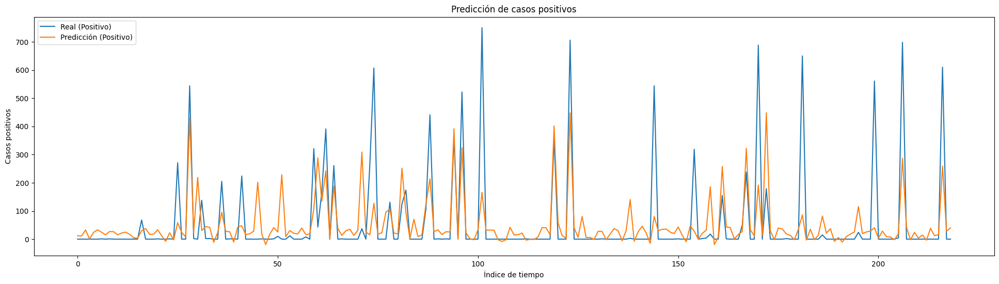

RMSE Positivo: 116.60


In [ ]:
# Visualizar resultados
plt.figure(figsize=(24, 6))
plt.plot(y_test_inv[:, 0], label='Real (Positivo)')
plt.plot(pred_inv[:, 0], label='Predicción (Positivo)')
plt.title('Predicción de casos positivos')
plt.xlabel('Índice de tiempo')
plt.ylabel('Casos positivos')
plt.legend()
plt.show()

# plt.figure(figsize=(12, 6))
# plt.plot(y_test_inv[:, 1], label='Real (Negativo)')
# plt.plot(pred_inv[:, 1], label='Predicción (Negativo)')
# plt.title('Predicción de casos negativos')
# plt.xlabel('Índice de tiempo')
# plt.ylabel('Casos negativos')
# plt.legend()
# plt.show()

# Visualizar métricas
print(f"RMSE Positivo: {rmse_positivo:.2f}")
# print(f"RMSE Negativo: {rmse_negativo:.2f}")

7/7 [==============================] - 0s 4ms/step
RMSE para predicciones positivas: 116.60209219314585


<Figure size 1500x500 with 0 Axes>

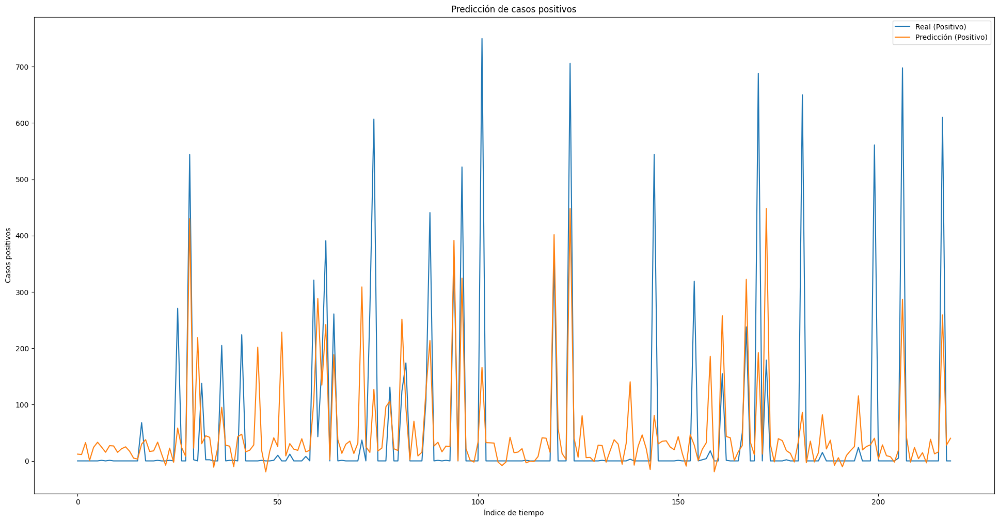

RMSE Positivo: 116.60


In [ ]:

# Realizar predicciones
y_pred = model.predict(X_test_reshaped)

# Invertir la normalización para comparar los valores predichos con los reales
y_test_inv = scaler_target.inverse_transform(y_test)
y_pred_inv = scaler_target.inverse_transform(y_pred)

# Calcular métricas de rendimiento
rmse_positivo = sqrt(mean_squared_error(y_test_inv[:, 0], y_pred_inv[:, 0]))
# rmse_negativo = sqrt(mean_squared_error(y_test_inv[:, 1], y_pred_inv[:, 1]))

# Imprimir métricas de rendimiento
print(f'RMSE para predicciones positivas: {rmse_positivo}')
# print(f'RMSE para predicciones negativas: {rmse_negativo}')

# Graficar las predicciones frente a los valores reales
plt.figure(figsize=(15, 5))

# Visualizar resultados
plt.figure(figsize=(24, 12))
plt.plot(y_test_inv[:, 0], label='Real (Positivo)')
plt.plot(pred_inv[:, 0], label='Predicción (Positivo)')
plt.title('Predicción de casos positivos')
plt.xlabel('Índice de tiempo')
plt.ylabel('Casos positivos')
plt.legend()
plt.show()

# plt.figure(figsize=(12, 6))
# plt.plot(y_test_inv[:, 1], label='Real (Negativo)')
# plt.plot(pred_inv[:, 1], label='Predicción (Negativo)')
# plt.title('Predicción de casos negativos')
# plt.xlabel('Índice de tiempo')
# plt.ylabel('Casos negativos')
# plt.legend()
# plt.show()

# Visualizar métricas
print(f"RMSE Positivo: {rmse_positivo:.2f}")
# print(f"RMSE Negativo: {rmse_negativo:.2f}")

###prueba02

In [ ]:

# Crear secuencias de tiempo

def create_sequences(data, time_steps=1):
    X, y = [], []
    for i in range(len(data) - time_steps - 1):
        a = data[i:(i + time_steps), 0:-1]
        X.append(a)
        y.append(data[i + time_steps, -1])
    return np.array(X), np.array(y)


In [ ]:
# Preprocesamiento de Datos

data = df_estandarizado[['Temperatura', 'Humedad', 'Concepcion_Positivo',
       'Concepcion_Negativo', 'Neembucu_Positivo', 'Neembucu_Negativo',
       'Asuncion-Central_Positivo', 'Asuncion-Central_Negativo']].values
#


###################################################################################################
scaler = MinMaxScaler(feature_range=(0, 1))
data_scaled = scaler.fit_transform(data)
time_steps = 10
X, y = create_sequences(data_scaled, time_steps)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Construcción del modelo RNN
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
# model.add(LSTM(units=100, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2]), kernel_regularizer=l1_l2(l1=0.01, l2=0.001)))
model.add(Dropout(0.2))
model.add(LSTM(units=50))
# model.add(LSTM(units=100, return_sequences=True, kernel_regularizer=l1_l2(l1=0.01, l2=0.01)))
# model.add(Dropout(0.2))
# model.add(LSTM(units=100, kernel_regularizer=l1_l2(l1=0.1, l2=0.01)))
model.add(Dense(1))
# # Entrenamiento del modelo
# model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=2)

# model.add(Dense(1, kernel_regularizer=l1_l2(l1=0.1, l2=0.01)))
model.compile(loss='mean_squared_error', optimizer='adam')

early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min')
model_checkpoint = ModelCheckpoint(filepath='best_model.h5', monitor='val_loss', save_best_only=True, verbose=1)
#Entrenamiento del modelo con callbacks
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=2, callbacks=[early_stopping, model_checkpoint])


# Evaluación del modelo
pred = model.predict(X_test)
# inv la normalización para comparar los valores predichos con los reales
y_test_inv = scaler.inverse_transform(np.concatenate((X_test[:, -1, :], y_test.reshape(-1, 1)), axis=1))[:, -1]
pred_inv = scaler.inverse_transform(np.concatenate((X_test[:, -1, :], pred), axis=1))[:, -1]

#################################################################################################
# # Escalar los datos
# scaler = MinMaxScaler(feature_range=(0, 1))
# data_scaled = scaler.fit_transform(data)
# time_steps = 10
# X, y = create_sequences(data_scaled, time_steps)

# # Dividir los datos
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Construcción del modelo RNN mejorado
# model = Sequential()
# model.add(LSTM(units=100, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2]), kernel_regularizer=l1_l2(l1=0.01, l2=0.001)))
# # model.add(LSTM(units=100, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
# model.add(Dropout(0.2))
# # model.add(LSTM(units=100, return_sequences=True, kernel_regularizer=l1_l2(l1=0.01, l2=0.01)))
# model.add(LSTM(units=100, return_sequences=True))
# model.add(Dropout(0.2))
# # model.add(LSTM(units=100, kernel_regularizer=l1_l2(l1=0.1, l2=0.01)))
# model.add(LSTM(units=100))
# model.add(Dropout(0.2))
# # model.add(Dense(1, kernel_regularizer=l1_l2(l1=0.1, l2=0.01)))
# model.add(Dense(1))


#  # Construcción del modelo RNN
# # model = Sequential()
# # model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
# # model.add(Dropout(0.2))
# # model.add(LSTM(units=50))
# # model.add(Dropout(0.2))
# # model.add(Dense(1))
# # model.compile(loss='mean_squared_error', optimizer='adam')


# # Optimizador con programación de tasa de aprendizaje
# # adam_optimizer = Adam(learning_rate=0.001)
# model.compile(loss='mean_absolute_error', optimizer='adam')

# # Callbacks
# early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min')
# model_checkpoint = ModelCheckpoint(filepath='best_model.h5', monitor='val_loss', save_best_only=True, verbose=1)
# #Entrenamiento del modelo con callbacks
# model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=2, callbacks=[early_stopping, model_checkpoint])

# # # Entrenamiento del modelo
# # model.fit(X_train, y_train, epochs=55, batch_size=32, validation_data=(X_test, y_test), verbose=2)

# # Evaluación del modelo
# pred = model.predict(X_test)
# # inv la normalización para comparar los valores predichos con los reales
# y_test_inv = scaler.inverse_transform(np.concatenate((X_test[:, -1, :], y_test.reshape(-1, 1)), axis=1))[:, -1]
# pred_inv = scaler.inverse_transform(np.concatenate((X_test[:, -1, :], pred), axis=1))[:, -1]
###################################################################################################

KeyError: "['Concepcion_Positivo', 'Concepcion_Negativo', 'Neembucu_Positivo', 'Neembucu_Negativo', 'Asuncion-Central_Positivo', 'Asuncion-Central_Negativo'] not in index"

In [ ]:

# Asumiendo que 'pred_inv' son tus predicciones y 'y_test_inv' los valores reales, ambos ya inversos de la estandarización
plt.figure(figsize=(15, 7))
plt.plot(y_test_inv, label='Real', color='blue', alpha=0.5)
plt.plot(pred_inv, label='Predicción', color='red', alpha=0.5)
plt.title('Comparación de valores reales y predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Incidencia de Rayos')
plt.legend()
plt.show()

#Prueba 04

In [ ]:
# Remuestreo de los datos
df_temp_humedad_resampled = df_temp_humedad.resample('1D').mean()

df_rayos_resampled = {}
for lugar in ['Asuncion', 'Central','Concepcion','Neembucu']:
    # Suponiendo que los archivos CSV ya tienen las columnas 'Positivo' y 'Negativo'

    df_rayos_resampled[lugar] = df_rayos[lugar].resample('1D').sum().round()    # Renombrar las columnas para incluir el nombre de la ciudad como prefijo
    df_rayos_resampled[lugar] =tratar_valores_atipicos(df_rayos_resampled[lugar], ['Positivo', 'Negativo'])
    df_rayos_resampled[lugar].columns = [f'{lugar}_{col}' for col in df_rayos_resampled[lugar].columns]
df_temp_humedad_resampled = tratar_valores_atipicos(df_temp_humedad_resampled, ['Temperatura', 'Humedad'])
df_temp_humedad_resampled = df_temp_humedad_resampled.round()

# for lugar, archivo in archivos_rayos.items():
#     df_temp = df_rayos_resampled
#     # df_temp = df_temp['2016':'2021']
#     df_temp = tratar_valores_atipicos(df_temp, ['Positivo', 'Negativo'])
#     df_rayos_resampled[lugar] = df_temp
# Combinar los datos de temperatura, humedad con los datos de incidencia de rayos
df_combinado = pd.concat([df_temp_humedad_resampled, *df_rayos_resampled.values()], axis=1)
df_combinado['Asuncion-Central_Positivo'] = df_combinado['Central_Positivo'] + df_combinado['Asuncion_Positivo']
df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']
# print(df_combinado['Neembucu_Positivo'])

# Estandarizar los datos
scaler_std = StandardScaler()
df_estandarizado = pd.DataFrame(scaler_std.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)


In [ ]:
print(df_combinado)

In [ ]:

# Convertir la columna 'timestamp' a datetime
df_combinado['timestamp'] = pd.to_datetime(df_combinado.index)

In [ ]:
df_combinado['Asuncion_Central_Positivo']=df_combinado['Asuncion-Central_Positivo']
df_combinado['Asuncion_Central_Negativo']=df_combinado['Asuncion-Central_Negativo']
df_combinado=df_combinado.drop(columns=['Asuncion-Central_Negativo','Asuncion-Central_Positivo','Central_Positivo',  'Central_Negativo','Asuncion_Positivo',  'Asuncion_Negativo'])

In [ ]:
print(df_combinado)

In [ ]:
# Aplicar transformación logarítmica a las columnas de conteo
conteos_cols = [
       'Asuncion_Snet_Negativo',
       'Asuncion_Snet_Positivo',
        'Central_Snet_Negativo',
       'Central_Snet_Positivo',  'Concepcion_Positivo',
       'Concepcion_Negativo', 'Concepcion_Snet_Negativo',
        'Concepcion_Snet_Positivo',
        'Neembucu_Positivo', 'Neembucu_Negativo',
       'Neembucu_Snet_Negativo',
       'Neembucu_Snet_Positivo',
       'Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']
for col in conteos_cols:
    df_combinado[col + '_log'] = np.log1p(df_combinado[col])

In [ ]:
print(df_combinado.columns
      )

In [ ]:
import pandas as pd
# Debes asegurarte de tener tu DataFrame cargado con los datos

# Calcula la matriz de correlación
# matriz_corr = df_combinado.corr(method='pearson')
# matriz_corr = df_combinado.corr(method='spearman') # Spearman
matriz_corr = df_combinado.corr(method='kendall') # Kendall

# Imprime la matriz de correlación
# print(matriz_corr)
variables_objetivo = ['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']
matriz_corr_filtrada = matriz_corr[variables_objetivo]
print(matriz_corr_filtrada)





### Modelado de Regresión Binomial Negativa

In [ ]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

formula_positivo = 'Asuncion_Central_Positivo_log ~ Temperatura + Humedad + Asuncion_Snet_Negativo_log + Asuncion_Snet_Positivo_log + Concepcion_Positivo_log + Neembucu_Snet_Negativo_log +  Neembucu_Snet_Positivo_log + Central_Snet_Negativo_log + Central_Snet_Positivo_log + Concepcion_Snet_Negativo_log + Concepcion_Snet_Positivo_log + Concepcion_Negativo_log + Neembucu_Positivo_log + Neembucu_Negativo_log  '

# Para incidencias negativas
formula_negativo = 'Asuncion_Central_Negativo_log ~ Temperatura + Humedad + Concepcion_Positivo_log + Concepcion_Negativo_log + Neembucu_Positivo_log + Neembucu_Negativo_log'
# Ajustar el modelo
modelo = smf.glm(formula=formula_positivo, data=df_combinado, family=sm.families.NegativeBinomial()).fit()

# Ver el resumen del modelo
print(modelo.summary())

### Uso Complementario con LSTM

In [ ]:
# Número de lags (retardos) a incluir
n_lags = 3

# Crear características retardadas para Asuncion_Central_Positivo y Asuncion_Central_Negativo
for i in range(1, n_lags + 1):
    df_combinado[f'Asuncion_Central_Positivo_lag{i}'] = df_combinado['Asuncion_Central_Positivo_log'].shift(i)
    df_combinado[f'Asuncion_Central_Negativo_lag{i}'] = df_combinado['Asuncion_Central_Negativo_log'].shift(i)

    df_combinado[f'Neembucu_Negativo_lag{i}'] = df_combinado['Neembucu_Negativo_log'].shift(i)
    df_combinado[f'Neembucu_Positivo_lag{i}'] = df_combinado['Neembucu_Positivo_log'].shift(i)

# Eliminar filas con NaN resultantes de la creación de lags
df_combinado.dropna(inplace=True)


In [ ]:
# # Aplicar transformación logarítmica a las variables objetivo
# df_combinado['Asuncion_Central_Positivo_log'] = np.log1p(df_combinado['Asuncion_Central_Positivo'])
# df_combinado['Asuncion_Central_Negativo_log'] = np.log1p(df_combinado['Asuncion_Central_Negativo'])

# # Preparar las características y la variable objetivo
# features = df_combinado.drop(['timestamp','Asuncion_Central_Positivo','Concepcion_Positivo_log' , 'Concepcion_Positivo', 'Asuncion_Central_Negativo', 'Asuncion_Central_Positivo_log', 'Asuncion_Central_Negativo_log'], axis=1)
# target_positivo = df_combinado['Asuncion_Central_Positivo_log']
# target_negativo = df_combinado['Asuncion_Central_Negativo_log']

In [ ]:


# print(df_combinado.describe())
print(features.describe())

In [ ]:
# df_combinado=df_combinado.drop(columns=['timestamp'])
# features = df_combinado.drop([ 'Asuncion_Central_Positivo','Concepcion_Positivo', 'Asuncion_Central_Negativo', 'Asuncion_Central_Positivo_log', 'Asuncion_Central_Negativo_log'], axis=1)
# target = df_combinado[['Asuncion_Central_Positivo_log', 'Asuncion_Central_Negativo_log']]
# target2= df_combinado['Asuncion_Central_Positivo_log']
# target1=df_combinado['Asuncion_Central_Negativo_log']

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = RobustScaler()
features_scaled = scaler.fit_transform(features)
# features_scaled_1 = scaler.fit_transform(features)
# features_scaled_2= scaler.fit_transform(features)

In [ ]:
print(features_scaled.shape[1])

### Complementario lstm ss


In [ ]:


# Variables objetivo
target_positivo = df_combinado['Asuncion_Central_Negativo']
target_negativo = df_combinado['Asuncion_Central_Positivo']

# Características
features = df_combinado.drop(['timestamp','Asuncion_Central_Positivo','Asuncion_Central_Negativo'], axis=1)
# Crear características retardadas
for i in range(1, n_lags + 1):
    df_combinado[f'Asuncion_Central_Positivo_lag{i}'] = df_combinado['Asuncion_Central_Positivo'].shift(i)
    df_combinado[f'Asuncion_Central_Negativo_lag{i}'] = df_combinado['Asuncion_Central_Negativo'].shift(i)

# Eliminar filas con NaN
df_combinado.dropna(inplace=True)

# Transformación logarítmica
df_combinado['Asuncion_Central_Positivo_log'] = np.log1p(df_combinado['Asuncion_Central_Positivo'])
df_combinado['Asuncion_Central_Negativo_log'] = np.log1p(df_combinado['Asuncion_Central_Negativo'])

# Preparar las variables
features = df_combinado.drop(['timestamp','Asuncion_Central_Positivo','Asuncion_Central_Negativo'], axis=1)
target_positivo = df_combinado['Asuncion_Central_Positivo_log']
target_negativo = df_combinado['Asuncion_Central_Negativo_log']

# Escalado de las características
scaler = RobustScaler()
features_scaled = scaler.fit_transform(features)

# Implementar el modelo LSTM
model = Sequential()
model.add(LSTM(units=128, input_shape=(features_scaled.shape[1],)))
model.add(Dense(units=1))

model.compile(optimizer='adam', loss='mse')

model.fit(features_scaled, target_positivo, epochs=100)

score = model.evaluate(features_scaled, target_positivo)
print('Score:', score)

predicciones = model.predict(features_scaled)


### predecir ambos

In [ ]:
n_caracteristicas = features_scaled.shape[1]

# División de datos (asumiendo un enfoque univariante para simplificar)
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)

# Reestructurar para LSTM ([muestras, pasos de tiempo, características])
X_train_lstm = X_train.reshape((X_train.shape[0], 1, n_caracteristicas))
X_test_lstm = X_test.reshape((X_test.shape[0], 1, n_caracteristicas))

In [ ]:

from keras.models import Sequential
from keras.layers import LSTM, Dense




modelo_lstm = Sequential()
modelo_lstm.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(1, n_caracteristicas)))
modelo_lstm.add(Dropout(0.5))
modelo_lstm.add(LSTM(32, return_sequences=False))
modelo_lstm.add(Dropout(0.50))
modelo_lstm.add(Dense(2))  # Prediciendo dos variables objetivo
modelo_lstm.compile(optimizer='adam', loss='mse')

modelo_lstm.fit(X_train_lstm, y_train, epochs=55, batch_size=32, validation_data=(X_test_lstm, y_test))




In [ ]:
# # Escalar los datos
# scaler = MinMaxScaler(feature_range=(0, 1))
# data_scaled = scaler.fit_transform(data)
# time_steps = 10
# X, y = create_sequences(data_scaled, time_steps)

# # Dividir los datos
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Construcción del modelo RNN mejorado
# model = Sequential()
# model.add(LSTM(units=100, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2]), kernel_regularizer=l1_l2(l1=0.01, l2=0.001)))
# # model.add(LSTM(units=100, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
# model.add(Dropout(0.2))
# # model.add(LSTM(units=100, return_sequences=True, kernel_regularizer=l1_l2(l1=0.01, l2=0.01)))
# model.add(LSTM(units=100, return_sequences=True))
# model.add(Dropout(0.2))
# # model.add(LSTM(units=100, kernel_regularizer=l1_l2(l1=0.1, l2=0.01)))
# model.add(LSTM(units=100))
# model.add(Dropout(0.2))
# # model.add(Dense(1, kernel_regularizer=l1_l2(l1=0.1, l2=0.01)))
# model.add(Dense(1))

In [ ]:


# Convertir y_test y y_pred a arrays de NumPy si es necesario
y_test_np = y_test.to_numpy() if isinstance(y_test, pd.DataFrame) or isinstance(y_test, pd.Series) else y_test
y_pred_np = y_pred if isinstance(y_pred, np.ndarray) else y_pred.to_numpy()

# Asegúrate de que y_pred_np tenga la forma correcta
if len(y_pred_np.shape) == 1:
    y_pred_np = y_pred_np.reshape(-1, 1)

# Visualización de las predicciones para la primera variable objetivo
plt.figure(figsize=(20, 6))

plt.plot(y_test_np[5000:5100:, 0], label='Valores Reales Positivo', color='blue')  # Ajustar según sea necesario
plt.plot(y_pred_np[5000:5100, 0], label='Predicciones Positivo', color='red', linestyle='--')
plt.title('Comparación de Predicciones LSTM vs Valores Reales')
plt.xlabel('Muestras')
plt.ylabel('Log de Incidencias Positivas') #
plt.legend()
plt.show()

# Visualización de las predicciones para la segunda variable objetivo (incidencias negativas)
plt.figure(figsize=(20, 6))
plt.plot(y_test_np[:100, 1], label='Valores Reales Negativo', color='blue')  # Ajuste para seleccionar la columna de incidencias negativas
plt.plot(y_pred_np[:100, 1], label='Predicciones Negativo', color='red', linestyle='--')
plt.title('Comparación de Predicciones LSTM vs Valores Reales para Incidencias Negativas')
plt.xlabel('Muestras')
plt.ylabel('Log de Incidencias Negativas')
plt.legend()
plt.show()

### predecir negativos


In [ ]:
n_caracteristicas = features_scaled.shape[1]

# División de datos (asumiendo un enfoque univariante para simplificar)
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target1, test_size=0.2, random_state=42)

# Reestructurar para LSTM ([muestras, pasos de tiempo, características])
X_train_lstm = X_train.reshape((X_train.shape[0], 1, n_caracteristicas))
X_test_lstm = X_test.reshape((X_test.shape[0], 1, n_caracteristicas))
from keras.models import Sequential
from keras.layers import LSTM, Dense


In [ ]:




modelo_lstm = Sequential()
modelo_lstm.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(1, n_caracteristicas)))
modelo_lstm.add(Dropout(0.3))
modelo_lstm.add(LSTM(32, return_sequences=False))
modelo_lstm.add(Dropout(0.2))
modelo_lstm.add(Dense(1))  # Prediciendo dos variables objetivo
modelo_lstm.compile(optimizer='adam', loss='mse')

modelo_lstm.fit(X_train_lstm, y_train, epochs=55, batch_size=32, validation_data=(X_test_lstm, y_test))


In [ ]:

# Convertir y_test y y_pred a arrays de NumPy si es necesario
y_test_np = y_test.to_numpy() if isinstance(y_test, pd.DataFrame) or isinstance(y_test, pd.Series) else y_test
y_pred_np = y_pred if isinstance(y_pred, np.ndarray) else y_pred.to_numpy()

# Asegúrate de que y_pred_np tenga la forma correcta
if len(y_pred_np.shape) == 1:
    y_pred_np = y_pred_np.reshape(-1, 1)

# Visualización de las predicciones para la primera variable objetivo
# plt.figure(figsize=(20, 6))

# plt.plot(y_test_np[:100:, 0], label='Valores Reales Positivo', color='blue')  # Ajustar según sea necesario
# plt.plot(y_pred_np[:100, 0], label='Predicciones Positivo', color='red', linestyle='--')
# plt.title('Comparación de Predicciones LSTM vs Valores Reales')
# plt.xlabel('Muestras')
# plt.ylabel('Log de Incidencias Positivas') #
# plt.legend()
# plt.show()


# Visualización de las predicciones para la segunda variable objetivo (incidencias negativas)
plt.figure(figsize=(20, 6))
plt.plot(y_test_np[:500], label='Valores Reales Negativo', color='blue')  # Ajuste para seleccionar la columna de incidencias negativas
plt.plot(y_pred_np[:500], label='Predicciones Negativo', color='red', linestyle='--')
plt.title('Comparación de Predicciones LSTM vs Valores Reales para Incidencias Negativas')
plt.xlabel('Muestras')
plt.ylabel('Log de Incidencias Negativas')
plt.legend()
plt.show()


### Predicciones positivas

In [ ]:
n_caracteristicas = features_scaled.shape[1]

# División de datos (asumiendo un enfoque univariante para simplificar)
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target2, test_size=0.2, random_state=42)

# Reestructurar para LSTM ([muestras, pasos de tiempo, características])
X_train_lstm = X_train.reshape((X_train.shape[0], 1, n_caracteristicas))
X_test_lstm = X_test.reshape((X_test.shape[0], 1, n_caracteristicas))
from keras.models import Sequential
from keras.layers import LSTM, Dense


In [ ]:

modelo_lstm = Sequential()
modelo_lstm.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(1, n_caracteristicas)))
modelo_lstm.add(Dropout(0.3))
modelo_lstm.add(LSTM(64, return_sequences=False))
modelo_lstm.add(Dropout(0.2))
modelo_lstm.add(Dense(1))  # Prediciendo dos variables objetivo
modelo_lstm.compile(optimizer='adam', loss='mse')

modelo_lstm.fit(X_train_lstm, y_train, epochs=55, batch_size=32, validation_data=(X_test_lstm, y_test))


In [ ]:
# print(y_pred_np)

In [ ]:

# Convertir y_test y y_pred a arrays de NumPy si es necesario
y_test_np = y_test.to_numpy() if isinstance(y_test, pd.DataFrame) or isinstance(y_test, pd.Series) else y_test
y_pred_np = y_pred if isinstance(y_pred, np.ndarray) else y_pred.to_numpy()

# Asegúrate de que y_pred_np tenga la forma correcta
if len(y_pred_np.shape) == 1:
    y_pred_np = y_pred_np.reshape(-1, 1)

# Visualización de las predicciones para la primera variable objetivo
# plt.figure(figsize=(20, 6))

# plt.plot(y_test_np[:100:, 0], label='Valores Reales Positivo', color='blue')  # Ajustar según sea necesario
# plt.plot(y_pred_np[:100, 0], label='Predicciones Positivo', color='red', linestyle='--')
# plt.title('Comparación de Predicciones LSTM vs Valores Reales')
# plt.xlabel('Muestras')
# plt.ylabel('Log de Incidencias Positivas') #
# plt.legend()
# plt.show()


# Visualización de las predicciones para la segunda variable objetivo (incidencias negativas)
plt.figure(figsize=(20, 6))
plt.plot(y_test_np[:500], label='Valores Reales Polaridad Positiva', color='blue')  # Ajuste para seleccionar la columna de incidencias negativas
plt.plot(y_pred_np[:500], label='Predicciones Polarid Positiva', color='red', linestyle='--')
plt.title('Comparación de Predicciones LSTM vs Valores Reales para Incidencias Positivas')
plt.xlabel('Muestras')
plt.ylabel('Log de Incidencias polarid. Positivas')
plt.legend()
plt.show()


# Prueba modelo completo

In [ ]:
# Remuestreo de los datos
df_temp_humedad_resampled = df_temp_humedad.resample('1D').mean()

df_rayos_resampled = {}
for lugar in ['Asuncion', 'Central','Concepcion','Neembucu']:
    # Suponiendo que los archivos CSV ya tienen las columnas 'Positivo' y 'Negativo'

    df_rayos_resampled[lugar] = df_rayos[lugar].resample('1D').sum().round()    # Renombrar las columnas para incluir el nombre de la ciudad como prefijo
    df_rayos_resampled[lugar] =tratar_valores_atipicos(df_rayos_resampled[lugar], ['Positivo', 'Negativo'])
    df_rayos_resampled[lugar].columns = [f'{lugar}_{col}' for col in df_rayos_resampled[lugar].columns]
df_temp_humedad_resampled = tratar_valores_atipicos(df_temp_humedad_resampled, ['Temperatura', 'Humedad'])
df_temp_humedad_resampled = df_temp_humedad_resampled.round()

# for lugar, archivo in archivos_rayos.items():
#     df_temp = df_rayos_resampled
#     # df_temp = df_temp['2016':'2021']
#     df_temp = tratar_valores_atipicos(df_temp, ['Positivo', 'Negativo'])
#     df_rayos_resampled[lugar] = df_temp
# Combinar los datos de temperatura, humedad con los datos de incidencia de rayos
df_combinado = pd.concat([df_temp_humedad_resampled, *df_rayos_resampled.values()], axis=1)
df_combinado['Asuncion-Central_Positivo'] = df_combinado['Central_Positivo'] + df_combinado['Asuncion_Positivo']
df_combinado['Asuncion-Central_Negativo'] = df_combinado['Central_Negativo'] + df_combinado['Asuncion_Negativo']
# print(df_combinado['Neembucu_Positivo'])

# Estandarizar los datos
scaler_std = StandardScaler()
df_estandarizado = pd.DataFrame(scaler_std.fit_transform(df_combinado), columns=df_combinado.columns, index=df_combinado.index)


In [ ]:

# Convertir la columna 'timestamp' a datetime
df_combinado['timestamp'] = pd.to_datetime(df_combinado.index)
print(df_combinado)

In [ ]:
df_combinado['Asuncion_Central_Positivo']=df_combinado['Asuncion-Central_Positivo']
df_combinado['Asuncion_Central_Negativo']=df_combinado['Asuncion-Central_Negativo']
df_combinado=df_combinado.drop(columns=['Asuncion-Central_Negativo','Asuncion-Central_Positivo','Central_Positivo',  'Central_Negativo','Asuncion_Positivo',  'Asuncion_Negativo'])

In [ ]:
# Aplicar transformación logarítmica a las columnas de conteo
conteos_cols = [
       'Asuncion_Snet_Negativo',
       'Asuncion_Snet_Positivo',
        'Central_Snet_Negativo',
       'Central_Snet_Positivo',
       'Concepcion_Positivo',
       'Concepcion_Negativo',
       'Concepcion_Snet_Negativo',
        'Concepcion_Snet_Positivo',
        'Neembucu_Positivo',
        'Neembucu_Negativo',
       'Neembucu_Snet_Negativo',
       'Neembucu_Snet_Positivo',
       'Asuncion_Central_Positivo',
       'Asuncion_Central_Negativo']
for col in conteos_cols:
    df_combinado[col + '_log'] = np.log1p(df_combinado[col])

In [ ]:
# print(df_combinado.columns)
df_combinado_nl=df_combinado.drop(columns=['Asuncion_Snet_Negativo_log',
       'Asuncion_Snet_Positivo_log', 'Central_Snet_Negativo_log',
       'Central_Snet_Positivo_log', 'Concepcion_Positivo_log',
       'Concepcion_Negativo_log', 'Concepcion_Snet_Negativo_log',
       'Concepcion_Snet_Positivo_log', 'Neembucu_Positivo_log',
       'Neembucu_Negativo_log', 'Neembucu_Snet_Negativo_log',
       'Neembucu_Snet_Positivo_log', 'Asuncion_Central_Positivo_log',
       'Asuncion_Central_Negativo_log'])
df_combinado_nl=df_combinado_nl.drop(columns=['timestamp'])
df_combinado_lg=df_combinado.drop(columns=['Asuncion_Snet_Negativo',
       'Asuncion_Snet_Positivo', 'Central_Snet_Negativo',
       'Central_Snet_Positivo', 'Concepcion_Positivo', 'Concepcion_Negativo',
       'Concepcion_Snet_Negativo', 'Concepcion_Snet_Positivo',
       'Neembucu_Positivo', 'Neembucu_Negativo', 'Neembucu_Snet_Negativo',
       'Neembucu_Snet_Positivo'])
df_combinado_lg=df_combinado_lg.drop(columns=['timestamp'])
print(df_combinado_nl.columns)
print(df_combinado_lg.columns)

In [ ]:
import pandas as pd
# Debes asegurarte de tener tu DataFrame cargado con los datos

# Calcula la matriz de correlación
# matriz_corr = df_combinado.corr(method='pearson')
# matriz_corr = df_combinado.corr(method='spearman') # Spearman
matriz_corr = df_combinado.corr(method='kendall') # Kendall

# Imprime la matriz de correlación
# print(matriz_corr)
variables_objetivo = ['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']
matriz_corr_filtrada = matriz_corr[variables_objetivo]
print(matriz_corr_filtrada)





## Gemini

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
# Seleccionar todas las columnas excepto las variables objetivo
columnas_caracteristicas = list(df_combinado_nl.drop(columns=['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']))

# Seleccionar las variables objetivo
columnas_objetivo = ['Asuncion_Central_Positivo',
                     'Asuncion_Central_Negativo',
                     ]

# Filtrar el DataFrame por las características
df_caracteristicas = df_combinado_nl[columnas_caracteristicas]

In [ ]:
series_tiempo = np.array(df_caracteristicas.values)


In [ ]:
series_tiempo = series_tiempo.reshape((series_tiempo.shape[0], 1, series_tiempo.shape[1]))


In [ ]:

# Visualization Functions (modular for reusability)
def plot_individual_accuracy(history):
  # Assuming history.history contains validation and training accuracy
  plt.plot(history.history['accuracy'], label='Training Accuracy')
  plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(loc='lower right')
  plt.grid(True)
  plt.show()

def plot_loss(history):
  # Assuming history.history contains training and validation loss
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title('Model Loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(loc='lower right')
  plt.grid(True)
  plt.show()

def plot_error_distribution(model, X_test, y_test):
  # Assuming X_test and y_test are your test data
  predictions = model.predict(X_test)
  errors = y_test - predictions

  # Assuming errors is a 1D array
  plt.hist(errors)
  plt.title('Error Distribution')
  plt.xlabel('Error')
  plt.ylabel('Frequency')
  plt.grid(True)
  plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Data Preparation
columnas_caracteristicas = list(df_combinado_nl.drop(columns=['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']))
columnas_objetivo = ['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']

# Add a new column for the sum of target variables
df_combinado_nl['objetivo'] = df_combinado_nl[columnas_objetivo].sum(axis=1)  # Sum across columns

series_tiempo = np.array(df_combinado_nl[columnas_caracteristicas].values)
series_tiempo = series_tiempo.reshape((series_tiempo.shape[0], 1, series_tiempo.shape[1]))

# Model Creation (Single Output for Combined Target)
model = Sequential()
model.add(LSTM(units=128, input_shape=(series_tiempo.shape[1], series_tiempo.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(units=1, activation='sigmoid', name='objetivo'))  # Single output for combined target
model.compile(optimizer='adam', loss='binary_crossentropy')  # Single loss for combined target

# Model Training
history = model.fit(series_tiempo, y=df_combinado_nl['objetivo'], epochs=100)  # Use 'objetivo' column as target

# Visualization Functions (same as before)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split

# Visualization Functions
def plot_individual_accuracy(history):
  plt.plot(history.history['accuracy'], label='Training Accuracy')
  plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(loc='lower right')
  # plt.grid(True)
  plt.show()

def plot_loss(history):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title('Model Loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(loc='upper right')
  # plt.grid(True)
  plt.show()


In [ ]:

# Data Preparation
columnas_caracteristicas = list(df_combinado_nl.drop(columns=['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']))
columnas_objetivo = ['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']

# Add a new column for the sum of target variables
df_combinado_nl['objetivo'] = df_combinado_nl[columnas_objetivo].sum(axis=1)  # Sum across columns

# Create test and training sets
X = np.array(df_combinado_nl[columnas_caracteristicas].values)
y = df_combinado_nl['objetivo']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  # Adjust test_size as needed

# Reshape data for LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Model Creation (Single Output for Combined Target)
model = Sequential()
model.add(LSTM(units=128, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(units=1, activation='sigmoid', name='objetivo'))  # Single output for combined target
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])  # Include accuracy metric


In [ ]:

# Model Training
history = model.fit(X_train, y=y_train, epochs=100, validation_data=(X_test, y_test))  # Use validation data




In [ ]:

# Visualize results
plot_individual_accuracy(history)
plot_loss(history)

# Evaluate model performance on test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print('Test Loss:', test_loss)
print('Test Accuracy:', test_accuracy)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Data Preparation (assuming you have your data in df_combinado_nl)
columnas_caracteristicas = list(df_combinado_nl.drop(columns=['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']))
columnas_objetivo = ['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']

series_tiempo = np.array(df_combinado_nl[columnas_caracteristicas].values)
series_tiempo = series_tiempo.reshape((series_tiempo.shape[0], 1, series_tiempo.shape[1]))

# Model Creation
model = Sequential()
model.add(LSTM(units=128, input_shape=(series_tiempo.shape[1], series_tiempo.shape[2])))
model.add(Dropout(0.2))
for nombre_objetivo in ['objetivo']:
  model.add(Dense(units=1, activation='sigmoid', name=nombre_objetivo))  # One unit per target variable

# Compile with separate loss for each target
model.compile(optimizer='adam', loss='binary_crossentropy',  # Single loss function (optional for efficiency)
              loss_weights={'Asuncion_Central_Positivo': 0.5, 'Asuncion_Central_Negativo': 0.5})  # Weights for individual losses

# Model Training
history = model.fit(series_tiempo, y=df_combinado_nl['objetivo'], epochs=100)

# Visualization Functions (same as before)

# Visualization Calls
plot_individual_accuracy(history, columnas_objetivo)
plot_loss(history)
plot_error_distribution(model, X_test, y_test, columnas_objetivo)  # Replace with your X_test and y_test if available


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Data Preparation (assuming you have your data in df_combinado_nl)
columnas_caracteristicas = list(df_combinado_nl.drop(columns=['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']))
columnas_objetivo = ['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']

series_tiempo = np.array(df_combinado_nl[columnas_caracteristicas].values)
series_tiempo = series_tiempo.reshape((series_tiempo.shape[0], 1, series_tiempo.shape[1]))

# Model Creation
model = Sequential()
model.add(LSTM(units=128, input_shape=(series_tiempo.shape[1], series_tiempo.shape[2])))
model.add(Dropout(0.2))

# Choose an approach based on your desired model structure:

# Option 1: Separate Outputs for Each Target Variable
if len(columnas_objetivo) > 1:  # Check if there are multiple target variables
    for nombre_objetivo in columnas_objetivo:
        model.add(Dense(units=1, activation='sigmoid', name=nombre_objetivo))
    model.compile(optimizer='adam', loss='binary_crossentropy',  # Single loss for efficiency (optional)
                  loss_weights=dict(zip(columnas_objetivo, [0.5 for _ in columnas_objetivo])))  # Weights for individual losses

# Option 2: Single Output (consider if targets are highly correlated)
else:
    model.add(Dense(units=1, activation='sigmoid', name='output'))  # Single output for both targets
    model.compile(optimizer='adam', loss='binary_crossentropy')  # Single loss for both targets

# Model Training
history = model.fit(series_tiempo, y=df_combinado_nl[columnas_objetivo], epochs=100)

# Visualization Functions (same as before)

# Visualization Calls
plot_individual_accuracy(history, columnas_objetivo)
plot_loss(history)
plot_error_distribution(model, X_test, y_test, columnas_objetivo)  # Replace with your X_test and y_test if available


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Data Preparation (assuming you have your data in df_combinado_nl)
columnas_caracteristicas = list(df_combinado_nl.drop(columns=['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']))
columnas_objetivo = ['Asuncion_Central_Positivo', 'Asuncion_Central_Negativo']

series_tiempo = np.array(df_combinado_nl[columnas_caracteristicas].values)
series_tiempo = series_tiempo.reshape((series_tiempo.shape[0], 1, series_tiempo.shape[1]))

# Model Creation
model = Sequential()
model.add(LSTM(units=128, input_shape=(series_tiempo.shape[1], series_tiempo.shape[2])))
model.add(Dropout(0.2))

# Handle Model Structure and Loss Weights Dynamically
num_targets = len(columnas_objetivo)
if num_targets > 1:
    # Option 1: Separate Outputs for Each Target Variable
    for nombre_objetivo in columnas_objetivo:
        model.add(Dense(units=1, activation='sigmoid', name=nombre_objetivo))
    model.compile(optimizer='adam', loss='binary_crossentropy',  # Single loss for efficiency (optional)
                  loss_weights=dict(zip(columnas_objetivo, [0.5 for _ in columnas_objetivo])))  # Weights for individual losses
else:
    # Option 2: Single Output (consider if targets are highly correlated)
    model.add(Dense(units=1, activation='sigmoid', name='output'))  # Single output for both targets
    model.compile(optimizer='adam', loss='binary_crossentropy')  # Single loss for both targets

# Model Training
history = model.fit(series_tiempo, y=df_combinado_nl[columnas_objetivo], epochs=100)

# Visualization Functions (same as before)

# Visualization Calls
plot_individual_accuracy(history, columnas_objetivo)
plot_loss(history)
plot_error_distribution(model, X_test, y_test, columnas_objetivo)  # Replace with your X_test and y_test if available


In [ ]:
# Definir el modelo
model = Sequential()

# Capa LSTM
model.add(LSTM(units=128, input_shape=(series_tiempo.shape[1], series_tiempo.shape[2])))

# Capa Dropout
model.add(Dropout(0.2))

# Capas Densa para cada variable objetivo (una para cada salida)
for nombre_objetivo in columnas_objetivo:
    model.add(Dense(units=1, activation='relu', name=nombre_objetivo))

# Compilar el modelo
# model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])  # General accuracy
for nombre_objetivo in columnas_objetivo:
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[f'{nombre_objetivo}_accuracy'])  # Individual accuracy per variable


In [ ]:
# Entrenar el modelo
history=model.fit(series_tiempo, y=df_combinado_nl[columnas_objetivo], epochs=100)


In [ ]:
# Evaluar el modelo
scores = model.evaluate(series_tiempo, y=df_combinado_nl[columnas_objetivo], verbose=0)
print("Precisión:", scores[1])
# Import libraries (if not already imported)
import matplotlib.pyplot as plt

# Assuming history is available from model training
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Precisión vs. Época')
plt.ylabel('Precisión')
plt.xlabel('Época')
plt.legend(['Entrenamiento', 'Validación'], loc='upper left')
plt.show()


In [ ]:
# Importar librerías
import matplotlib.pyplot as plt
import seaborn as sns

# Mostrar métricas
plt.plot(history.history['Asuncion_Central_Positivo_accuracy'])
plt.plot(history.history['Asuncion_Central_Negativo_accuracy'])
plt.title('Precisión vs. Época')
plt.ylabel('Precisión')
plt.xlabel('Época')
plt.legend(['Asuncion Central Positivo', 'Asuncion Central Negativo'], loc='upper left')
plt.show()

# Mostrar pérdida
plt.plot(history.history['loss'])
plt.title('Pérdida vs. Época')
plt.ylabel('Pérdida')
plt.xlabel('Época')
plt.show()

# Mostrar distribución de errores
for i in range(len(columnas_objetivo)):
    sns.distplot(model.predict(X_test)[:, i] - y_test[:, i])
    plt.title('Distribución de errores - ' + columnas_objetivo[i])
    plt.show()



In [ ]:
# Definir el modelo
model = Sequential()

# Capa LSTM
model.add(LSTM(units=128, input_shape=(series_tiempo.shape[1], series_tiempo.shape[2])))

# Capa Dropout
model.add(Dropout(0.2))

# Capas Densa para cada variable objetivo (una para cada salida)
model.add(Dense(units=1, activation='sigmoid', name='Asuncion_Central_Positivo'))
model.add(Dense(units=1, activation='sigmoid', name='Asuncion_Central_Negativo'))

# Compilar el modelo
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
# Entrenar el modelo
model.fit(series_tiempo, y=df_combinado_nl[columnas_objetivo], epochs=100)


In [ ]:
# Evaluar el modelo
scores = model.evaluate(series_tiempo, y=df_combinado_nl[columnas_objetivo], verbose=0)
print("Precisión:", scores[1])

In [ ]:

series_tiempo = np.array(df_combinado_nl.values)

In [ ]:

series_tiempo = series_tiempo.reshape((series_tiempo.shape[0], 1, series_tiempo.shape[1]))

#arriba

In [ ]:
ydif= y_pred_np[:,0]-y_pred_np[:,1]
ydif_series = pd.Series(ydif)

In [ ]:
print(ydif_series.describe())
print(ydif)


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

scaler = MinMaxScaler()
features_scaled = scaler.fit_transform(features)

# Definir el número de características basado en las columnas procesadas
n_caracteristicas = features_scaled.shape[1]

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target_positivo, test_size=0.2, random_state=42)

# Ajustar la forma de entrada para LSTM
X_train_lstm = X_train.reshape((X_train.shape[0], 1, n_caracteristicas))
X_test_lstm = X_test.reshape((X_test.shape[0], 1, n_caracteristicas))

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

modelo_lstm = Sequential()
modelo_lstm.add(LSTM(50, activation='relu', input_shape=(1, n_caracteristicas)))
modelo_lstm.add(Dense(1))
modelo_lstm.compile(optimizer='adam', loss='mse')

# Entrenar el modelo LSTM
history = modelo_lstm.fit(X_train_lstm, y_train, epochs=100, batch_size=32, validation_data=(X_test_lstm, y_test))

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Pérdida de Entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida de Validación')
plt.title('Pérdida del Modelo LSTM a lo Largo de las Épocas')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()
plt.show()

In [ ]:
y_pred = modelo_lstm.predict(X_test_lstm)


In [ ]:
# Invertir la transformación logarítmica para las predicciones y los valores reales
y_pred_invertido = np.expm1(y_pred.flatten())  # Aplanar el array si es necesario
y_test_invertido = np.expm1(y_test)

In [ ]:
import matplotlib.pyplot as plt

# Seleccionar un subconjunto de predicciones y valores reales para visualizar
n_visualizar = 100  # Ajusta este valor según tu preferencia

plt.figure(figsize=(14, 7))
plt.plot(y_test_invertido[:n_visualizar], label='Valores Reales', color='blue', marker='o')
plt.plot(y_pred_invertido[:n_visualizar], label='Predicciones LSTM', color='red', linestyle='--', marker='x')
plt.title('Comparación de Valores Reales vs Predicciones del Modelo LSTM')
plt.xlabel('Muestras')
plt.ylabel('Valores de la Variable Objetivo (Invertidos)')
plt.legend()
plt.show()

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target_positivo, test_size=0.2, random_state=42)

# Reorganizar los datos para cumplir con la entrada esperada por LSTM ([muestras, pasos de tiempo, características])
X_train = X_train.reshape((X_train.shape[0], 1, n_caracteristicas))
X_test = X_test.reshape((X_test.shape[0], 1, n_caracteristicas))

# Crear el modelo LSTM
modelo_lstm = Sequential()
modelo_lstm.add(LSTM(50, activation='relu', input_shape=(1, n_caracteristicas)))
modelo_lstm.add(Dense(1))
modelo_lstm.compile(optimizer='adam', loss='mse')

# Entrenar el modelo LSTM
modelo_lstm.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

In [ ]:
import matplotlib.pyplot as plt

# Visualizar la pérdida de entrenamiento y validación
plt.plot(modelo_lstm.history.history['loss'], label='train')
plt.plot(modelo_lstm.history.history['val_loss'], label='test')
plt.title('Pérdida del Modelo LSTM')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()
plt.show()

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

n_pasos_temporales = 15  # Últimos 15 días
n_caracteristicas = 2  # Temperatura y Humedad

# Definir la arquitectura LSTM
modelo_lstm = Sequential()
modelo_lstm.add(LSTM(50, activation='relu', input_shape=(n_pasos_temporales, n_caracteristicas)))
modelo_lstm.add(Dense(1))
modelo_lstm.compile(optimizer='adam', loss='mse')

# Entrenar el modelo LSTM
# modelo_lstm.fit(X_lstm, y_lstm, epochs=100, batch_size=32)

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Normalizar las características
scaler = MinMaxScaler()
features_scaled = scaler.fit_transform(features)

# Asumiendo que ya has determinado cómo estructurar tus datos para la LSTM (por ejemplo, usando series temporales de pasos de tiempo fijos)
# Esto es un ejemplo genérico, necesitarás ajustarlo a tus datos específicos
n_pasos_temporales = 1  # Esto es solo un placeholder, ajusta según tu análisis
n_caracteristicas = features_scaled.shape[1]

# Ajustar la forma de entrada para LSTM
X_lstm = features_scaled.reshape((features_scaled.shape[0], n_pasos_temporales, n_caracteristicas))

In [ ]:

X_lstm = X.reshape((X.shape[0], n_pasos_temporales, n_caracteristicas))